In [1]:
'''
Código adaptado de:
Modelos ARIMA y SARIMAX con Python por Joaquín Amat Rodrigo y Javier Escobar Ortiz,
disponible con licencia Attribution-NonCommercial-ShareAlike 4.0 International (CC BY-NC-SA 4.0 DEED
en https://www.cienciadedatos.net/documentos/py51-modelos-arima-sarimax-python.html
'''

'\nCódigo adaptado de:\nModelos ARIMA y SARIMAX con Python por Joaquín Amat Rodrigo y Javier Escobar Ortiz,\ndisponible con licencia Attribution-NonCommercial-ShareAlike 4.0 International (CC BY-NC-SA 4.0 DEED\nen https://www.cienciadedatos.net/documentos/py51-modelos-arima-sarimax-python.html\n'

In [2]:
from utils import *

from pathlib import Path
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from skforecast.sarimax import Sarimax
from skforecast.recursive import ForecasterSarimax
from skforecast.model_selection import TimeSeriesFold
from skforecast.model_selection import backtesting_sarimax
from skforecast.model_selection import grid_search_sarimax
from sklearn.model_selection import ParameterGrid


PROJECT_ROOT = Path().resolve().parent
print(f"Project root: {PROJECT_ROOT}")

Project root: C:\Users\dxnin\Documents\dengue-forecast


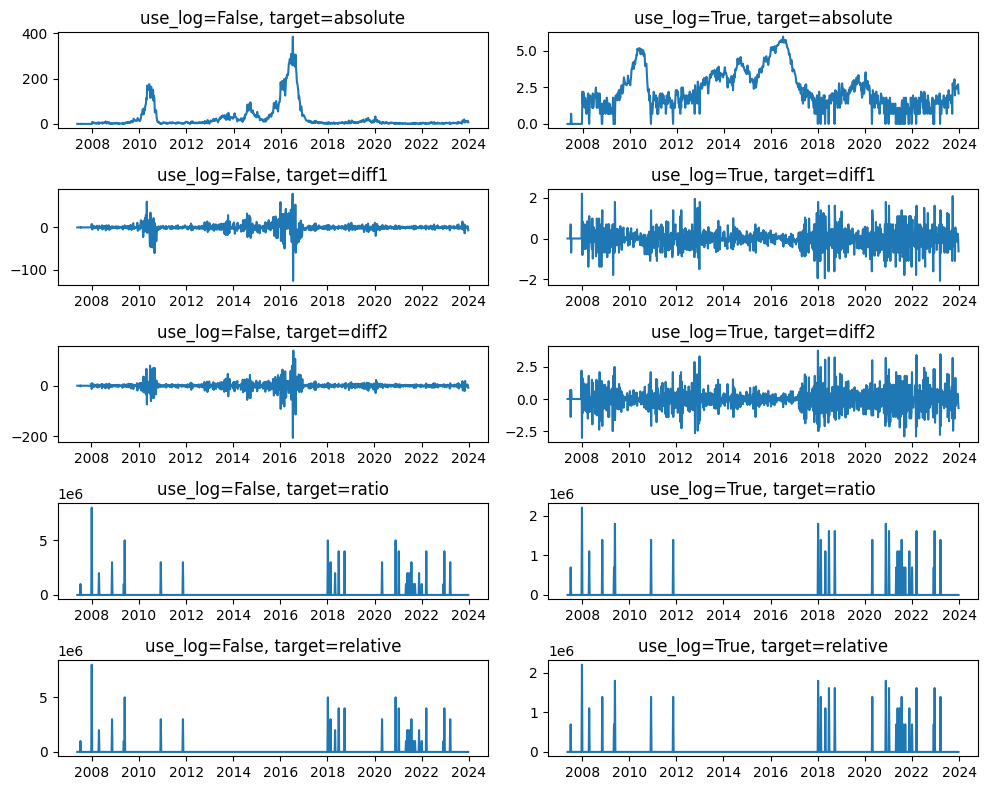

In [3]:
# Assessment visual para ver cuales series son candidatas a ser testeadas
use_logs = [False, True]
targets = ["absolute", "diff1", "diff2", "ratio", "relative"]

fig, axes = plt.subplots(len(targets), len(use_logs), figsize=(10, 8))

for r, tm in enumerate(targets):
    for c, ul in enumerate(use_logs):
        df = pd.read_pickle(f"{PROJECT_ROOT}/data/model/data.pkl")
        df = format_df(df, **{"exog": True, "add_outlier": True, "use_log": ul, "target_mode": tm})
        axes[r, c].plot(df.CASES)
        axes[r, c].set_title(f"use_log={ul}, target={tm}")

plt.tight_layout()
plt.show()

In [4]:
# Las series ratio y relative no son candidatas

## Config

In [5]:
use_logs = [
    False,
    True
]
targets = [
    "absolute"
]
dates_tuples = [
    ["2007-01-01", "2020-06-28", "2024-01-01"],
    ["2017-01-01", "2020-06-28", "2024-01-01"],
]

In [6]:
steps = 4
assessment_metric = "mean_squared_error"
param_grid = {
    'order': [(0, 1, 0), (1, 1, 0), (0, 1, 1), (1, 1, 1), (1, 0, 0), (1, 0, 1), (0, 2, 0), (1, 2, 0), (0, 2, 1), (1, 2, 1)],
    'seasonal_order': [(0, 0, 0, 0), (1, 1, 0, 52), (1, 1, 0, 18), (1, 1, 1, 52), (1, 1, 1, 18)],
    'trend': ['n']
}
param_list = list(ParameterGrid(param_grid))

## Grid search - Validation


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.4462
   MAE: 5.0457
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


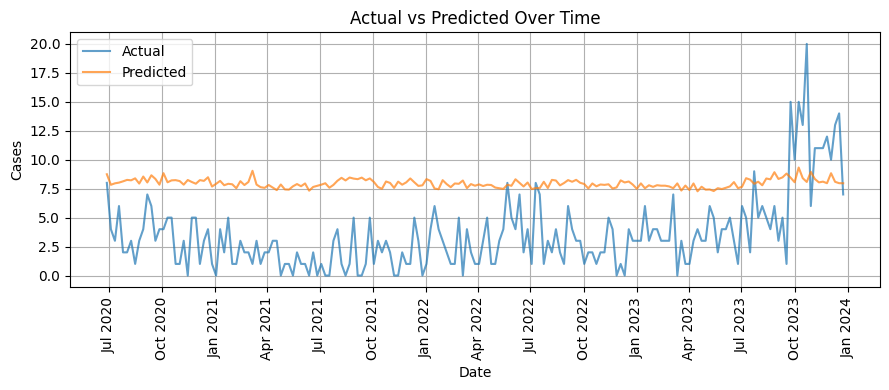


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.2119
   MAE: 4.6839
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


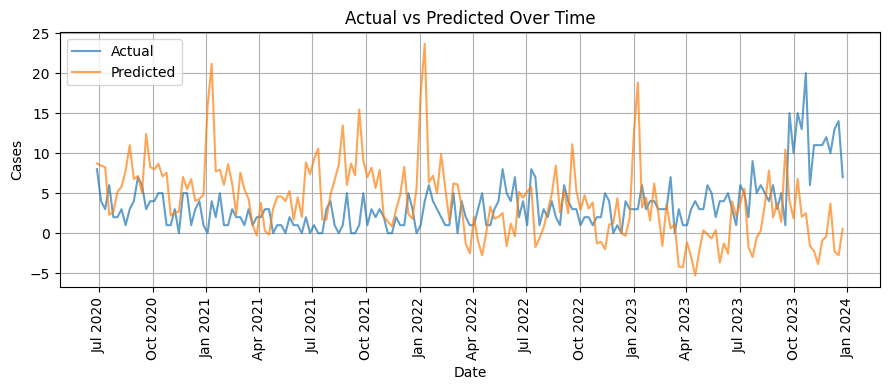


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 20.8259
   MAE: 16.9268
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


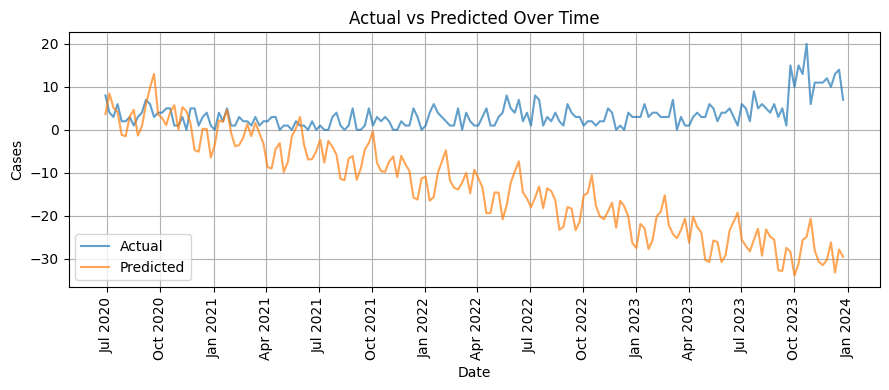


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 13.0569
   MAE: 10.6138
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


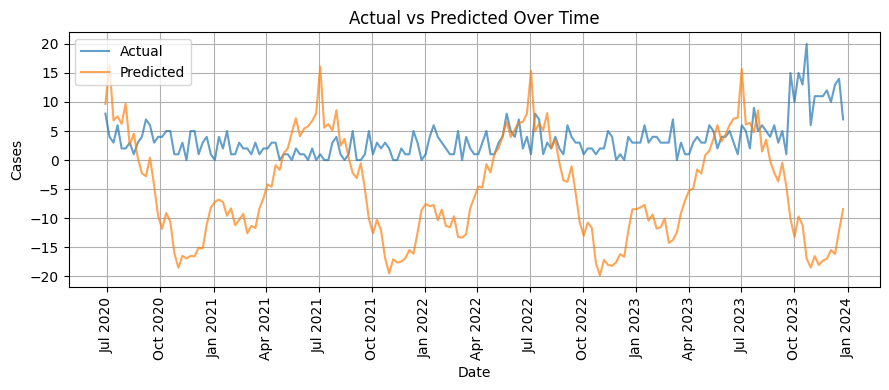


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.3511
   MAE: 5.8428
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


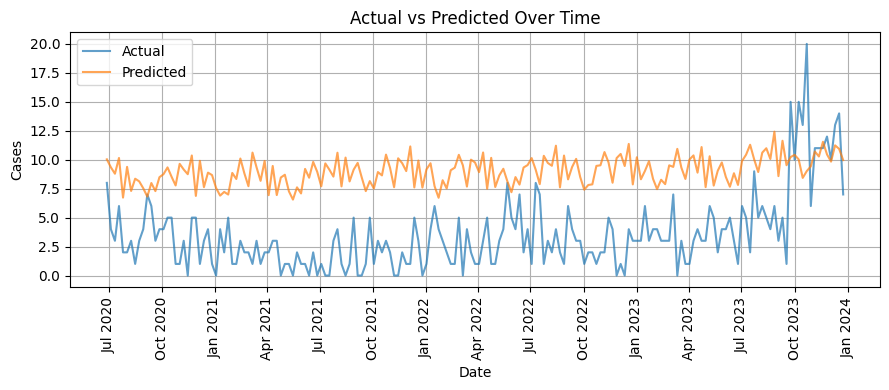


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.0112
   MAE: 3.5038
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


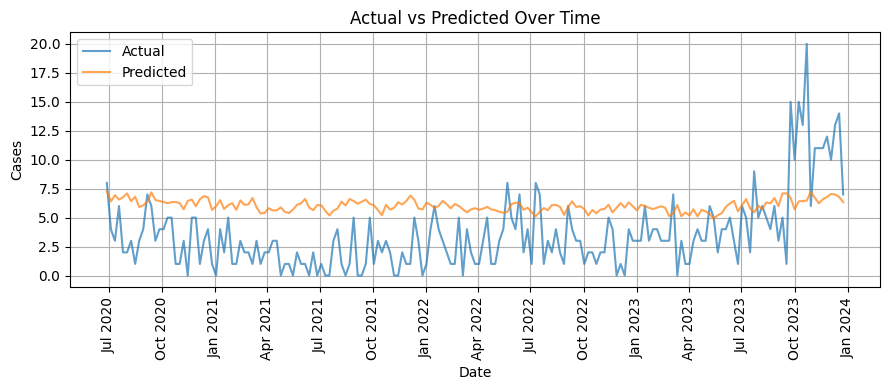


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.4394
   MAE: 4.8523
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


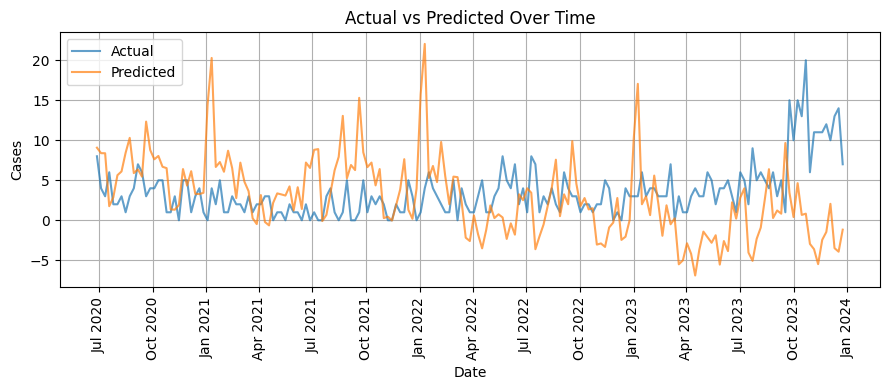


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 32.2100
   MAE: 27.1523
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


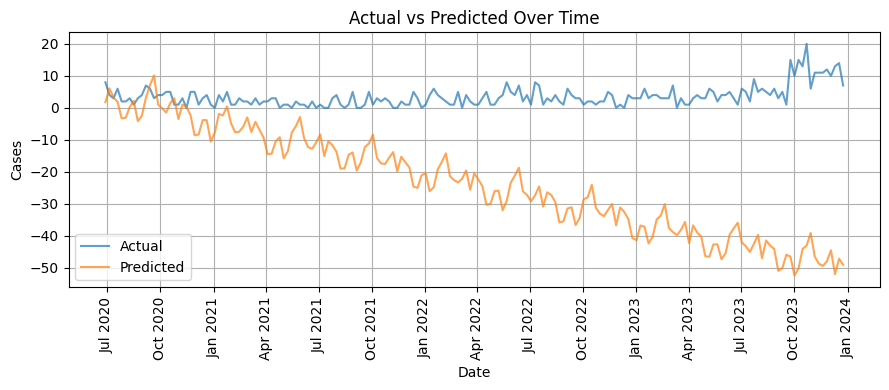


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 14.4021
   MAE: 11.8340
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


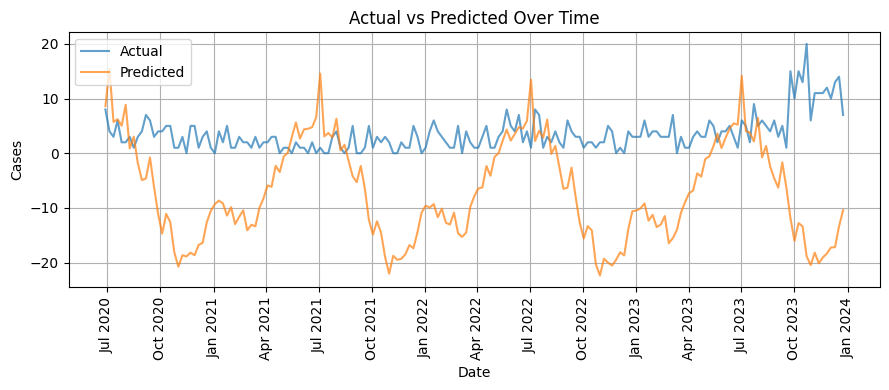


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.4539
   MAE: 3.9050
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


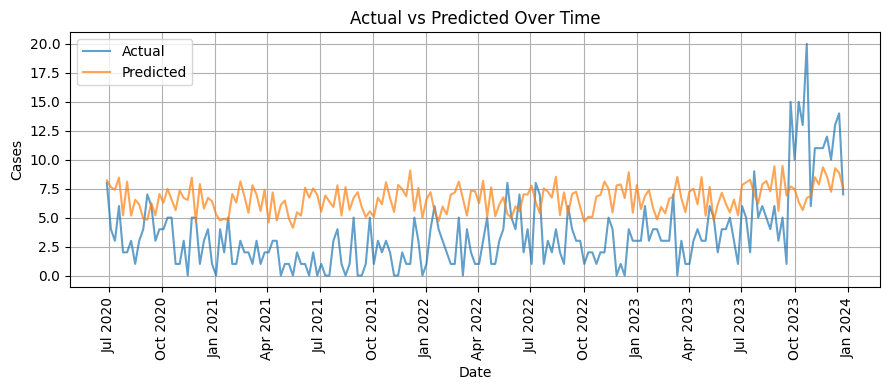


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.7044
   MAE: 3.1344
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


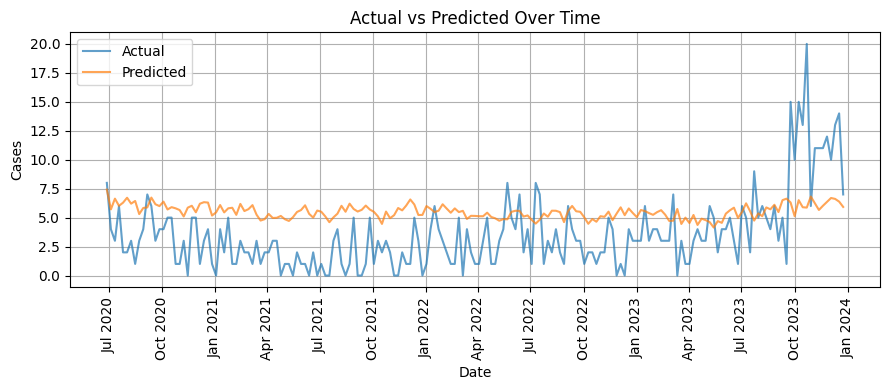


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.6268
   MAE: 5.0211
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


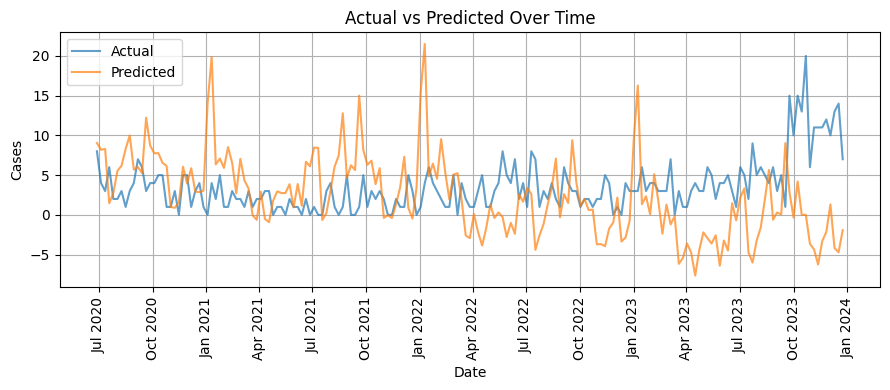


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 34.1622
   MAE: 28.8877
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


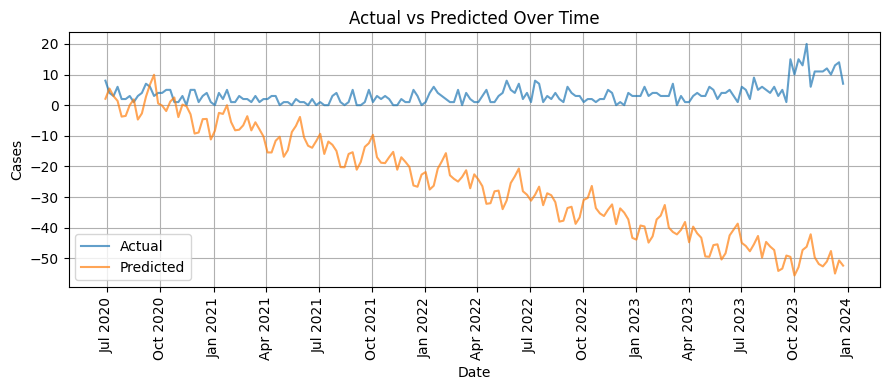


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 14.6015
   MAE: 12.0257
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


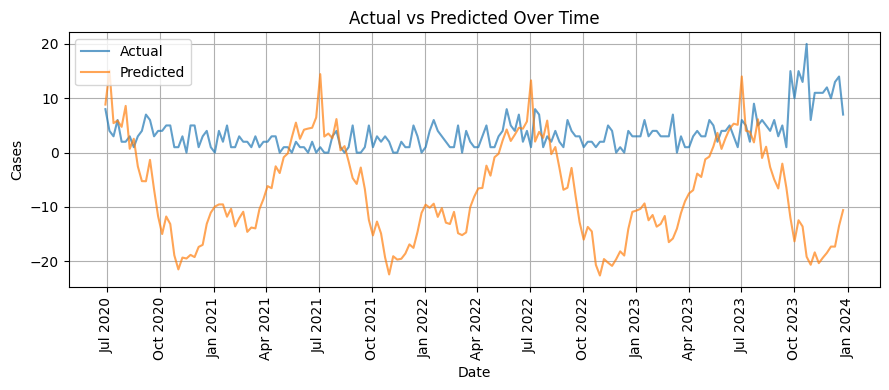


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.9558
   MAE: 3.3596
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


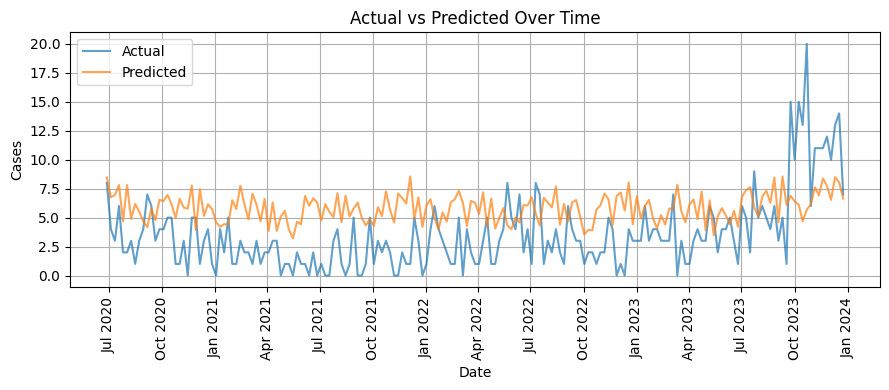


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.6871
   MAE: 3.1115
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


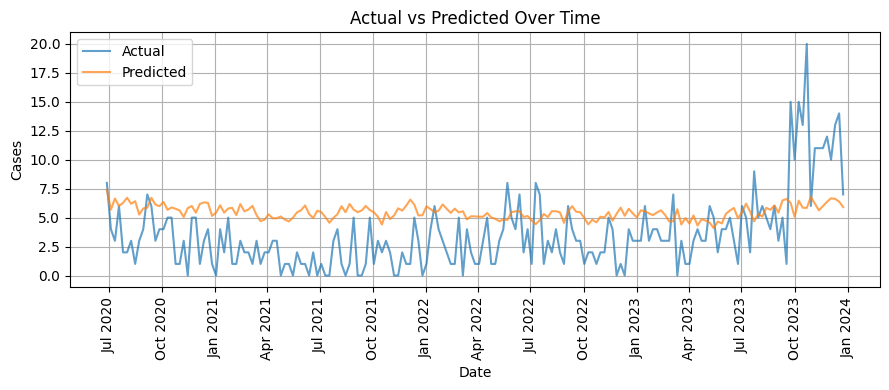


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.6341
   MAE: 5.0293
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


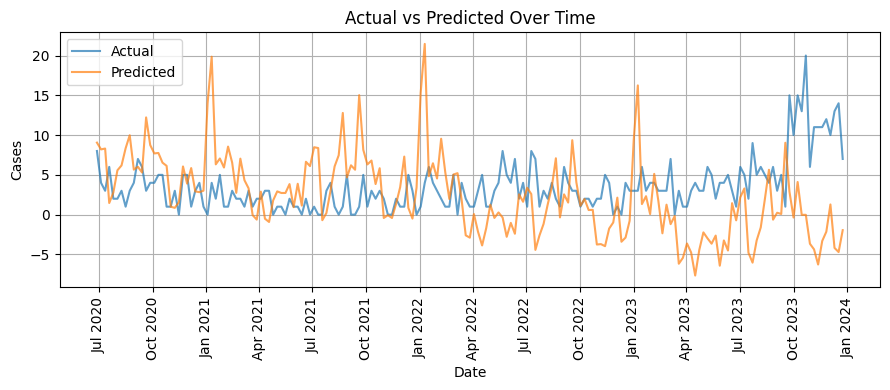


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 34.1978
   MAE: 28.9201
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


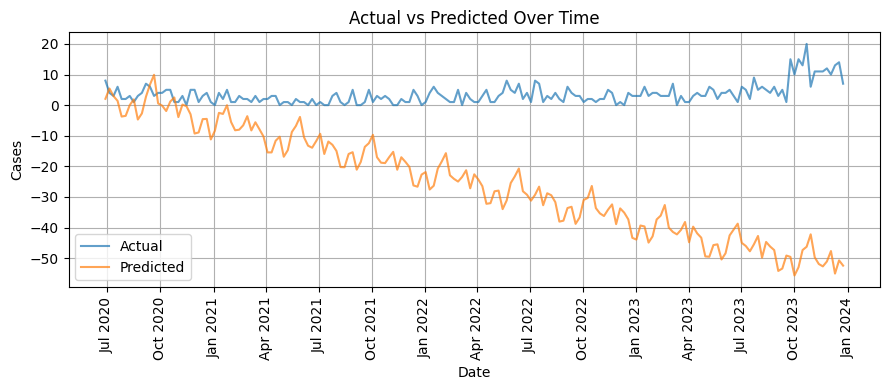


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 14.6373
   MAE: 12.0591
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


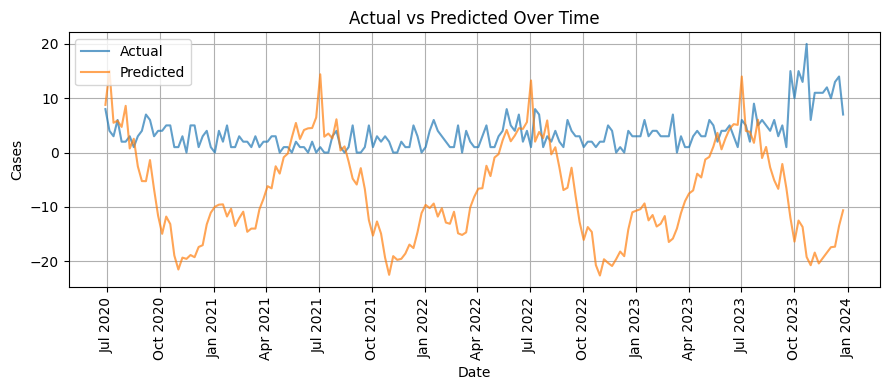


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.0227
   MAE: 3.4374
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


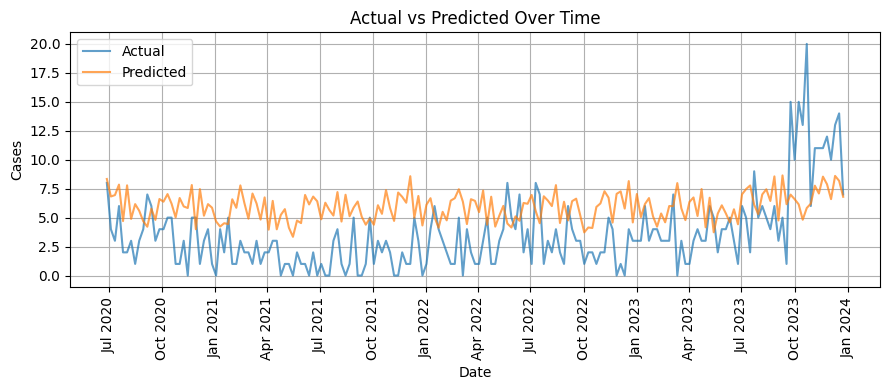


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.8261
   MAE: 2.7645
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


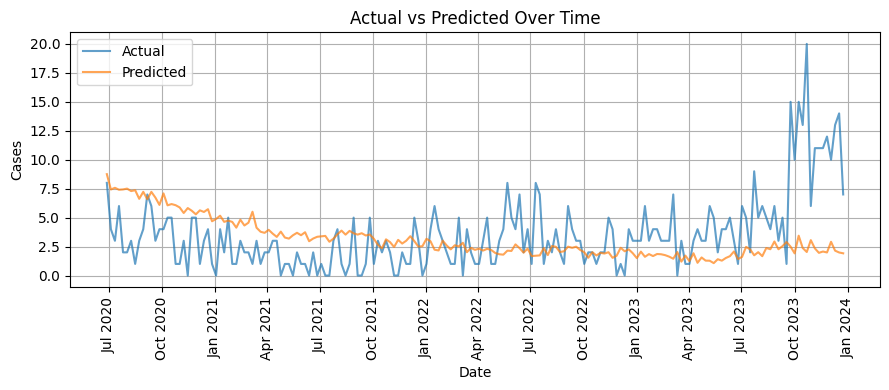


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.9988
   MAE: 5.5498
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


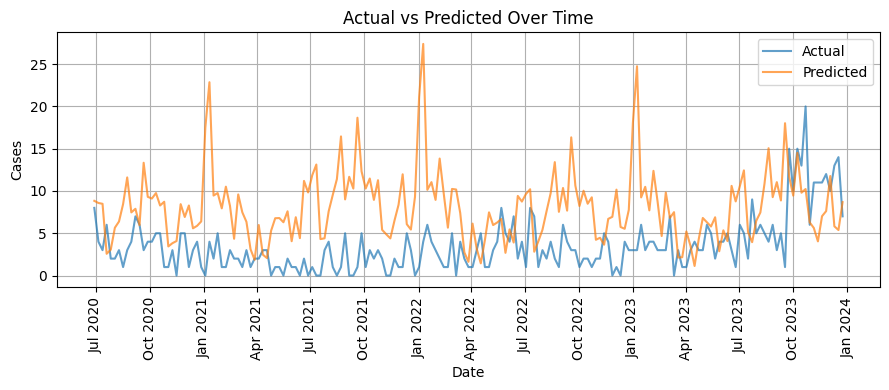


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.6706
   MAE: 3.6849
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


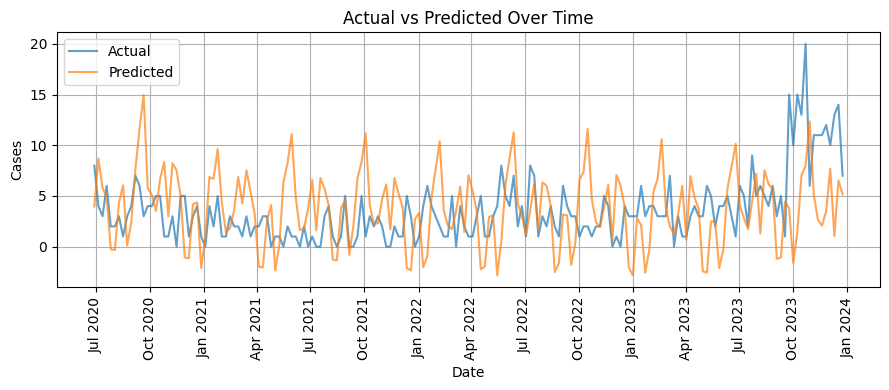


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 19.2317
   MAE: 16.4310
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


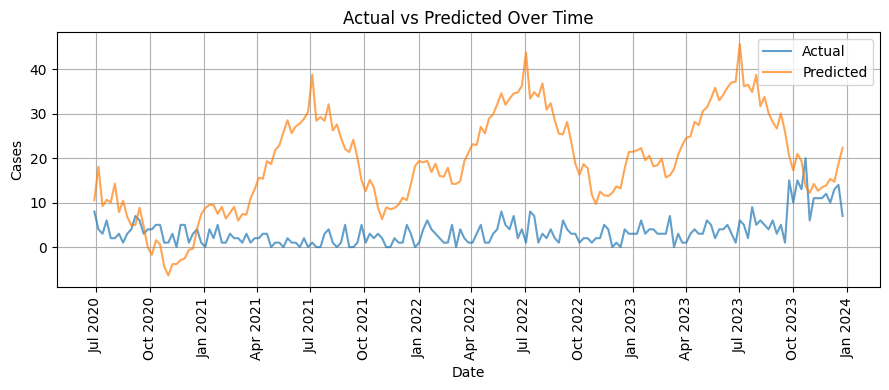


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 20.2182
   MAE: 19.5341
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


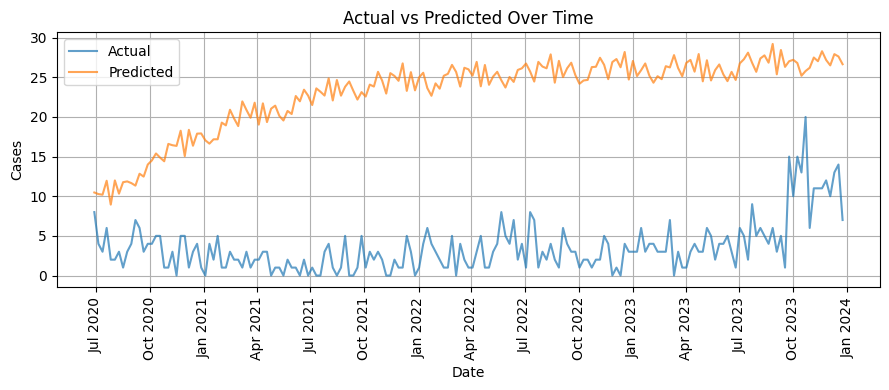


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.4693
   MAE: 2.5018
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


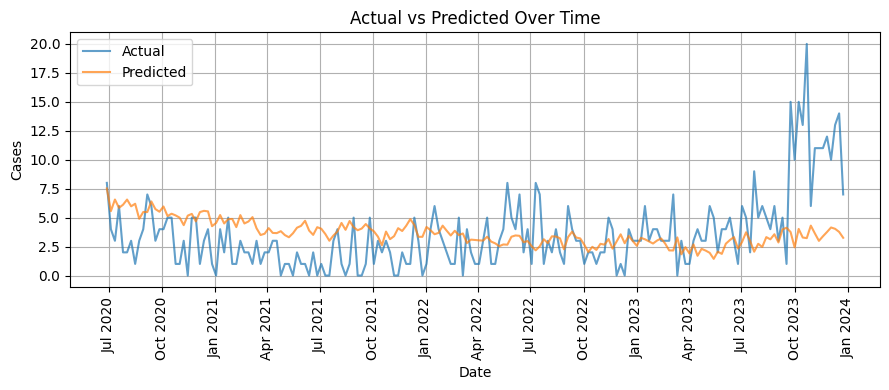


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.5715
   MAE: 4.9790
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


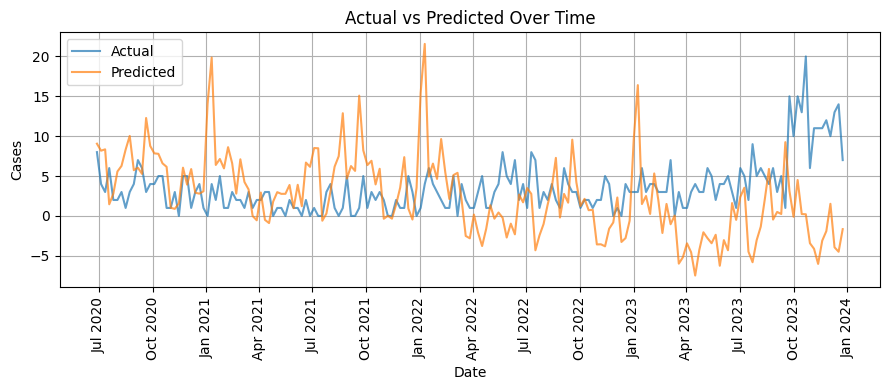


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 8.5075
   MAE: 7.0006
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


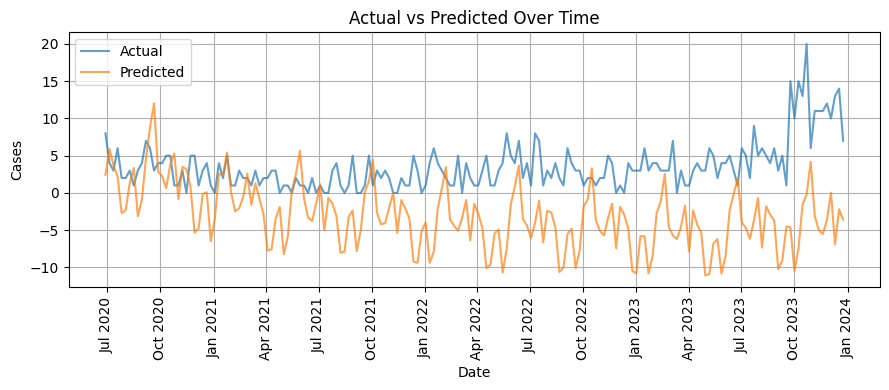


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 11.9023
   MAE: 9.7048
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


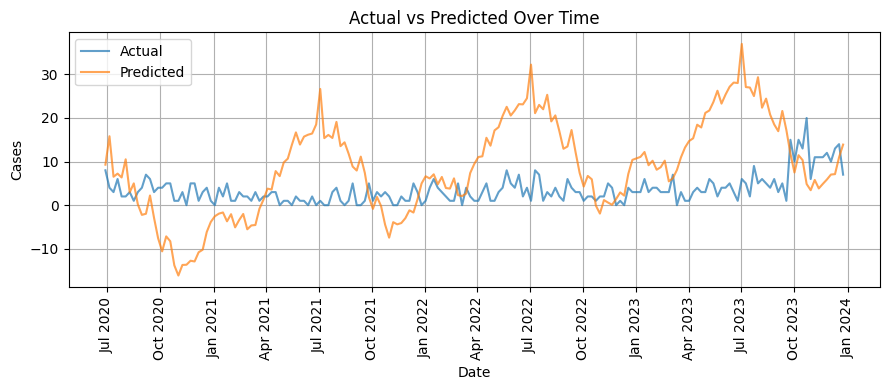


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 13.7301
   MAE: 12.9338
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


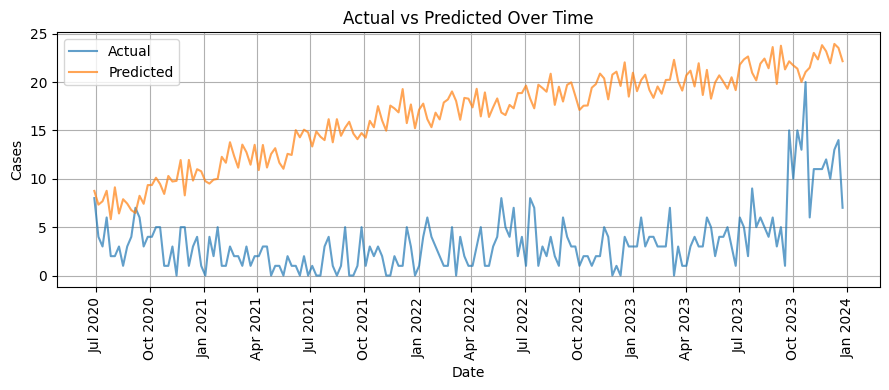


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 574.2073
   MAE: 499.9028
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


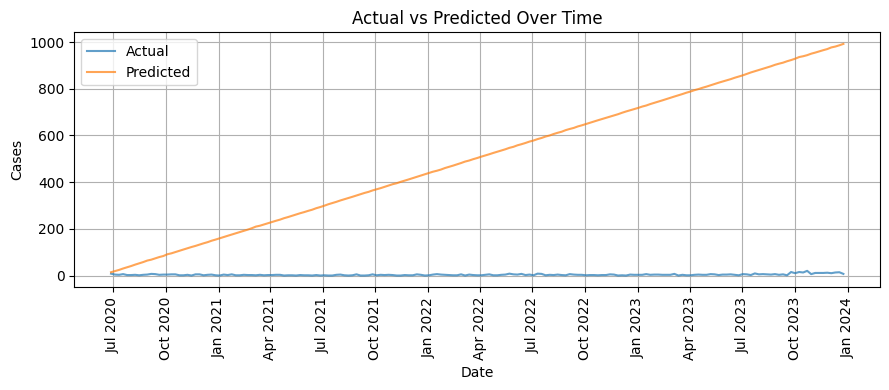


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 104.0185
   MAE: 82.0722
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


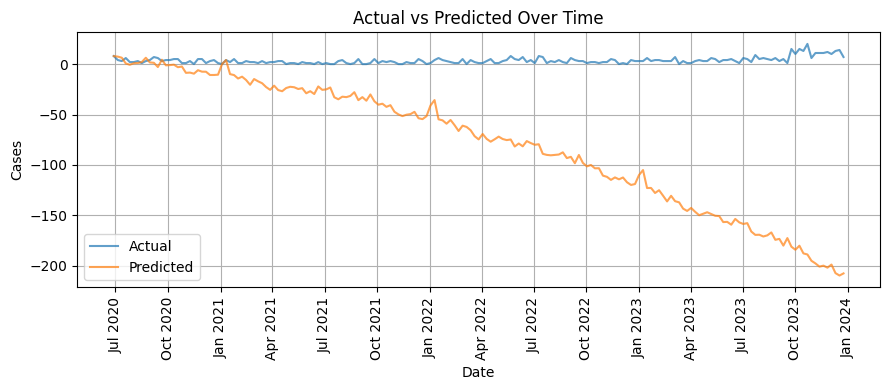


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3153.0196
   MAE: 2435.3667
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


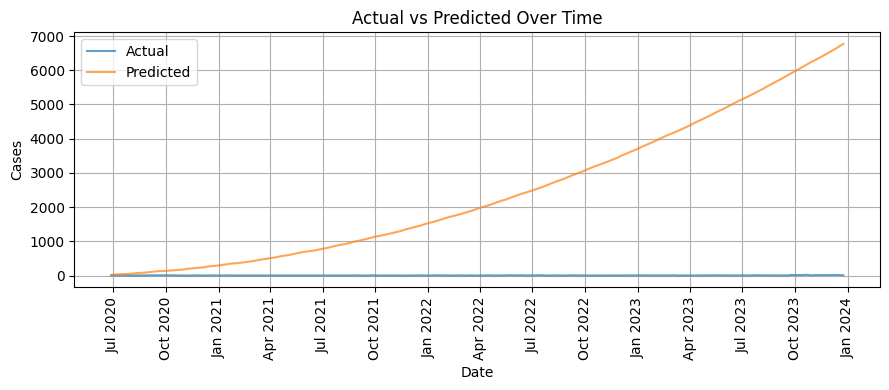


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 544.3754
   MAE: 462.4009
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


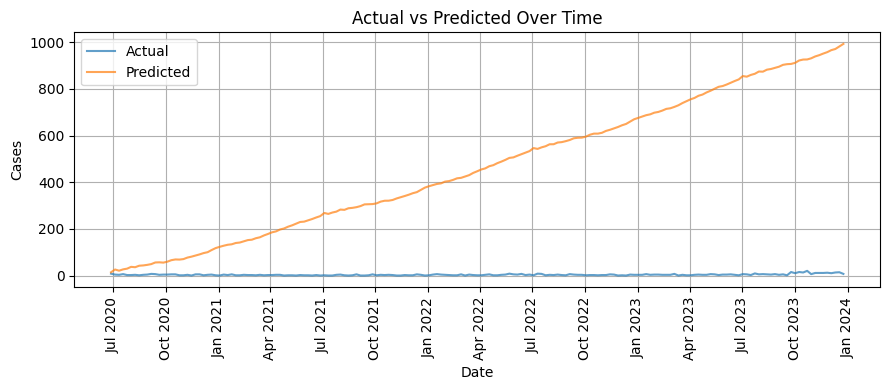


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 932.8186
   MAE: 797.4337
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


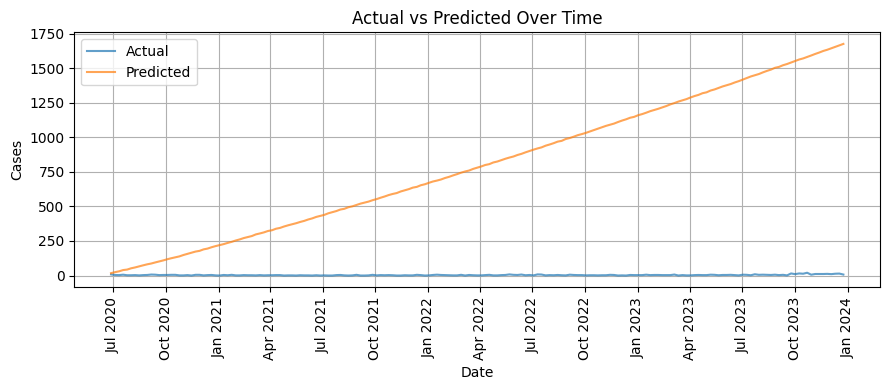


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 348.1150
   MAE: 303.3160
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


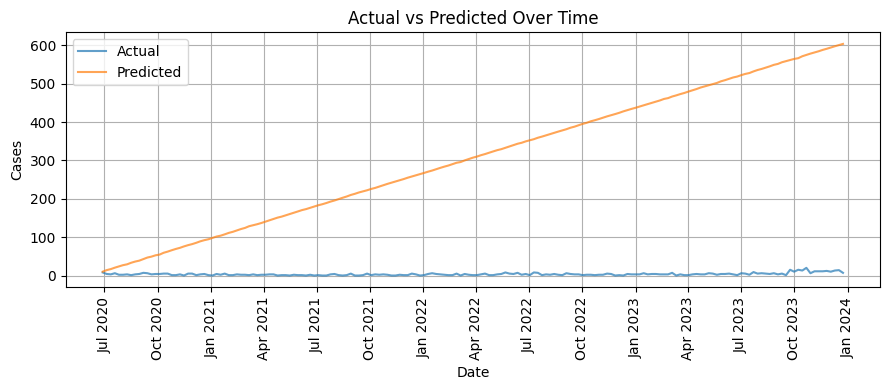


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 124.2133
   MAE: 102.6611
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


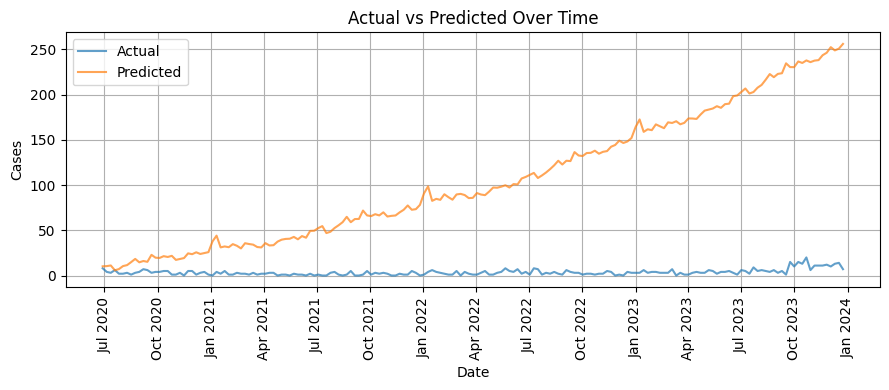


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 1417.9387
   MAE: 1091.5150
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


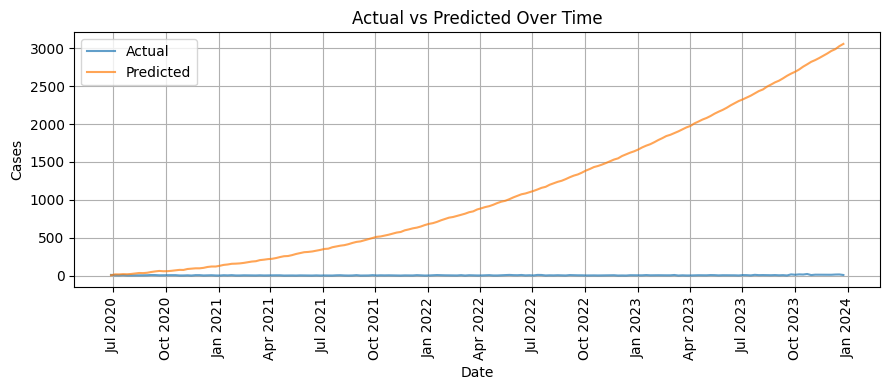


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 261.7877
   MAE: 220.0008
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


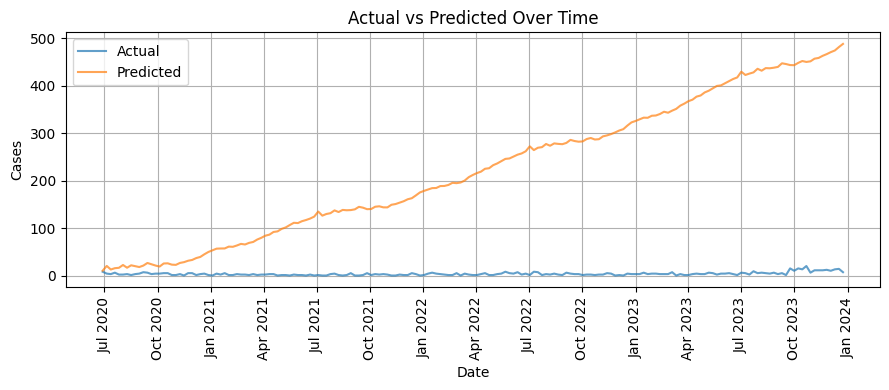


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 589.7946
   MAE: 503.5931
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


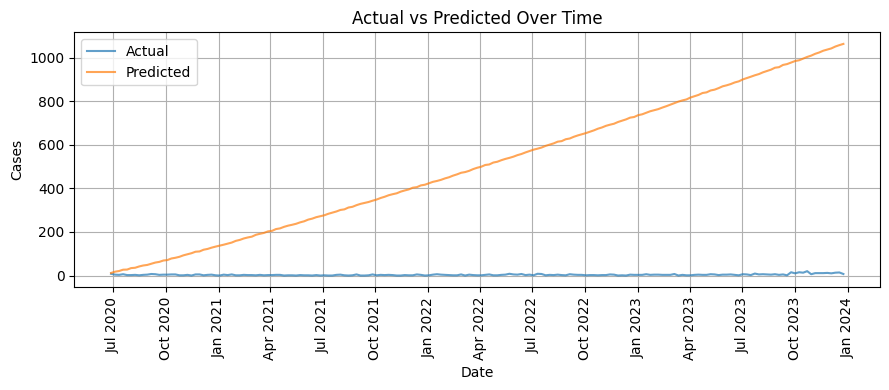


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.1534
   MAE: 5.7607
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


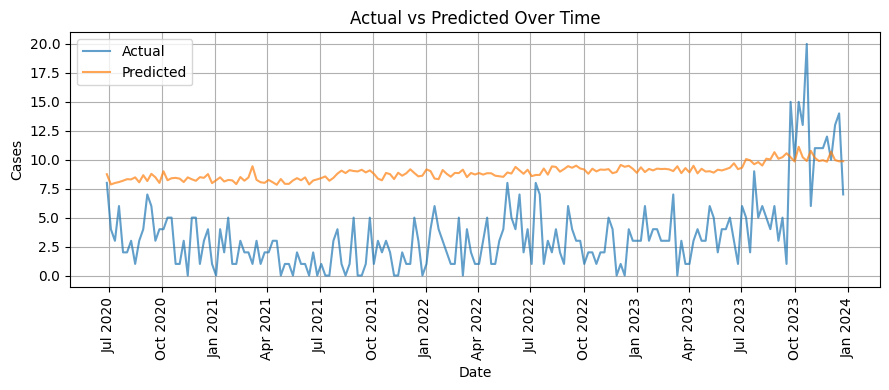


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.8675
   MAE: 5.1358
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


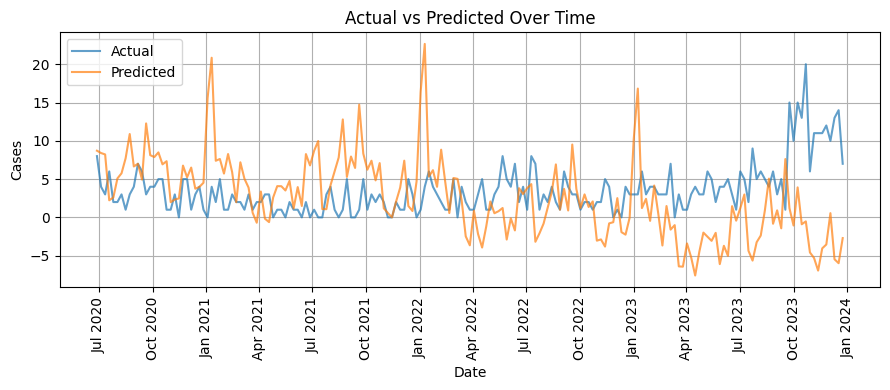


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 24.8830
   MAE: 20.1213
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


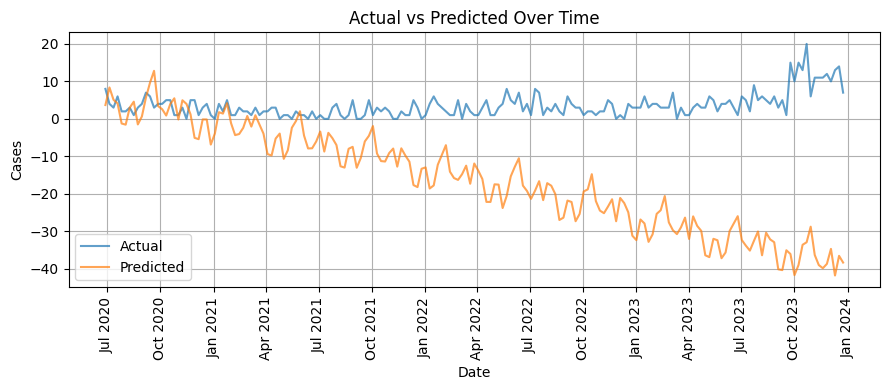


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 45.9418
   MAE: 39.8019
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


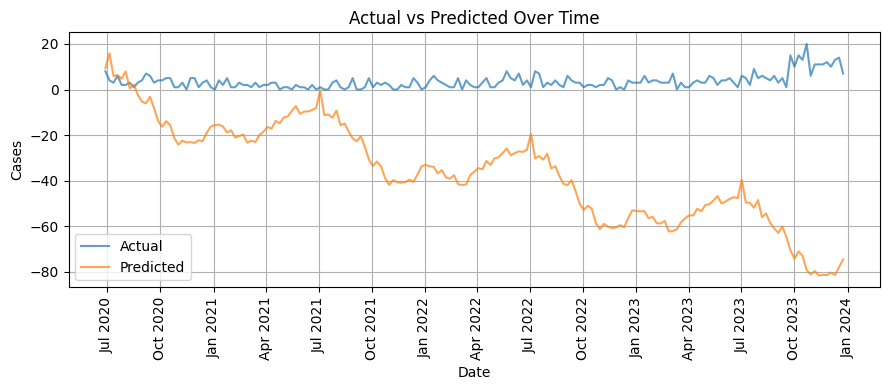


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 22.8644
   MAE: 17.7215
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


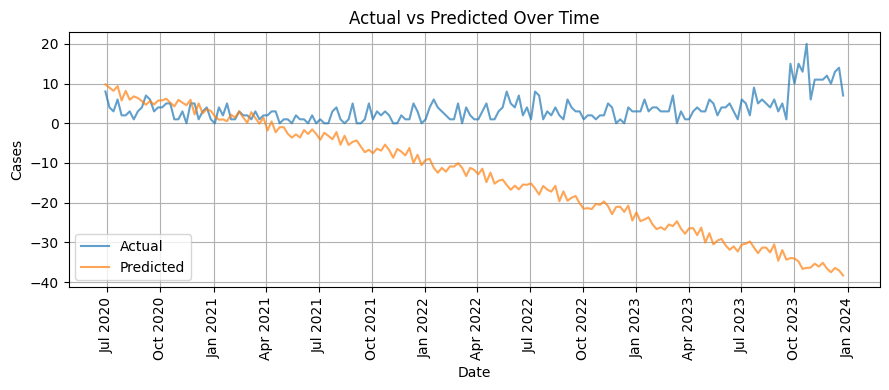


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.0999
   MAE: 3.6332
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


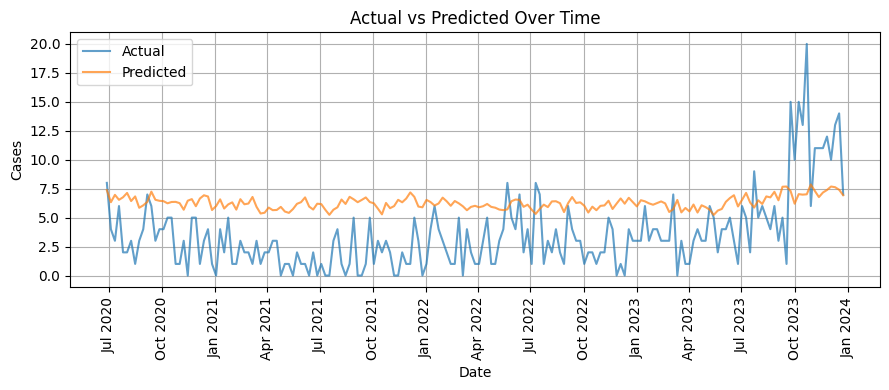


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 7.4653
   MAE: 5.6841
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


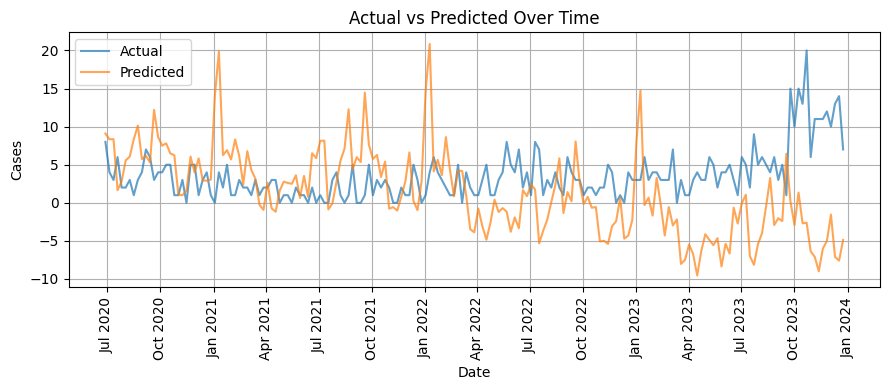


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 37.3793
   MAE: 31.2023
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


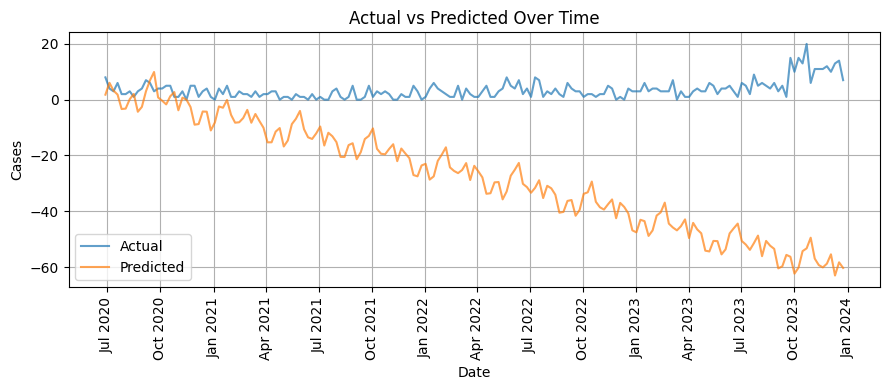


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 48.7822
   MAE: 42.6515
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


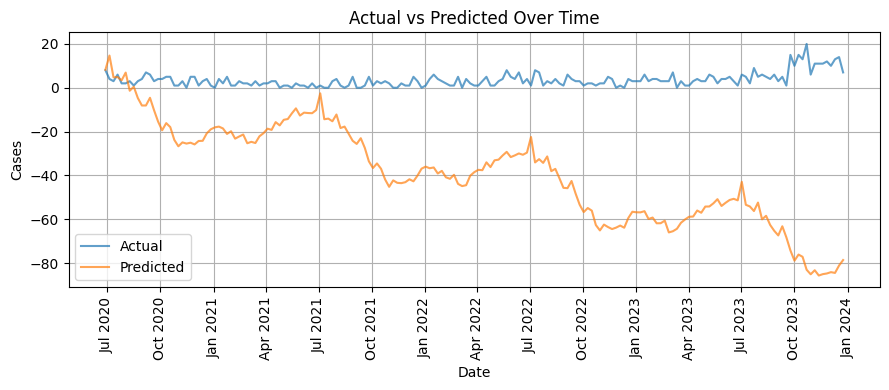


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 26.1264
   MAE: 20.8134
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


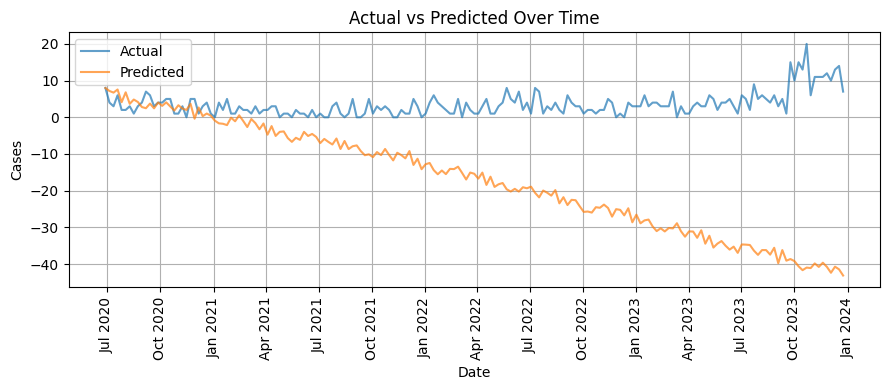


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.5196
   MAE: 2.8278
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


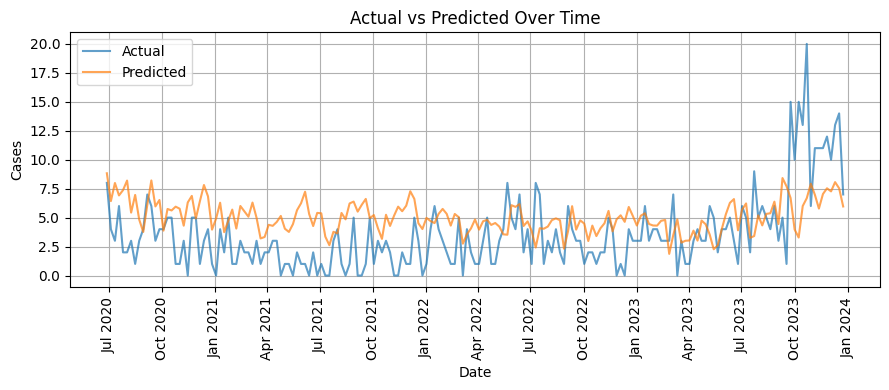


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 15.7154
   MAE: 12.6613
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


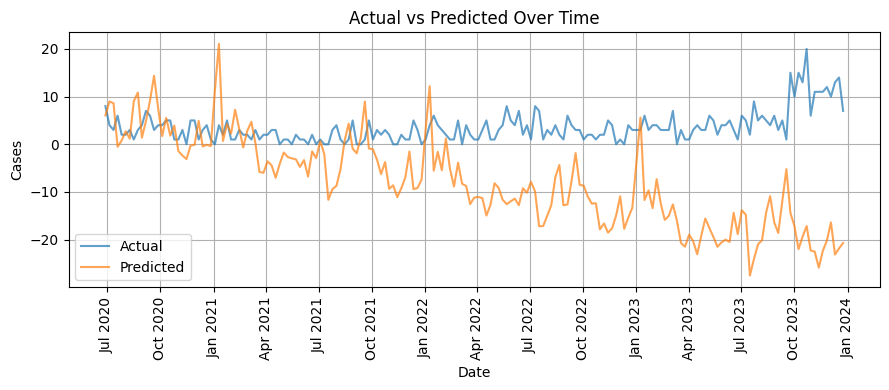


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 33.2852
   MAE: 28.2908
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


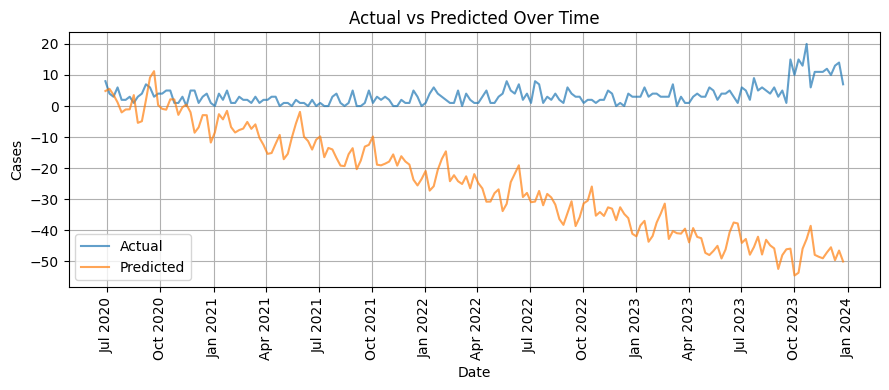


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 24.8210
   MAE: 20.3352
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


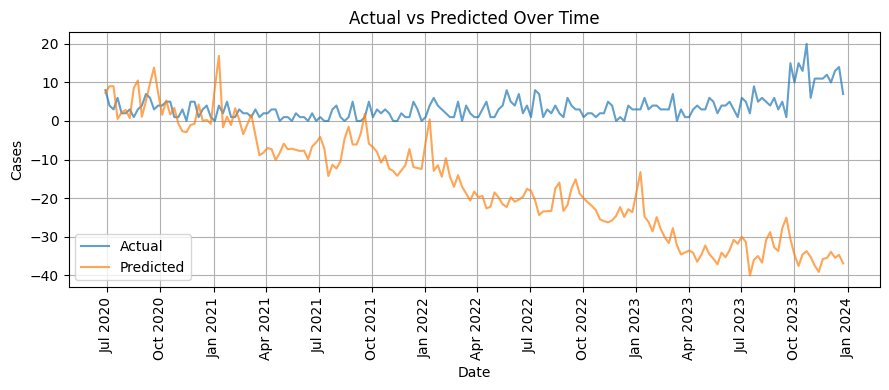


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 15.4800
   MAE: 12.6492
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


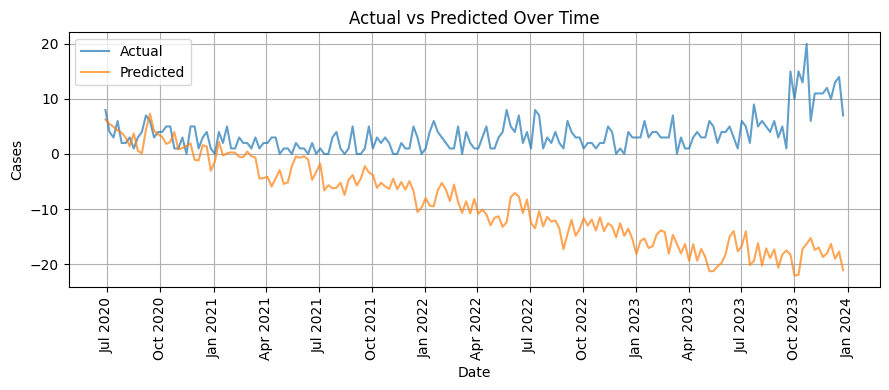


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.2183
   MAE: 2.3958
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


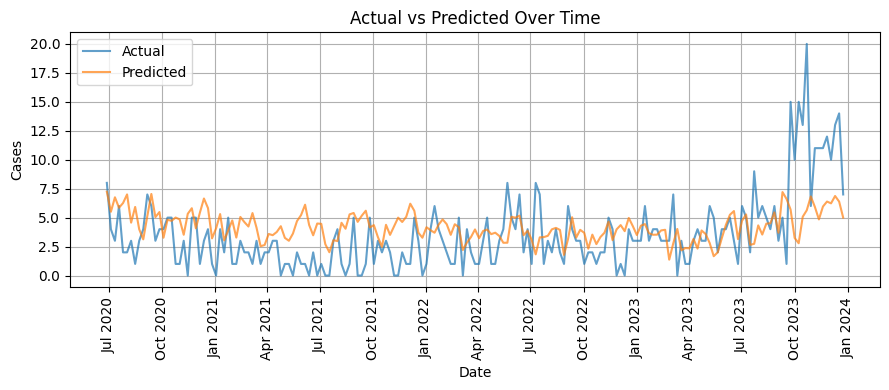


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 13.5265
   MAE: 10.7479
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


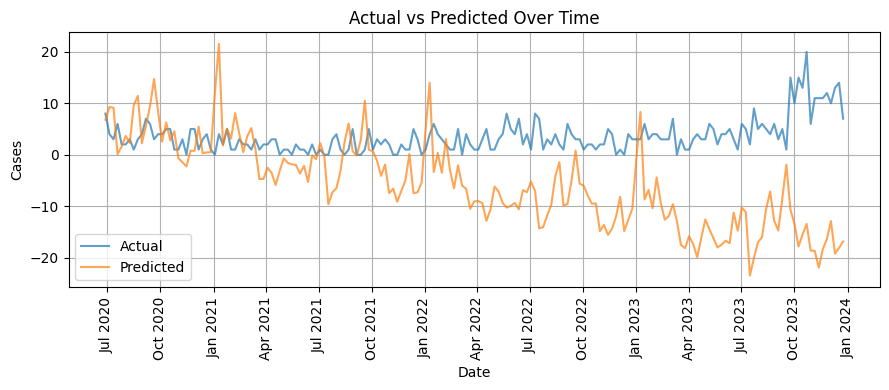


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 39.1626
   MAE: 33.5210
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


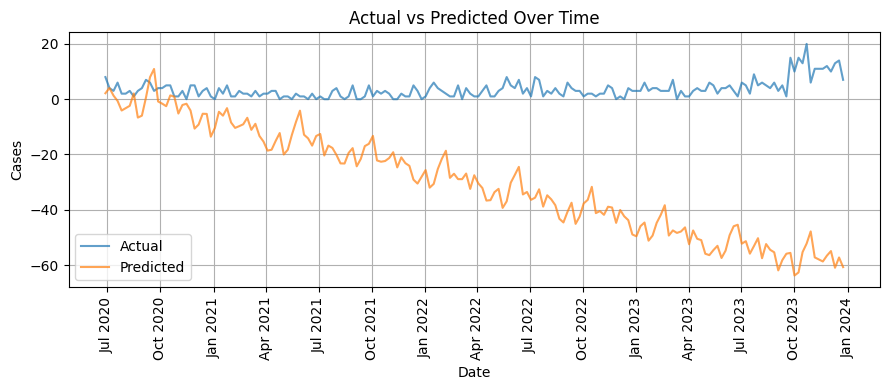


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 23.5885
   MAE: 19.2872
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


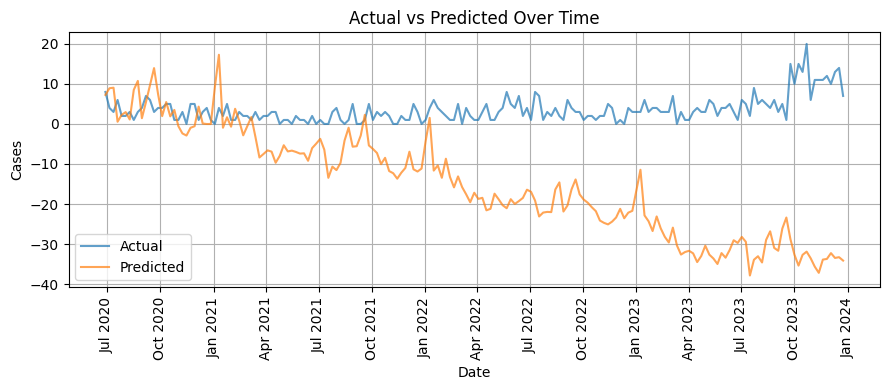


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 13.6055
   MAE: 10.9565
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


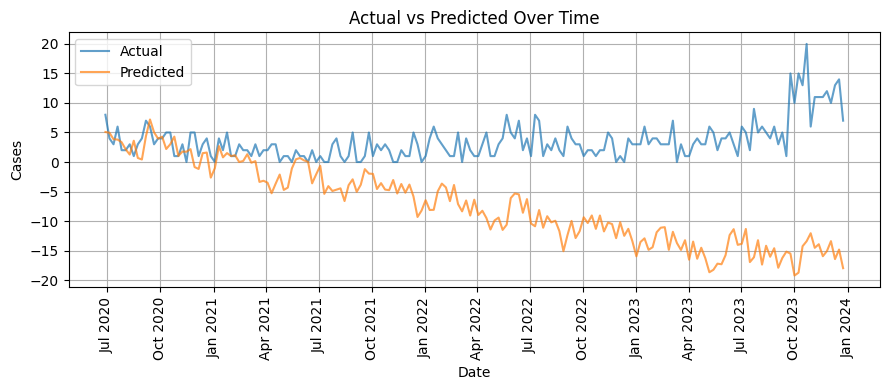


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1772
   MAE: 2.1990
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


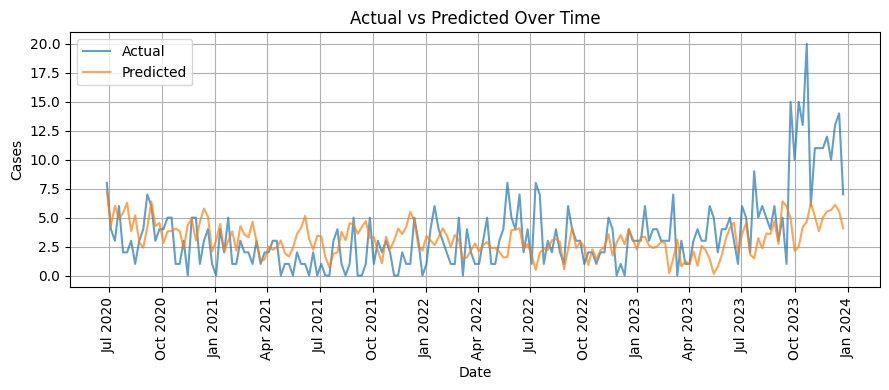


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 12.6636
   MAE: 10.0110
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


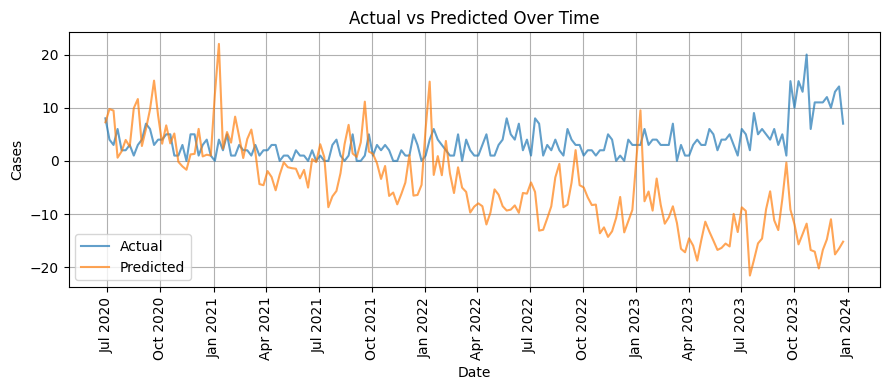


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 47.1219
   MAE: 40.6868
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


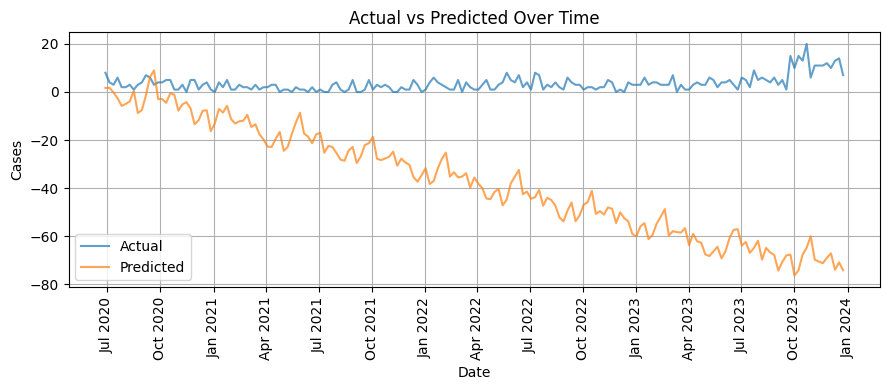


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 20.8233
   MAE: 16.9467
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


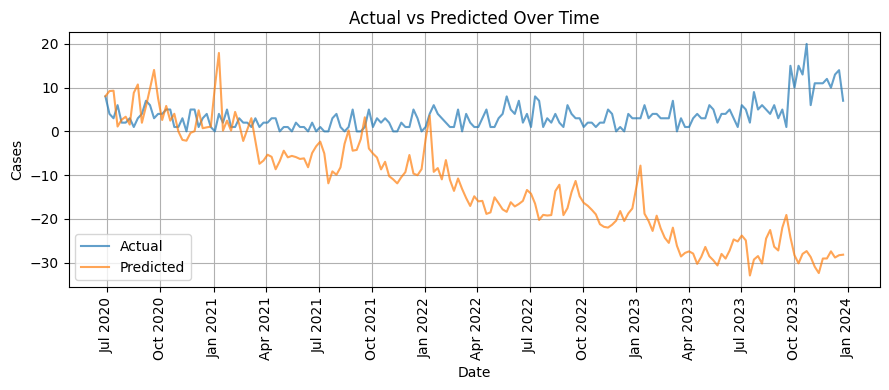


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 14.2193
   MAE: 11.6592
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


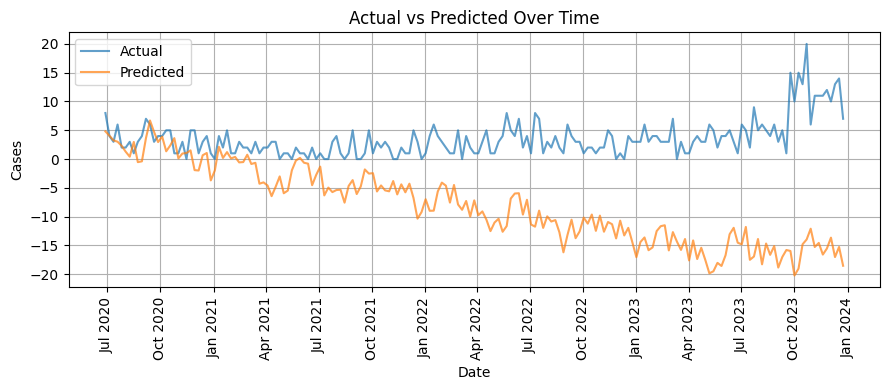


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1904
   MAE: 2.2215
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


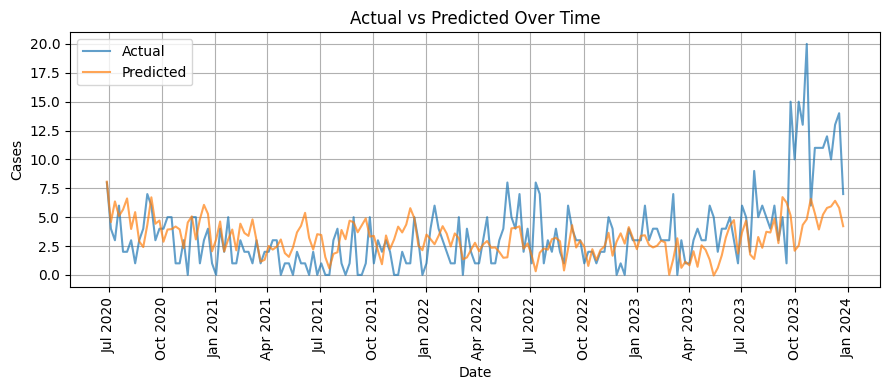


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 12.5558
   MAE: 9.9213
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


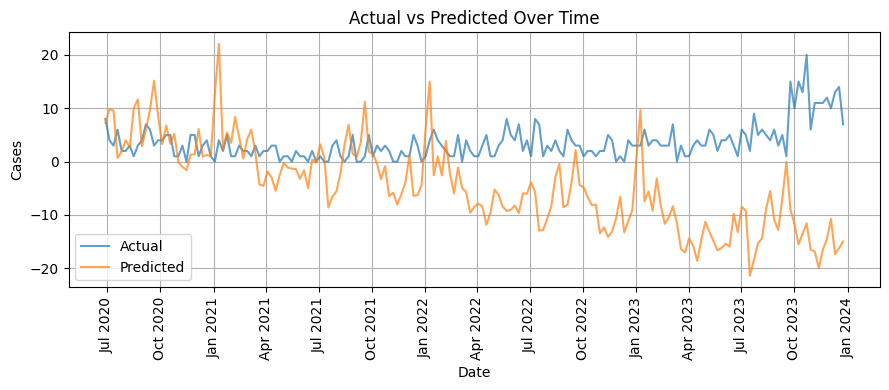


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 46.0135
   MAE: 39.6924
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


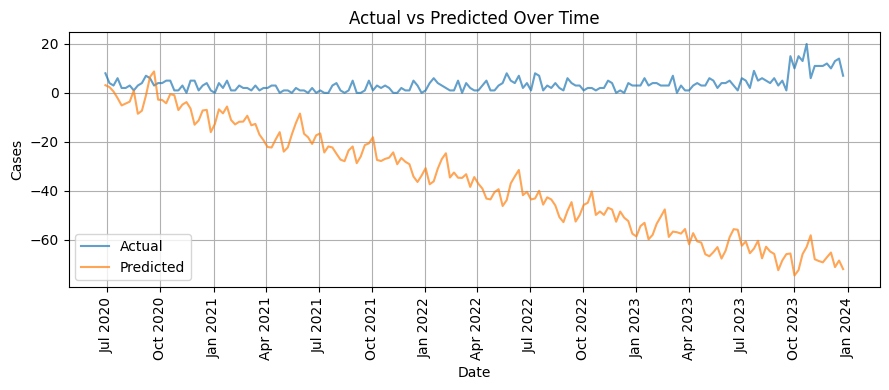


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 20.2601
   MAE: 16.4607
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


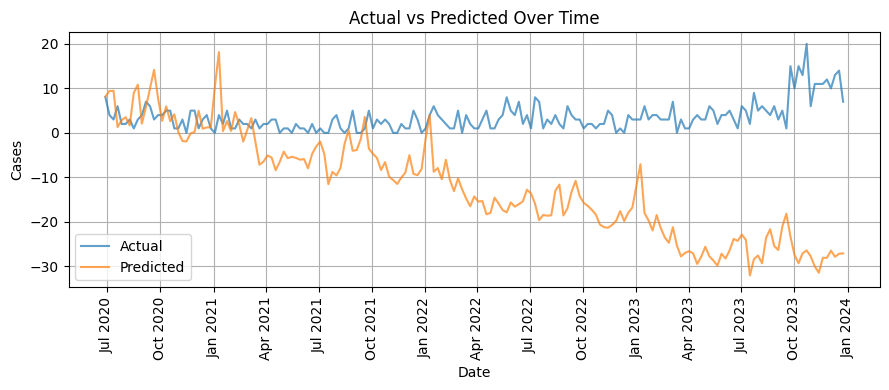


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 14.4077
   MAE: 11.8952
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


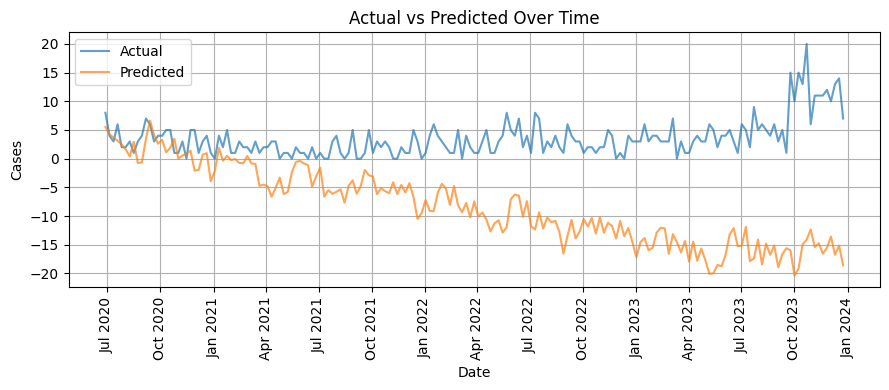


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.7915
   MAE: 3.0980
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


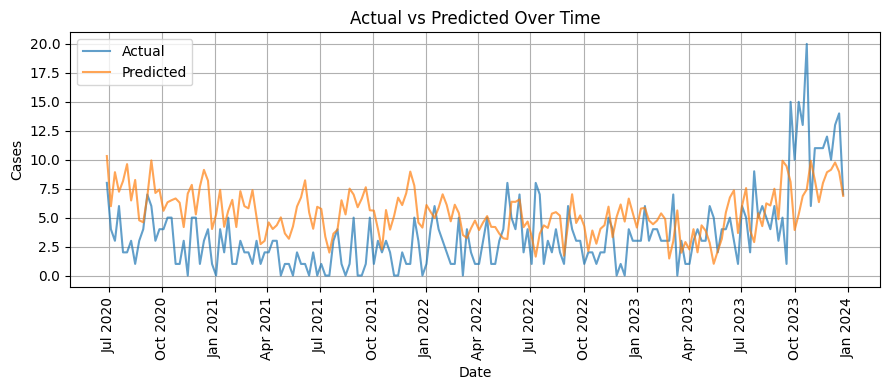


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 8.3818
   MAE: 6.5973
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


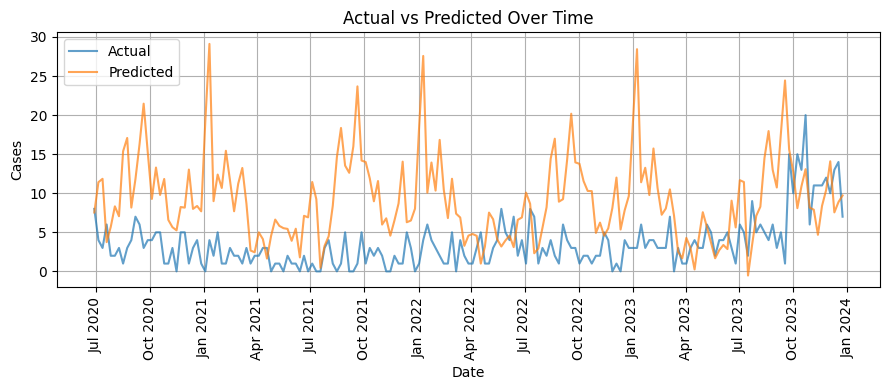


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2611
   MAE: 4.2692
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


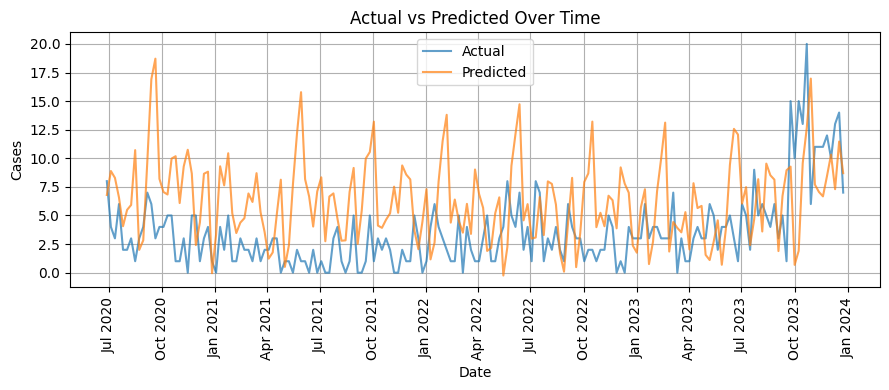


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 7.9051
   MAE: 6.4354
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


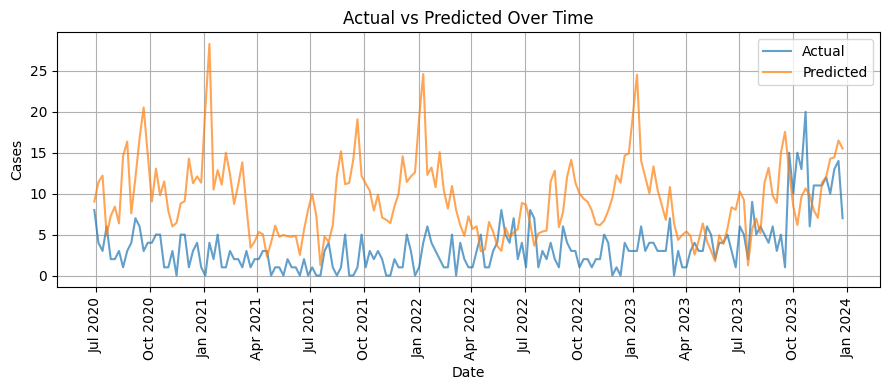


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.4176
   MAE: 4.8480
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


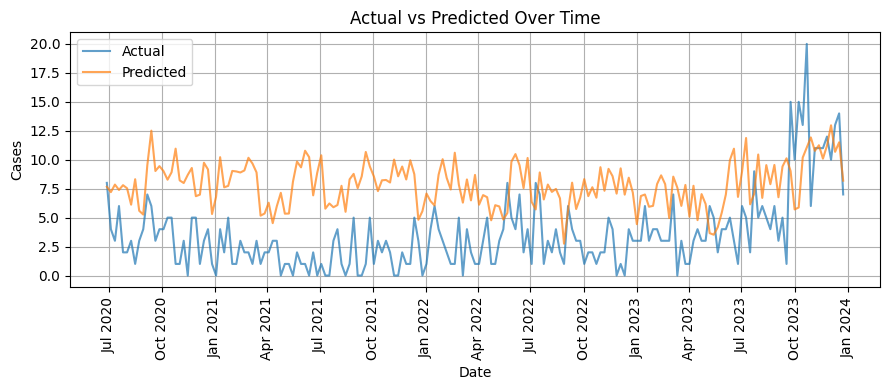


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.0967
   MAE: 2.2170
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


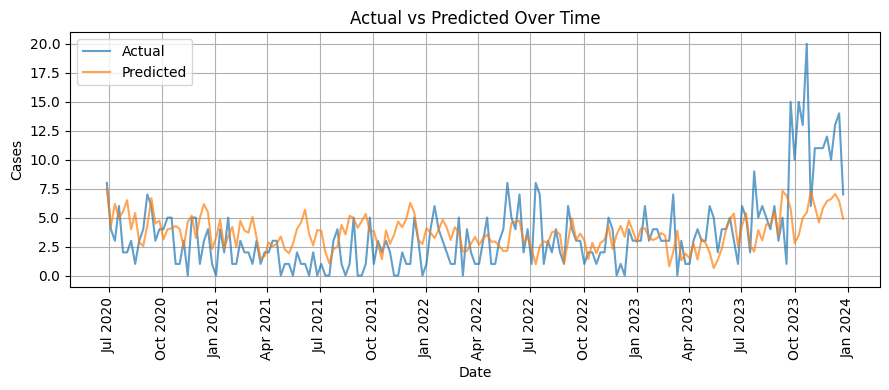


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.1027
   MAE: 4.5410
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


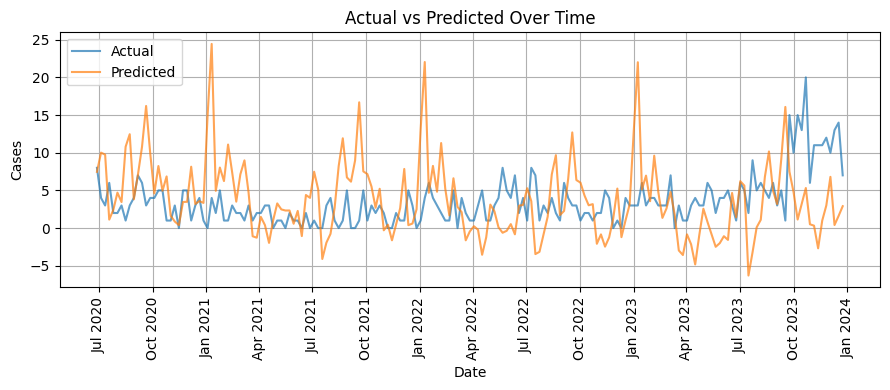


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 16.1597
   MAE: 14.5454
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


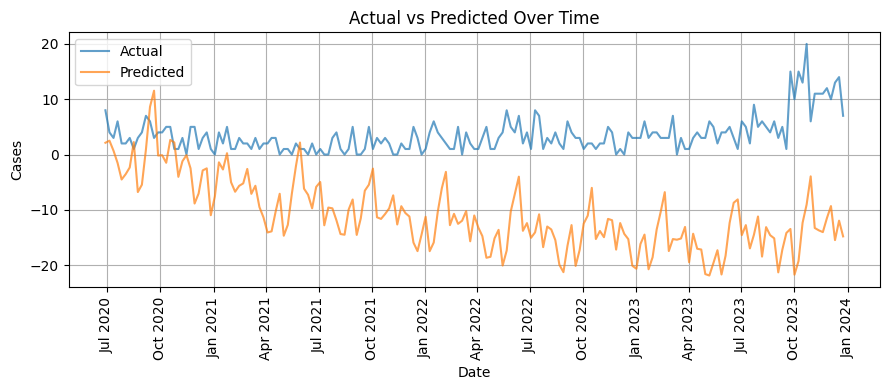


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.9494
   MAE: 4.5293
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


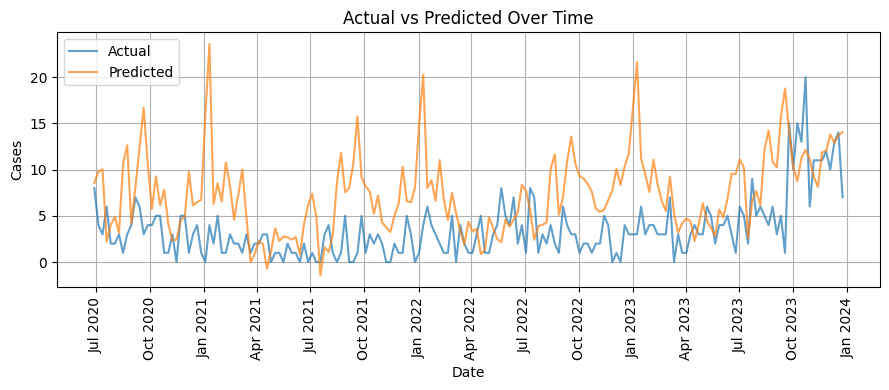


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.2029
   MAE: 3.0442
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


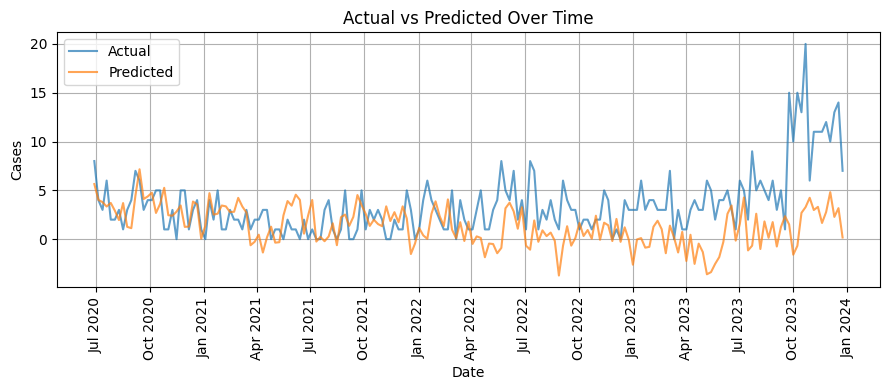


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 538.3410
   MAE: 467.8481
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


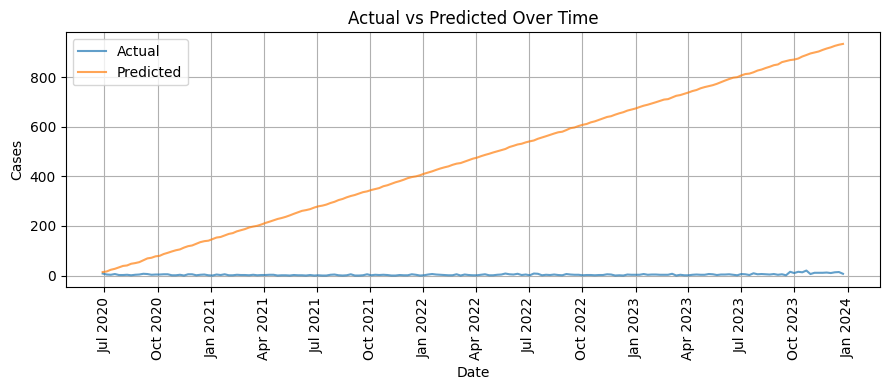


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 315.7238
   MAE: 251.5175
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


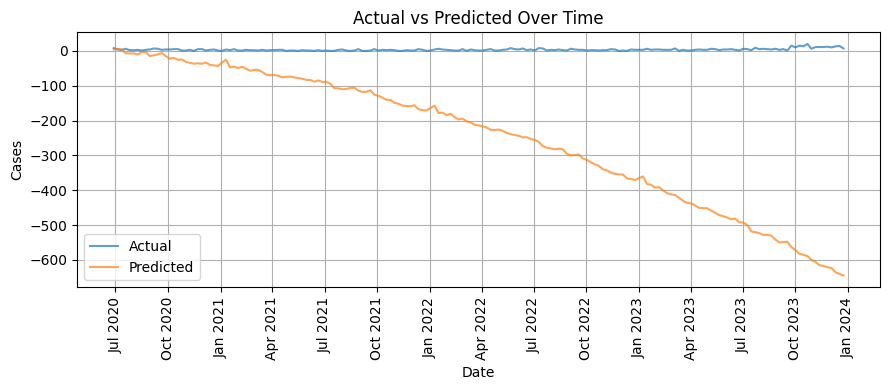


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3116.3296
   MAE: 2406.9786
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


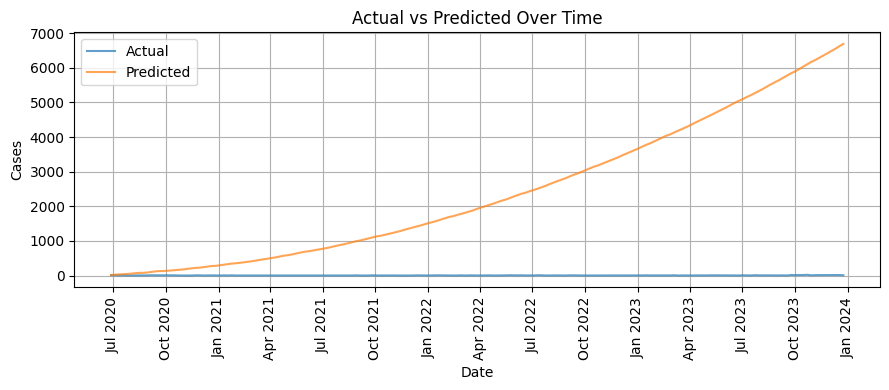


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 262.2575
   MAE: 189.0978
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


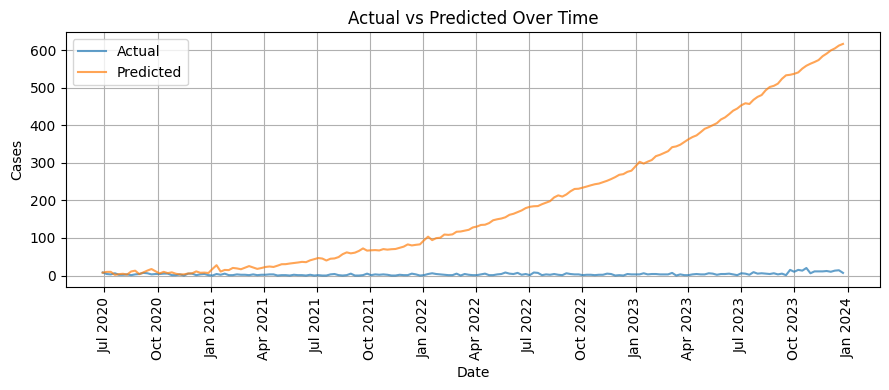


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 912.2080
   MAE: 748.5163
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


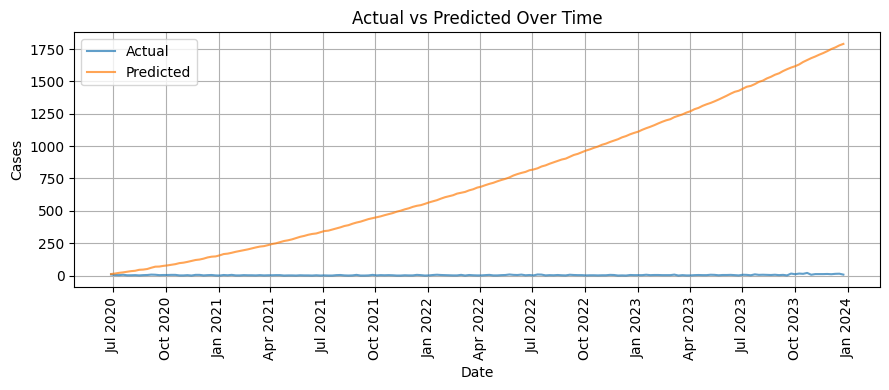


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 291.4137
   MAE: 253.6622
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


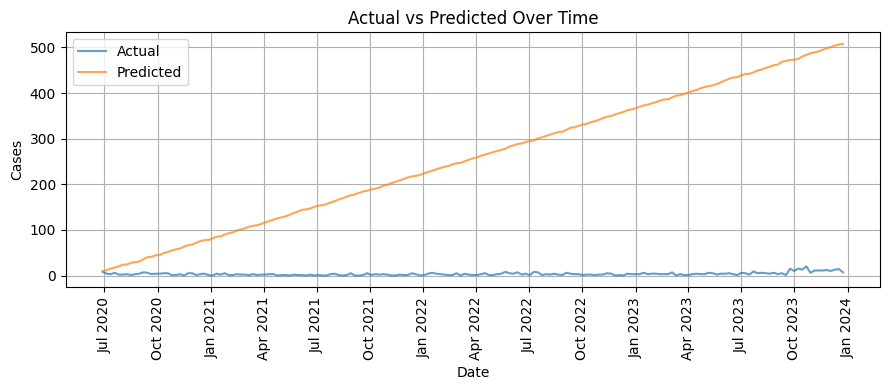


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 11.0473
   MAE: 8.7412
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


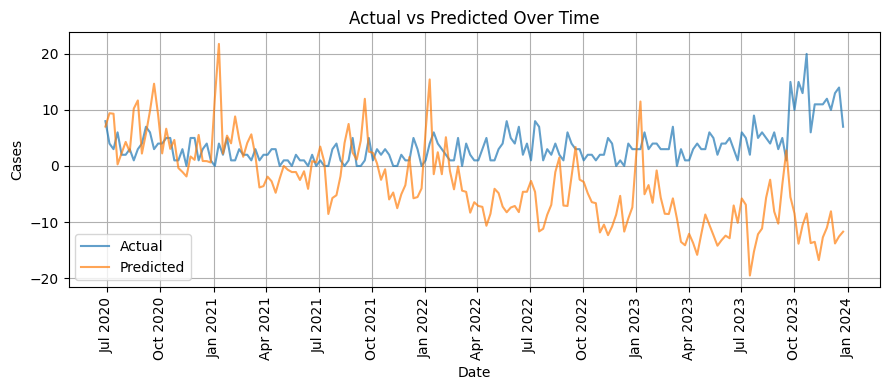


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 1071.5096
   MAE: 826.8283
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


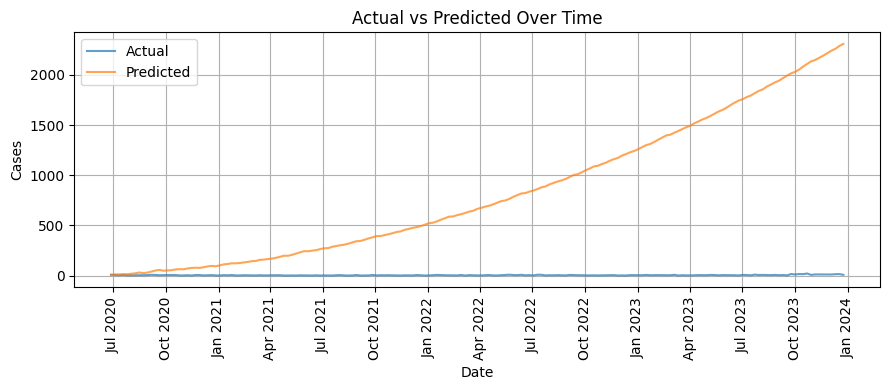


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 233.0824
   MAE: 169.6409
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


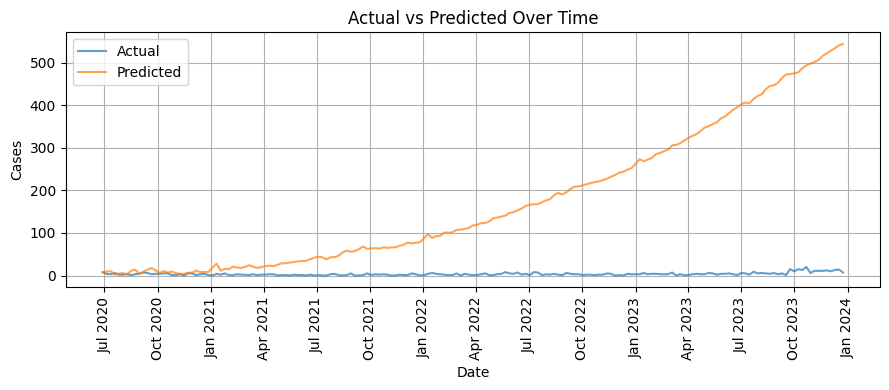


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 338.6237
   MAE: 275.0939
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


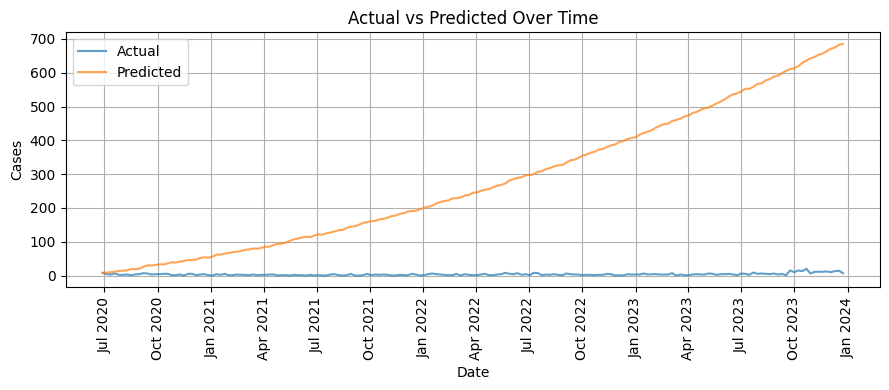


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 16.2019
   MAE: 13.0365
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


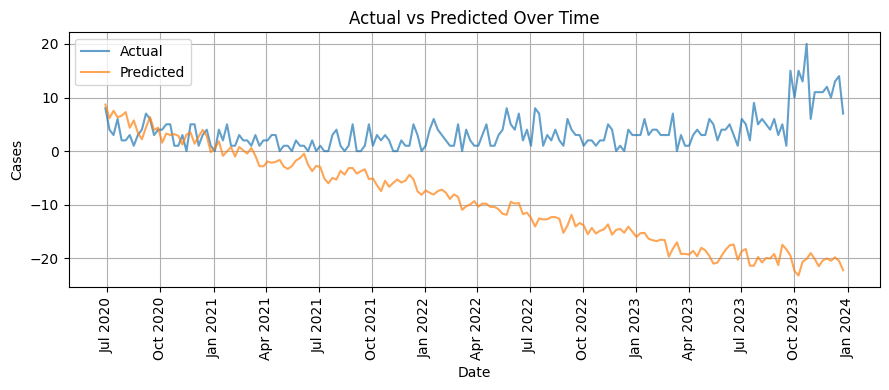


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 25.7054
   MAE: 20.5195
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


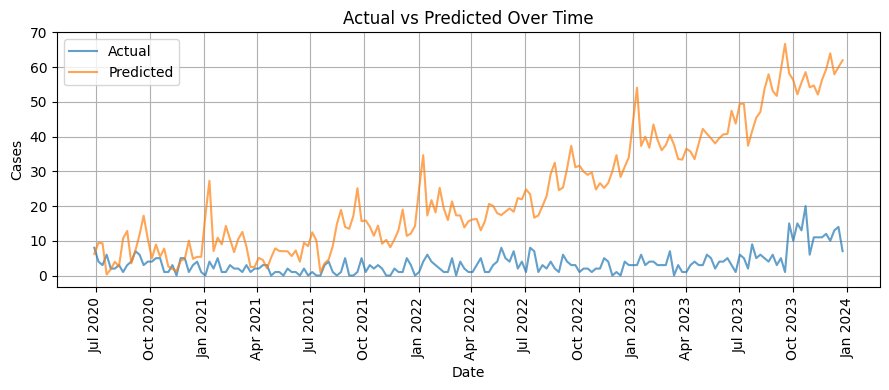


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 11.4168
   MAE: 8.2622
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


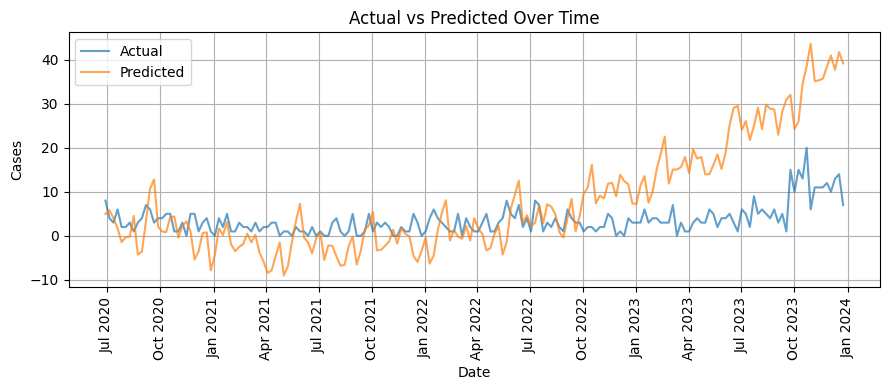


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 28.1209
   MAE: 22.1163
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


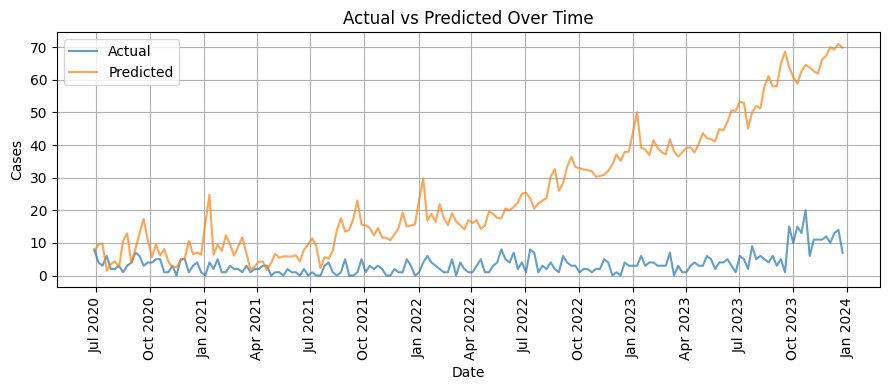


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 45.2001
   MAE: 36.7988
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


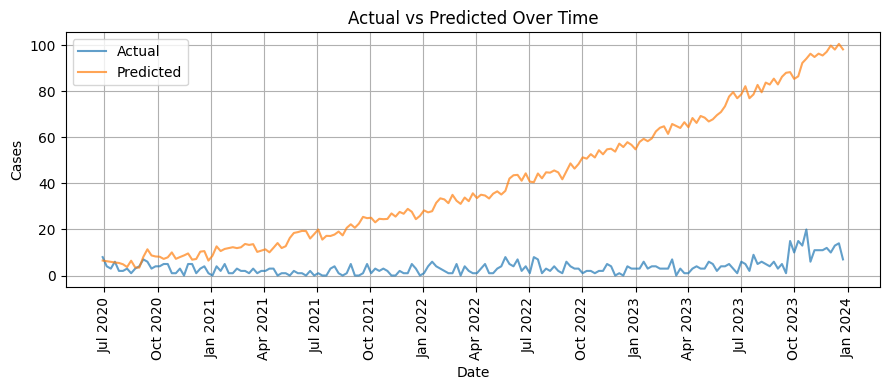


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 17.0999
   MAE: 13.9450
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


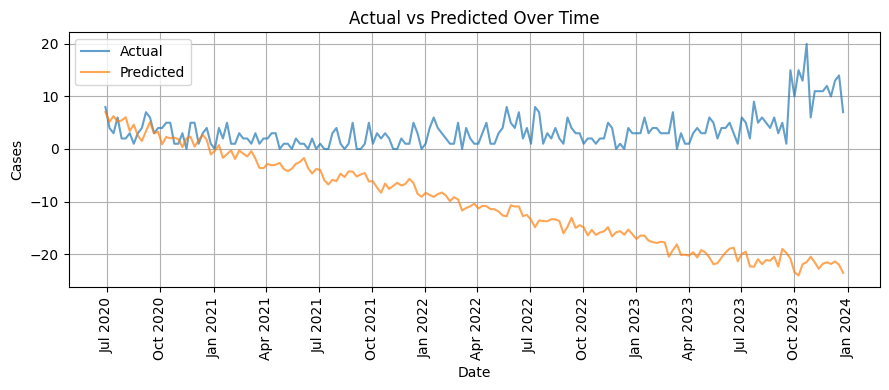


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 41.2793
   MAE: 32.6996
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


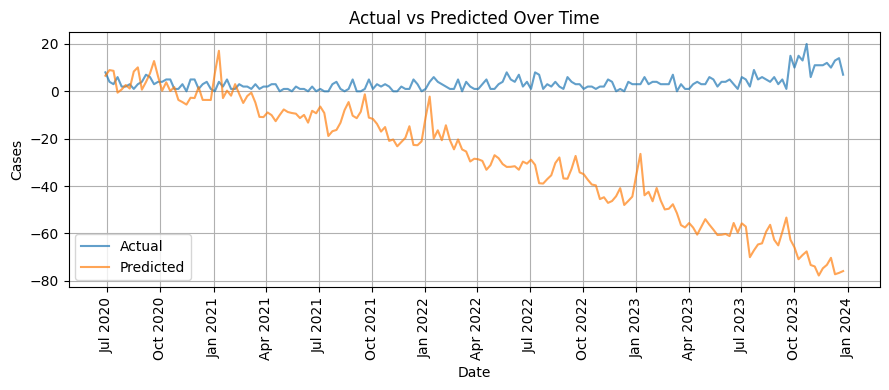


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 15.0815
   MAE: 13.7667
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


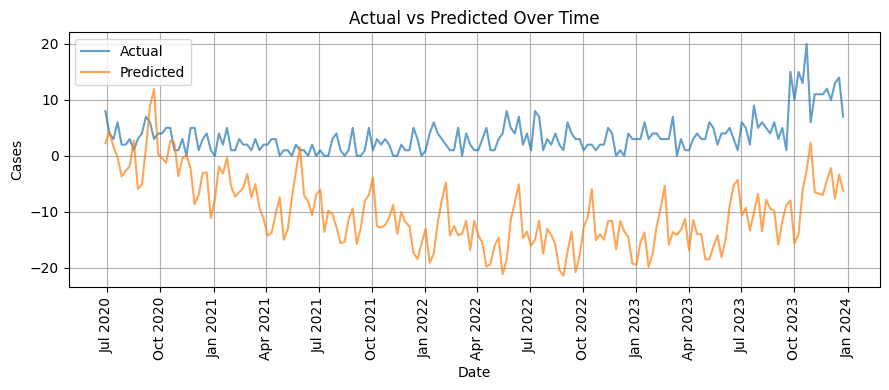


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 9.4724
   MAE: 8.2670
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


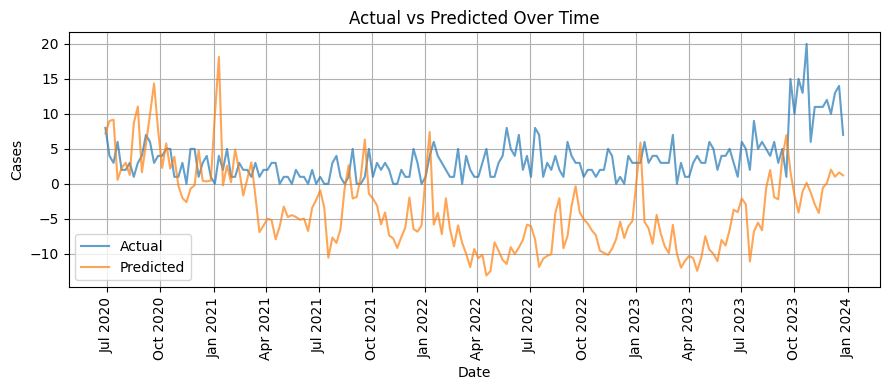


🔹 Ejecutando: use_log=False | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 33.8593
   MAE: 27.5356
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


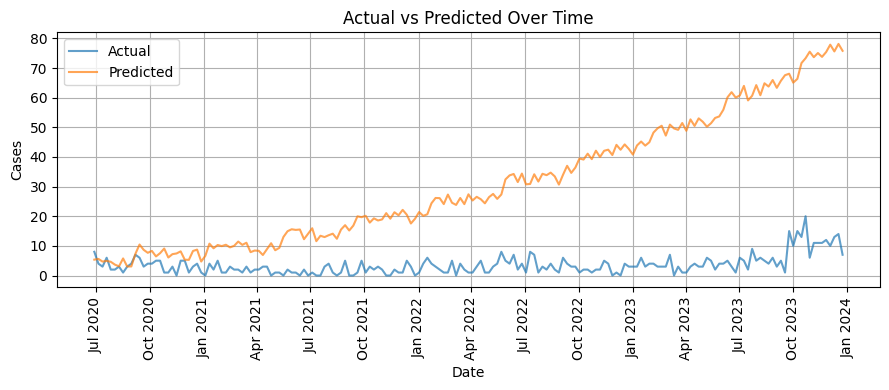


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.3517
   MAE: 3.8816
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


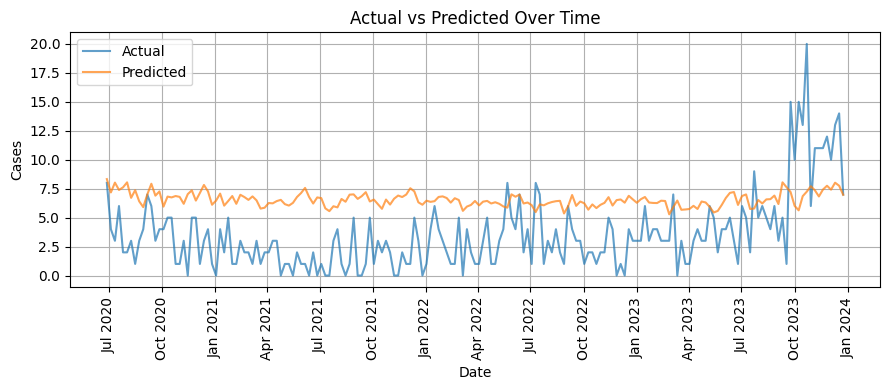


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.4436
   MAE: 4.4572
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


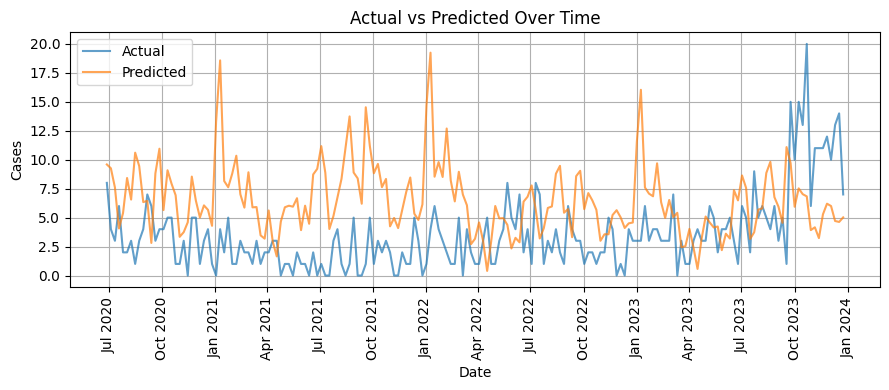


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.0397
   MAE: 3.6381
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


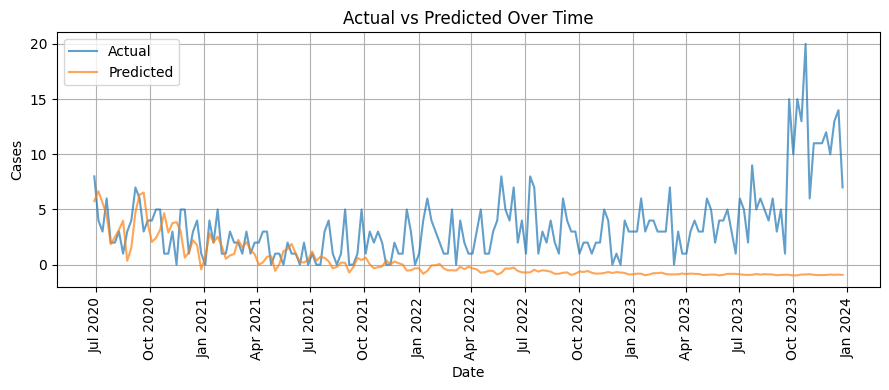


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.0615
   MAE: 3.3960
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


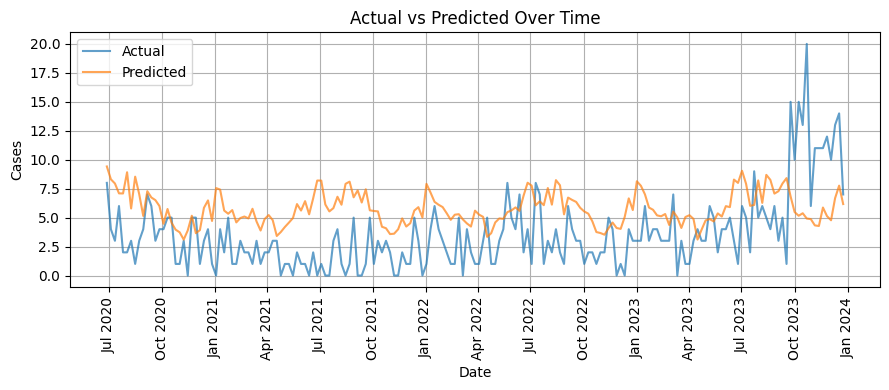


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.0505
   MAE: 3.5482
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


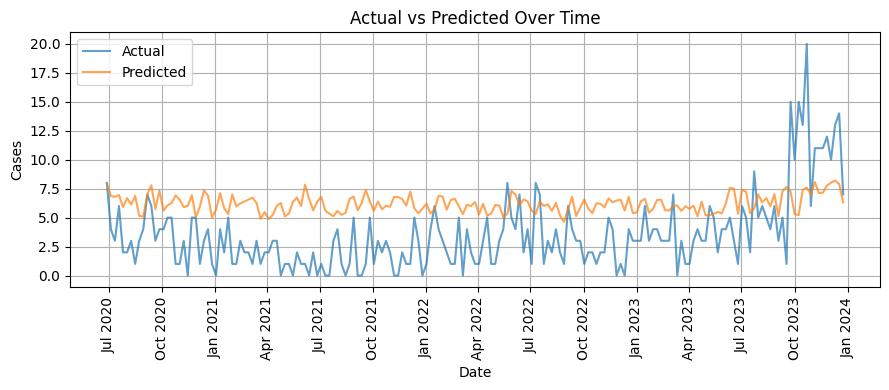


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.4600
   MAE: 2.7786
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


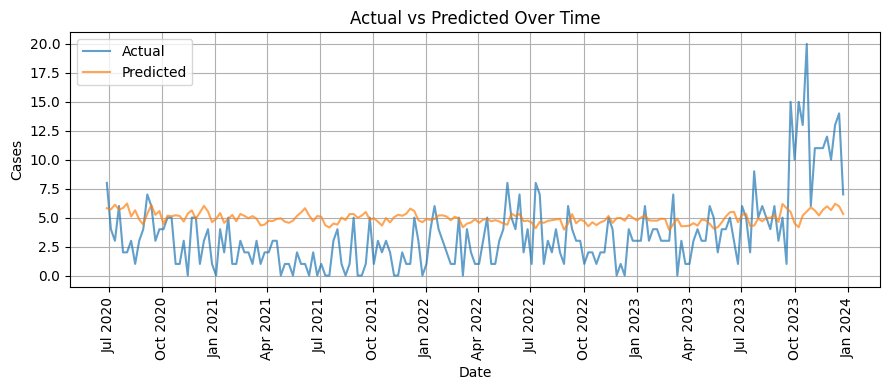


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.5322
   MAE: 5.3754
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


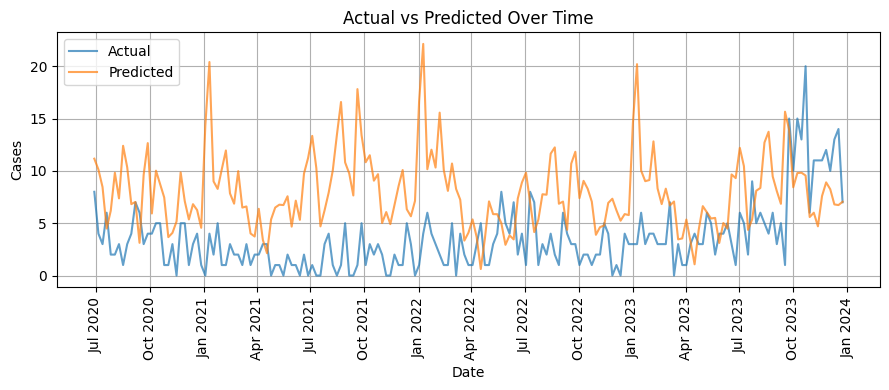


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.1966
   MAE: 3.9083
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


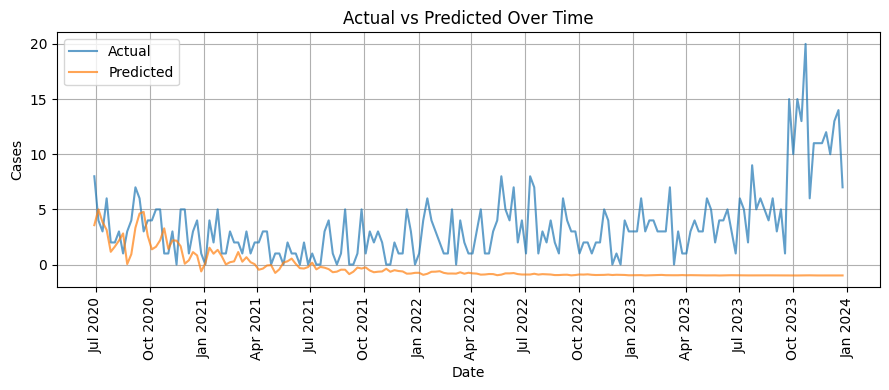


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.5980
   MAE: 2.6160
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


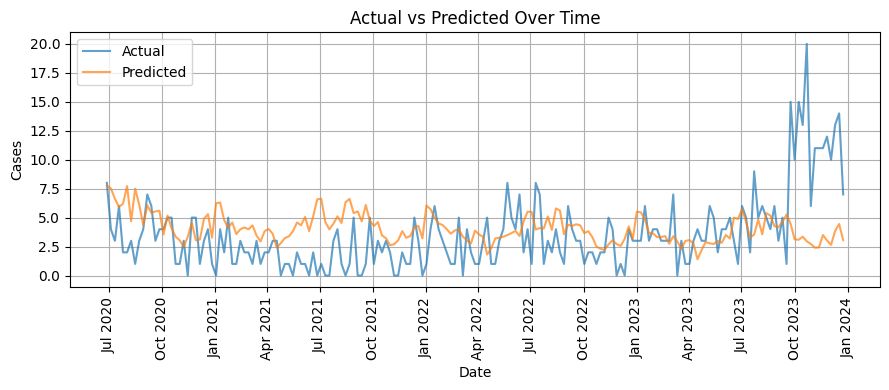


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.3208
   MAE: 2.5244
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


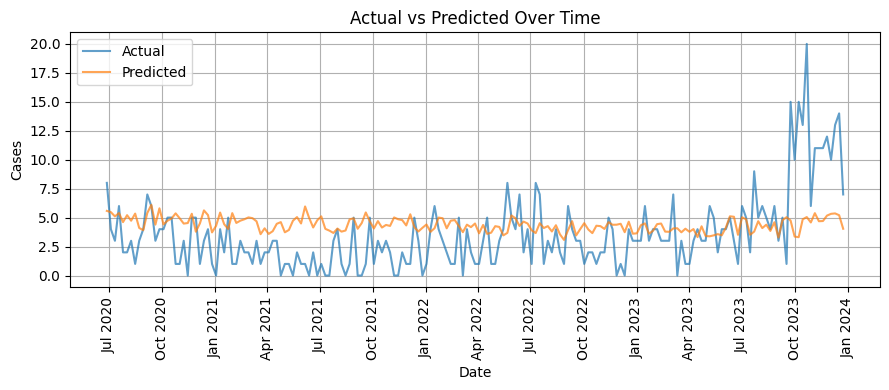


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1860
   MAE: 2.3415
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


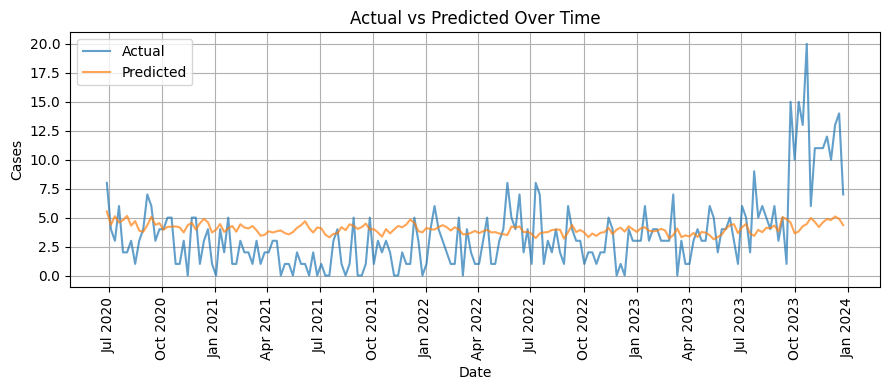


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.0729
   MAE: 4.1064
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


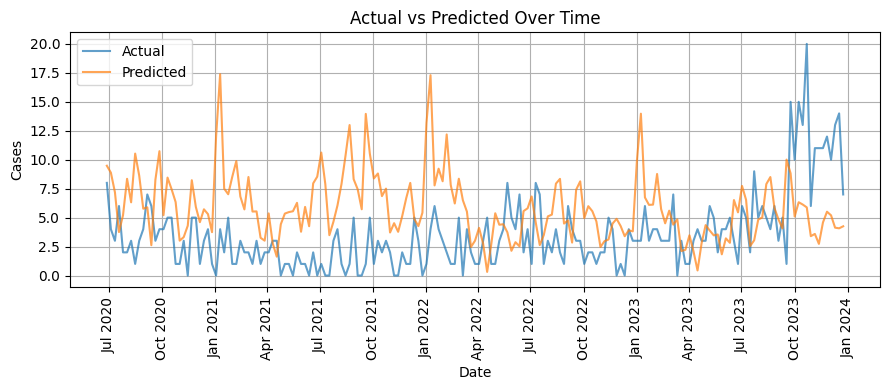


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2635
   MAE: 4.0363
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


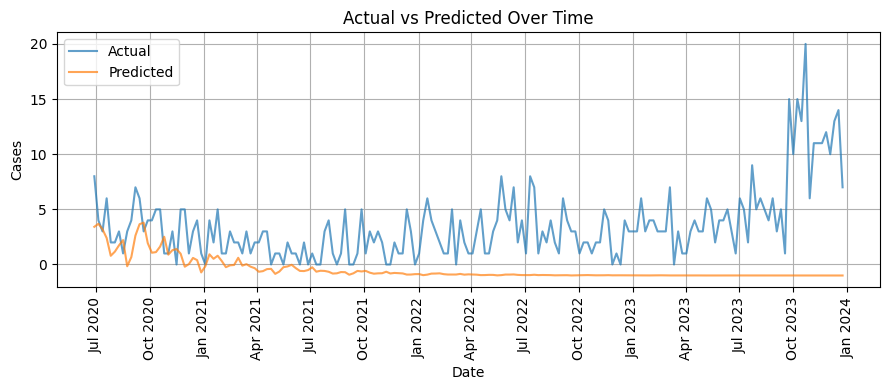


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.4624
   MAE: 2.4150
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


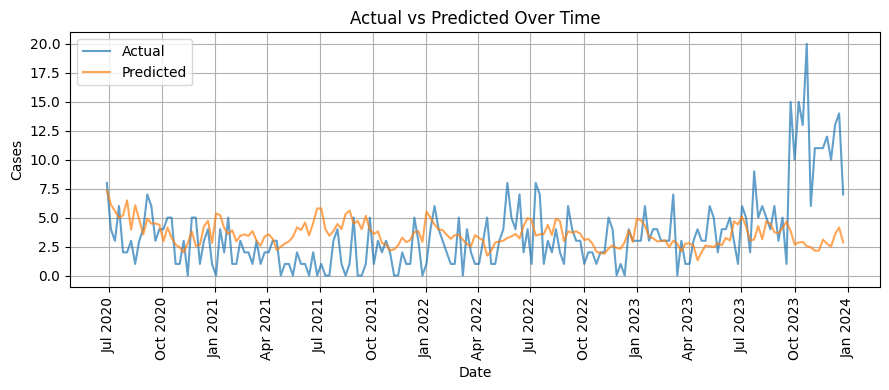


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.2621
   MAE: 2.2636
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


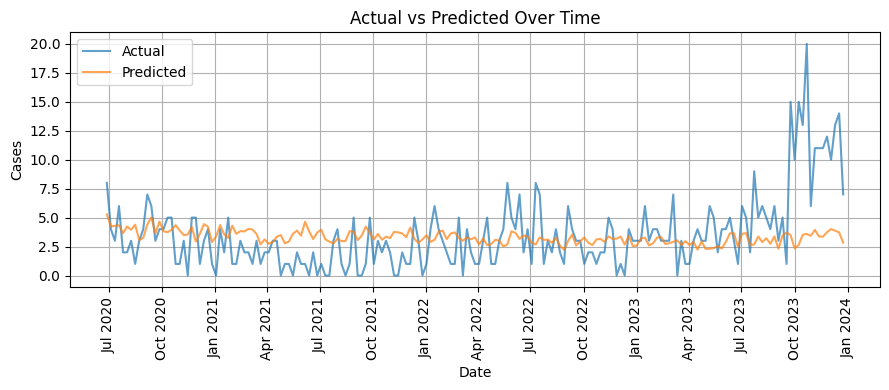


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1869
   MAE: 2.3454
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


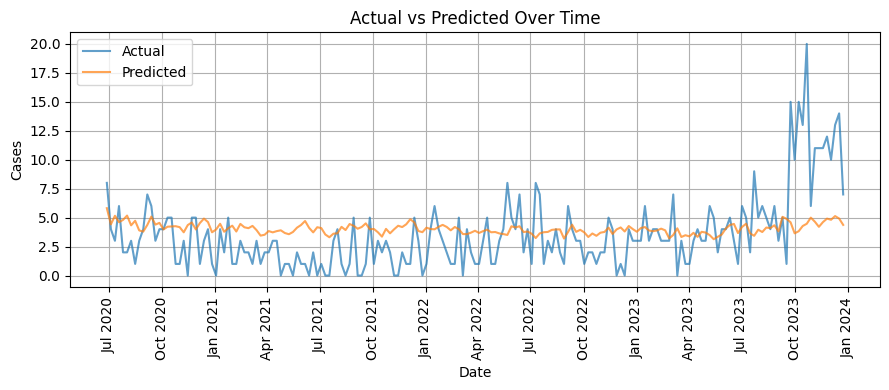


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.0704
   MAE: 4.1042
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


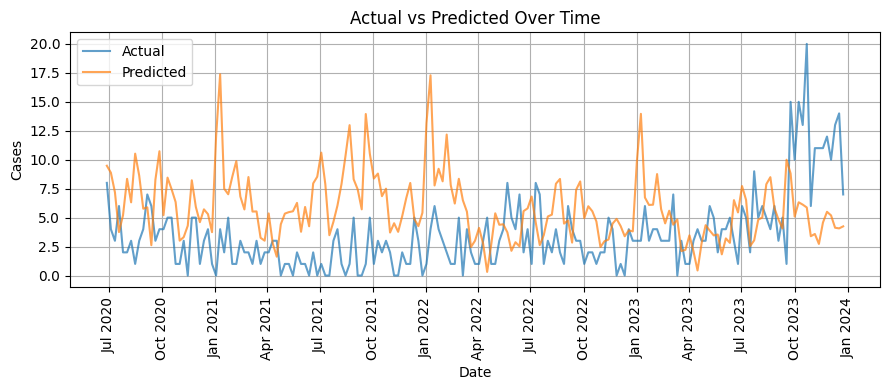


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2622
   MAE: 4.0342
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


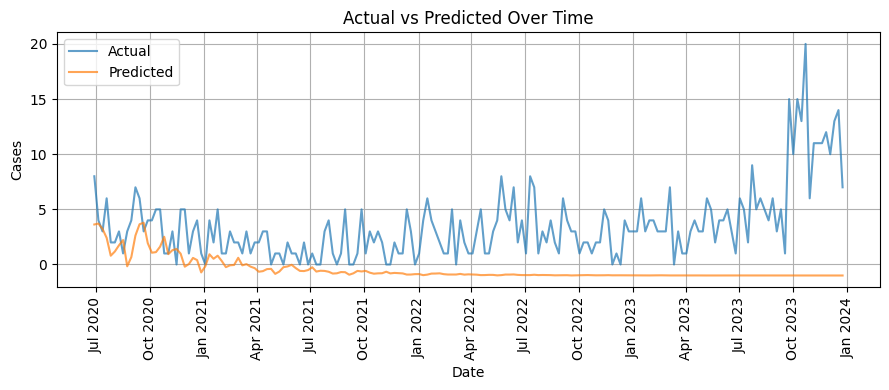


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.4519
   MAE: 2.4212
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


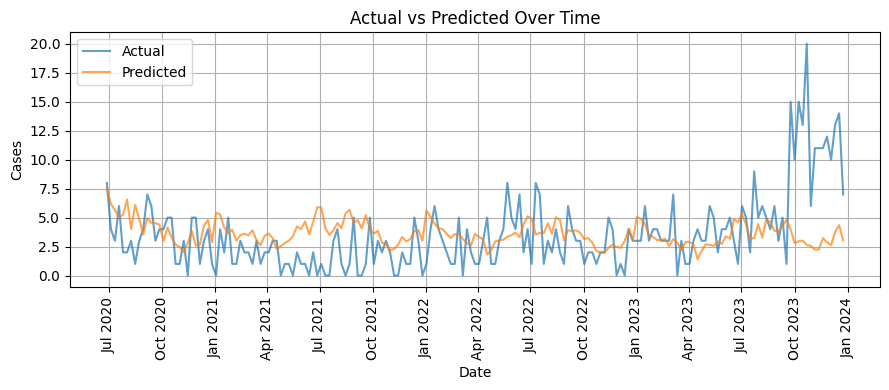


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.2329
   MAE: 2.2532
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


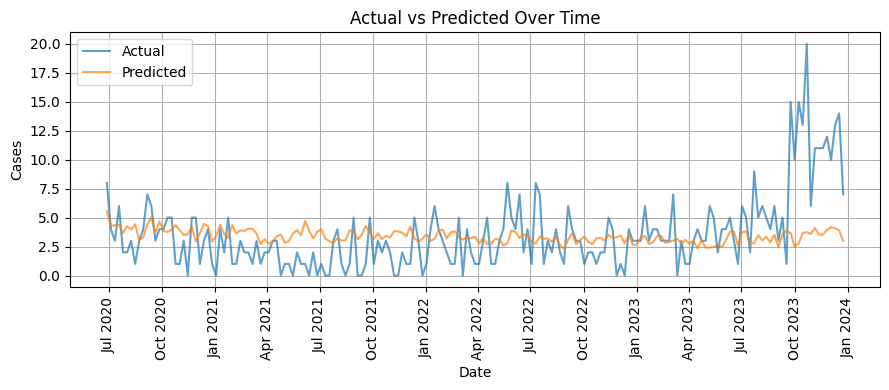


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.3336
   MAE: 2.9369
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


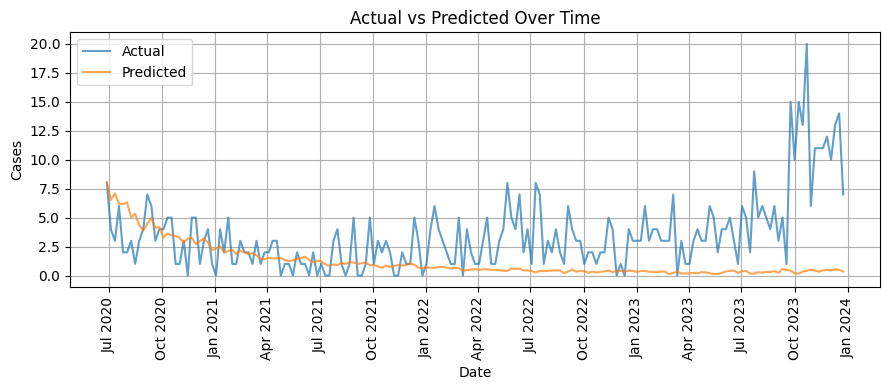


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.6436
   MAE: 5.4658
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


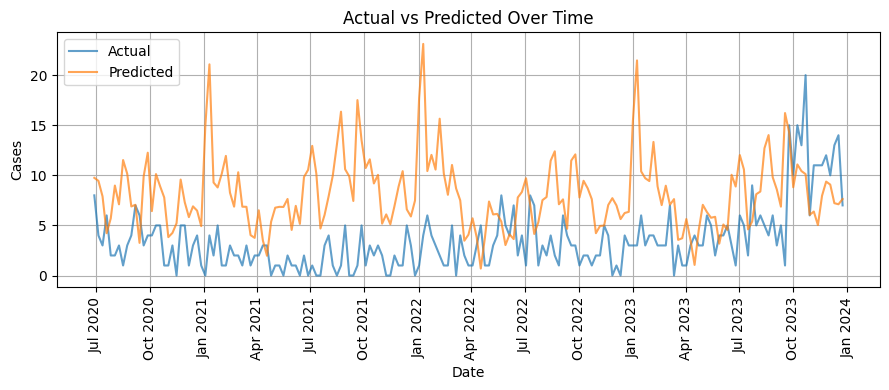


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.6372
   MAE: 3.8743
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


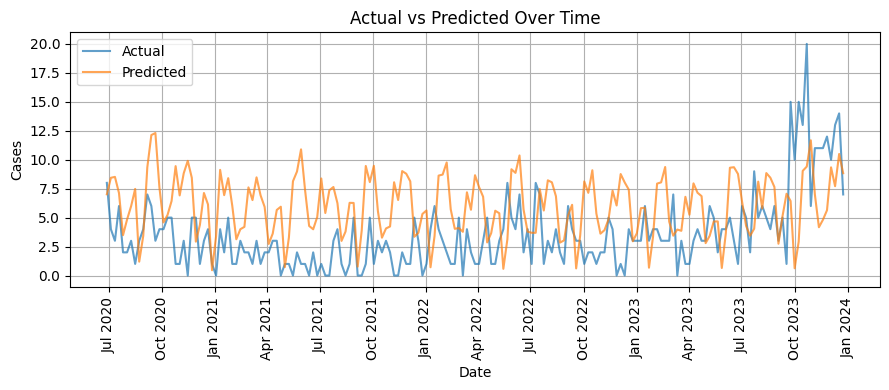


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 7.4173
   MAE: 6.7880
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


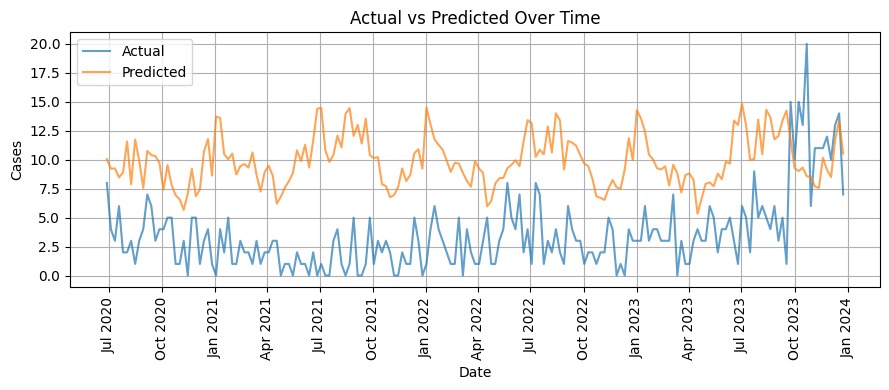


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 7.0695
   MAE: 6.5588
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


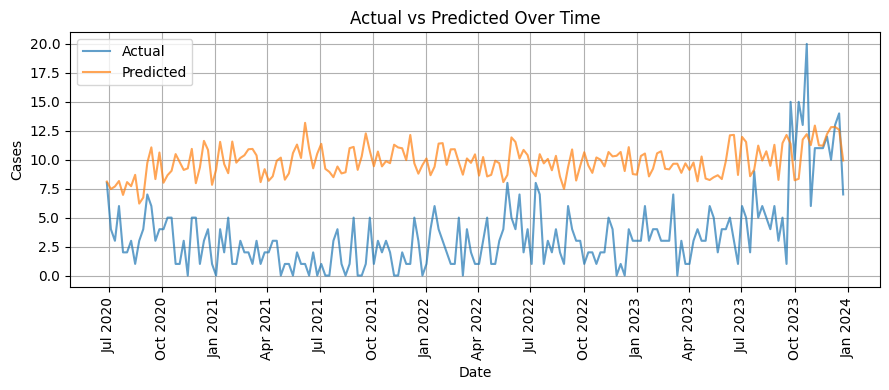


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.6768
   MAE: 2.4636
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


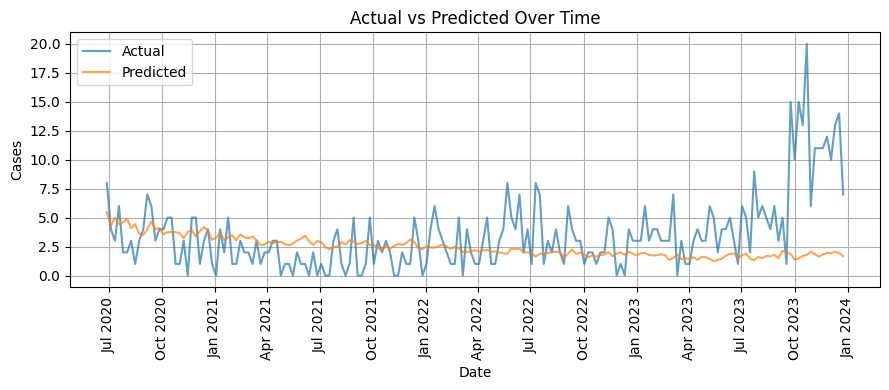


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.6995
   MAE: 4.6720
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


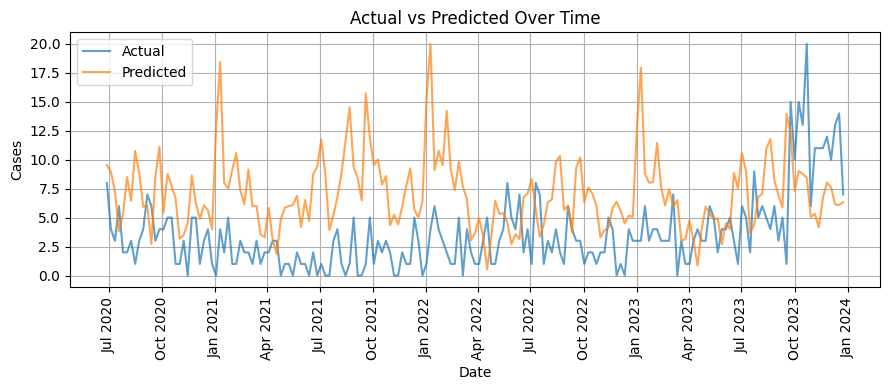


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.7873
   MAE: 2.5599
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


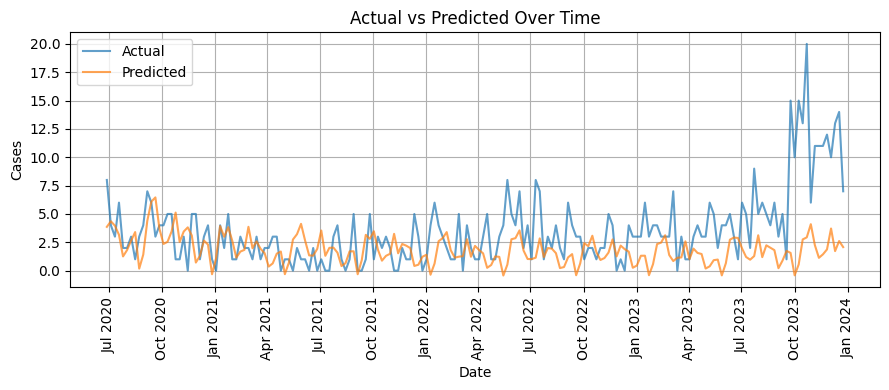


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.5935
   MAE: 2.8976
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


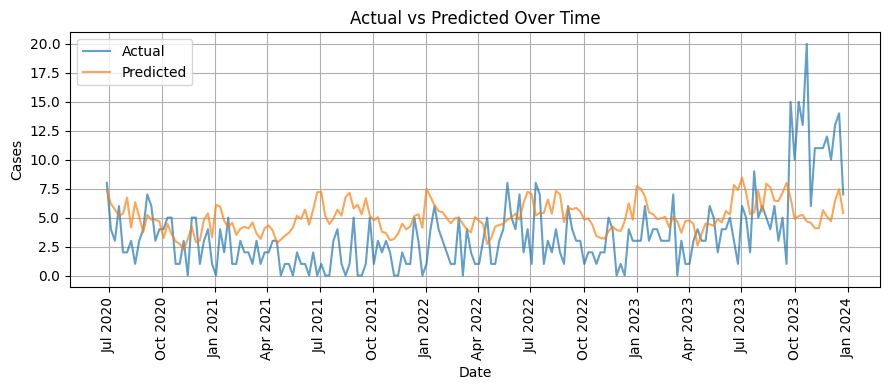


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.4673
   MAE: 2.9505
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


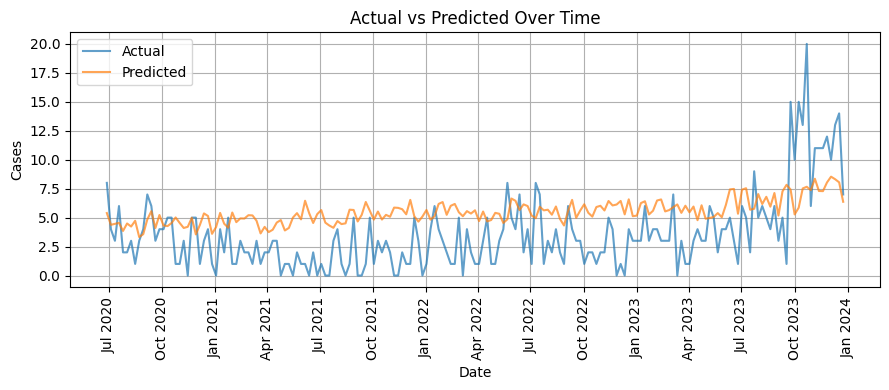


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 19399224592021835235400560928809100864254279229109345563348828160.0000
   MAE: 2362908190967310006662727419688065511892467843839904667505000448.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


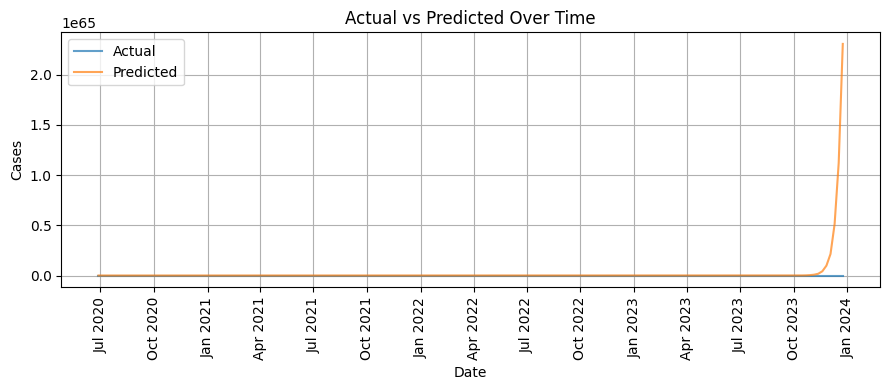


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.4767
   MAE: 4.3863
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


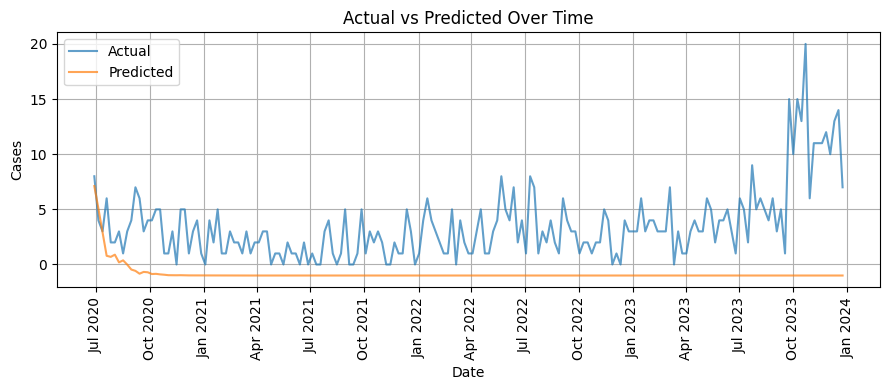


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}

❌ Error usando los parametros: use_log=True, target=absolute, fechas=['2007-01-01', '2020-06-28', '2024-01-01'], params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   -> Error: Input contains infinity or a value too large for dtype('float64').


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 85511574824332300563773567046149821943045227523000500224.0000
   MAE: 10115493172874798357816023706653944163324140014677262336.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


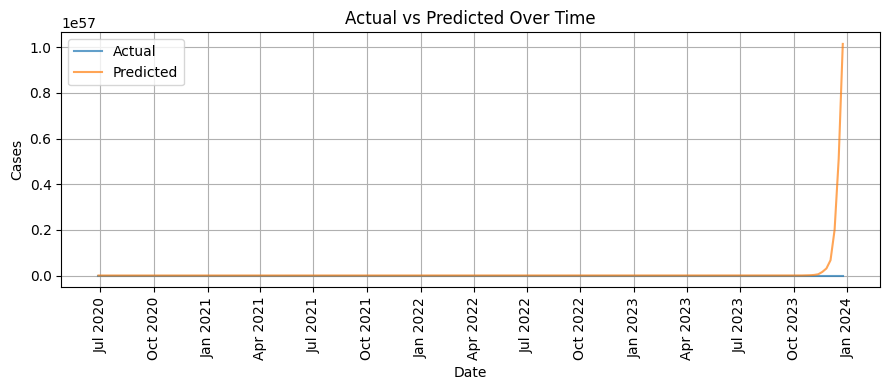


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 1359847213580162582513049503196201066339331411590344641669973699889217823318212608.0000
   MAE: 140987598047229644570815915794814731098694850316397966011707718074265293507526656.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


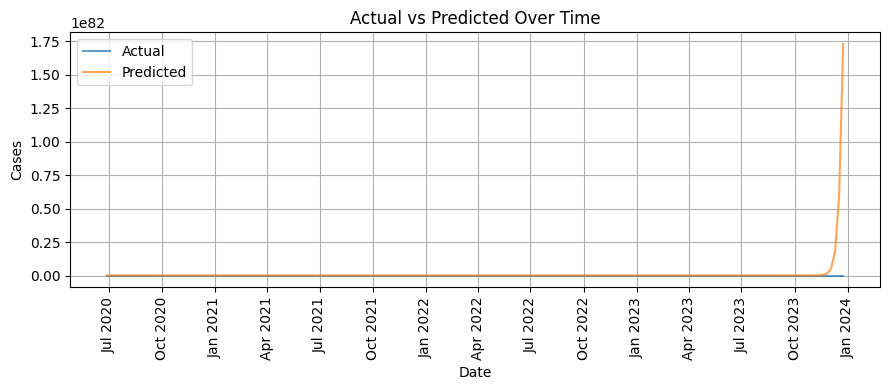


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 12371974496665878441388689579113971712.0000
   MAE: 1928844489934378481973761978476265472.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


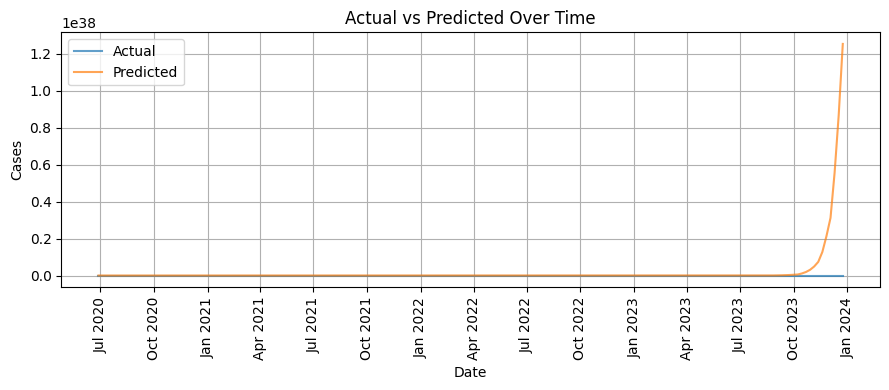


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 9037971553316673589084160.0000
   MAE: 1350341437570537570172928.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


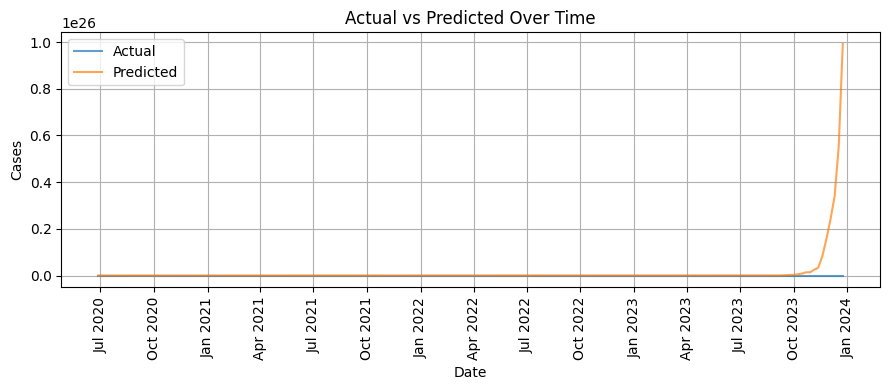


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: inf
   MAE: 2092157687809771393908512888405027437464528628573280142409477099818016543705692062136849294185926279746294952811640994942975524431922081382682486105964544.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


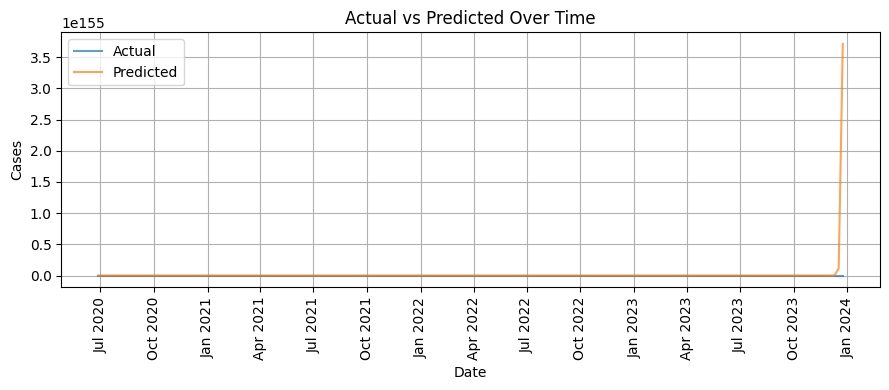


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 2413719915198337454279804009316352.0000
   MAE: 350637770215058001382700581126144.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


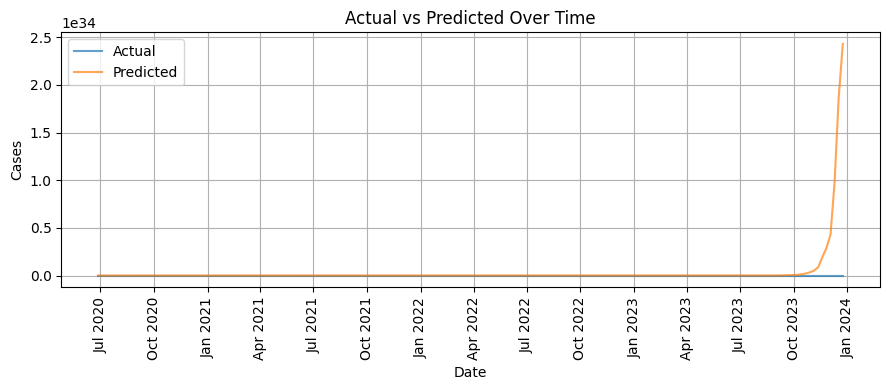


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 932340464755247218714885771987685530927104.0000
   MAE: 130197101694071745935857544805997875298304.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


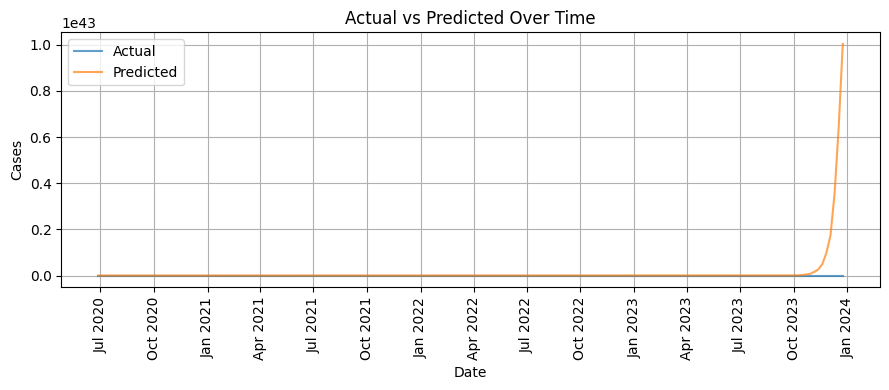


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.0377
   MAE: 5.5965
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


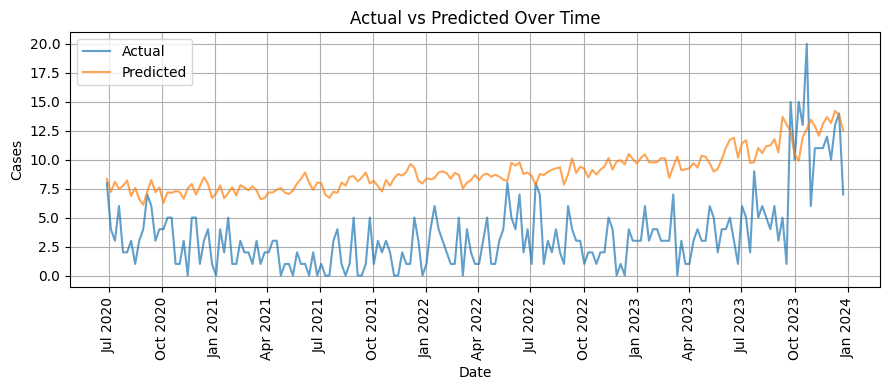


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.9735
   MAE: 3.8862
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


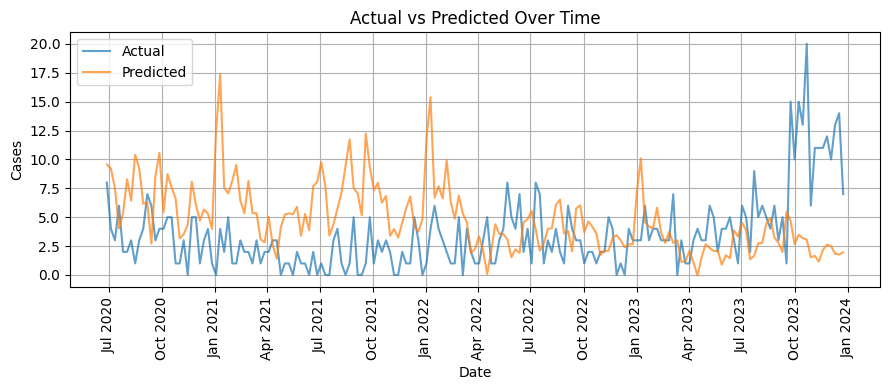


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.1231
   MAE: 3.7472
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


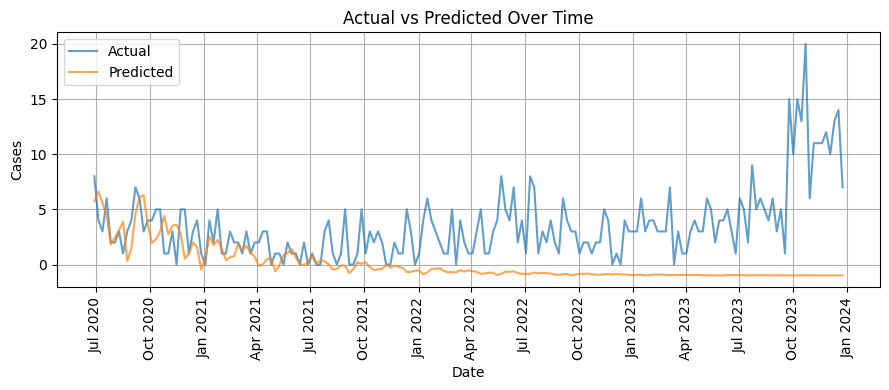


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5946
   MAE: 3.1744
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


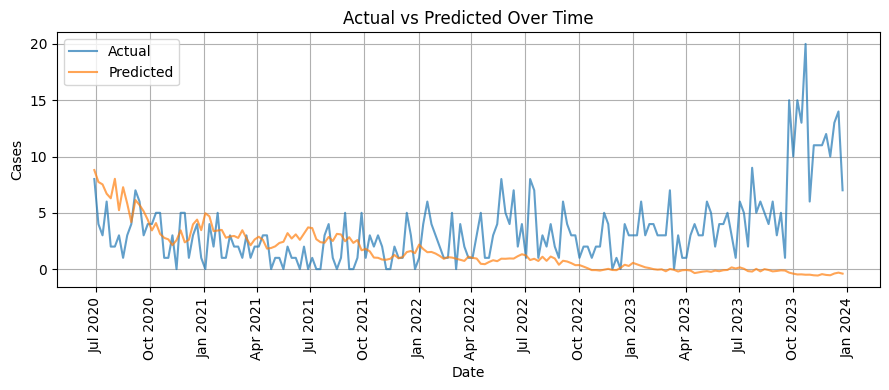


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5273
   MAE: 3.1993
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


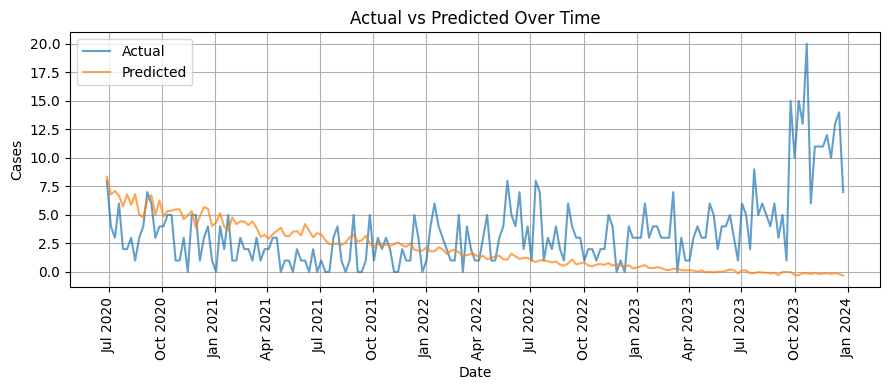


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.1240
   MAE: 3.6909
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


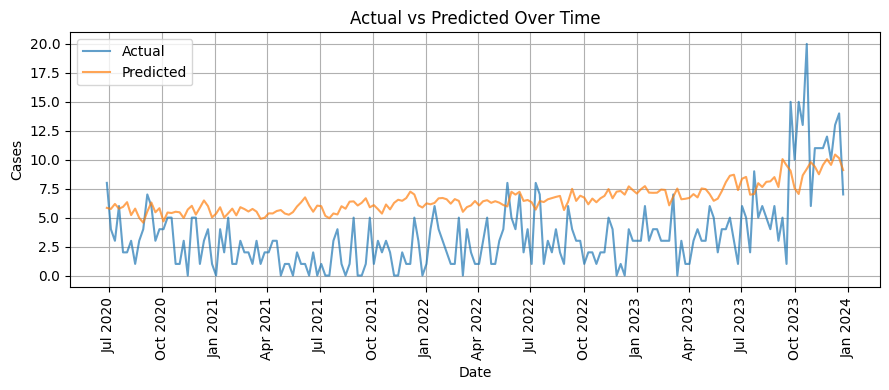


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.6057
   MAE: 4.5441
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


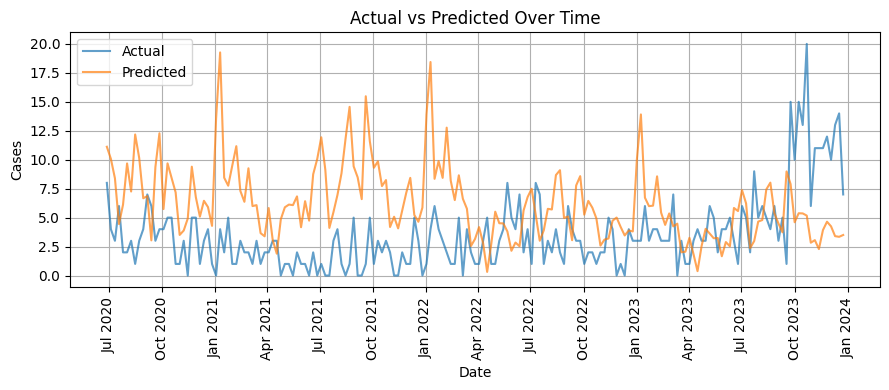


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2331
   MAE: 3.9761
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


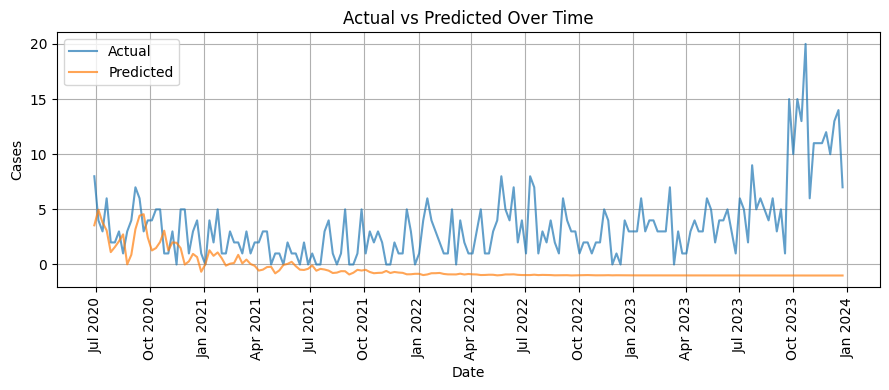


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.6918
   MAE: 3.2479
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


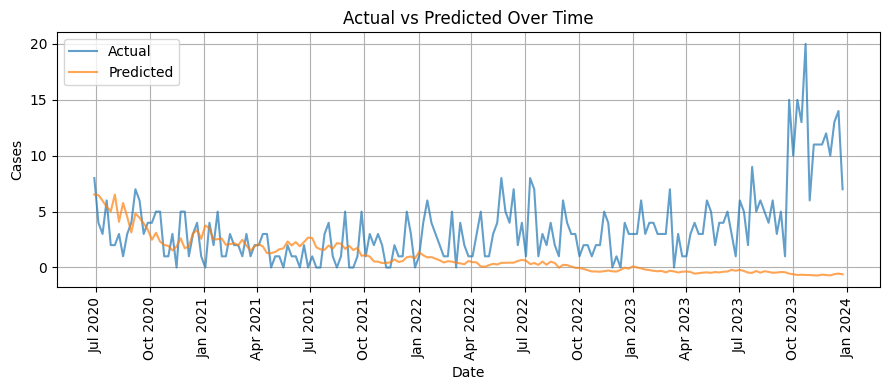


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2007-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.6235
   MAE: 3.1713
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


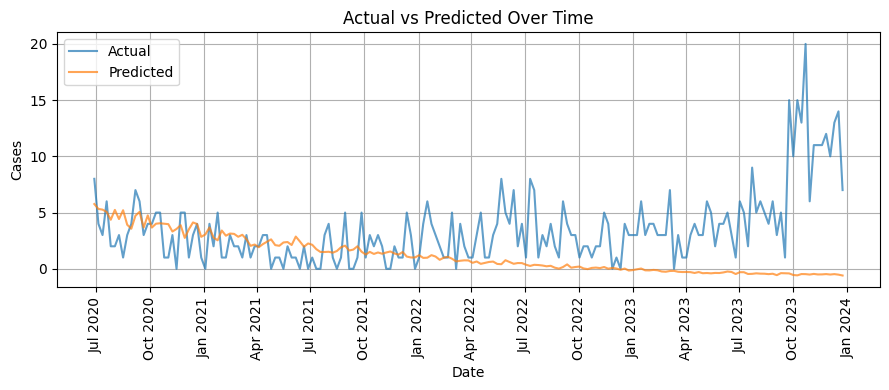


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.3305
   MAE: 2.5871
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


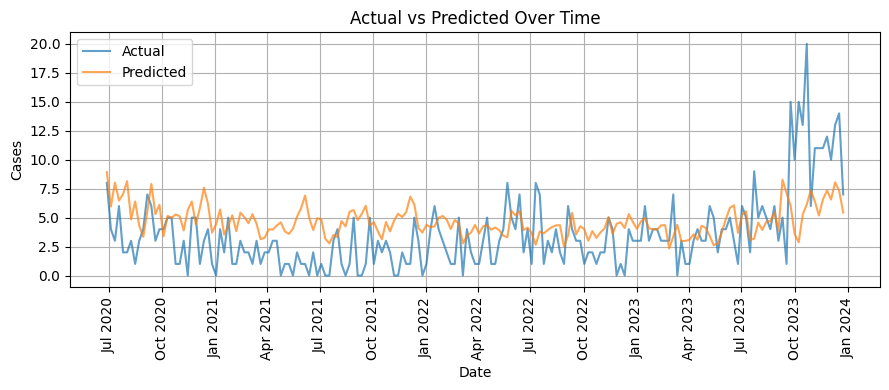


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.3162
   MAE: 3.1369
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


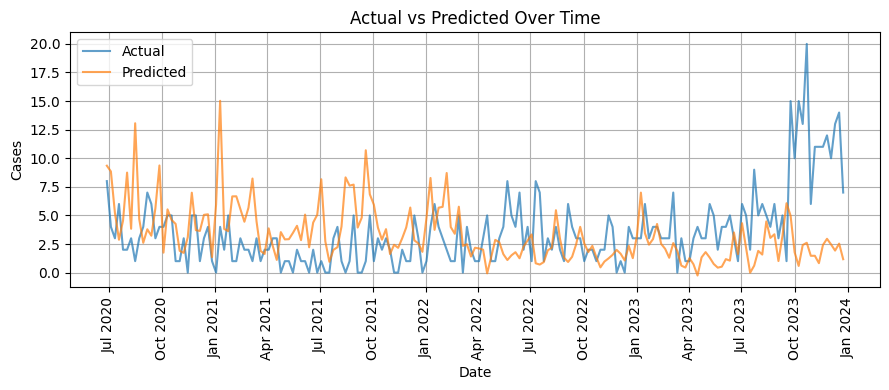


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2025
   MAE: 3.9246
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


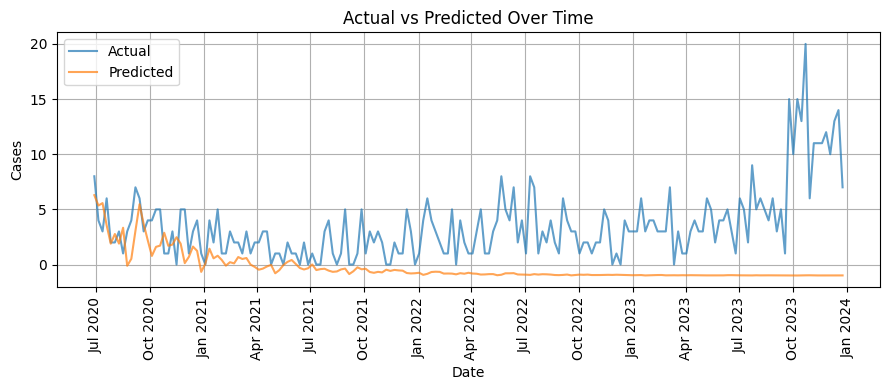


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5351
   MAE: 3.1532
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


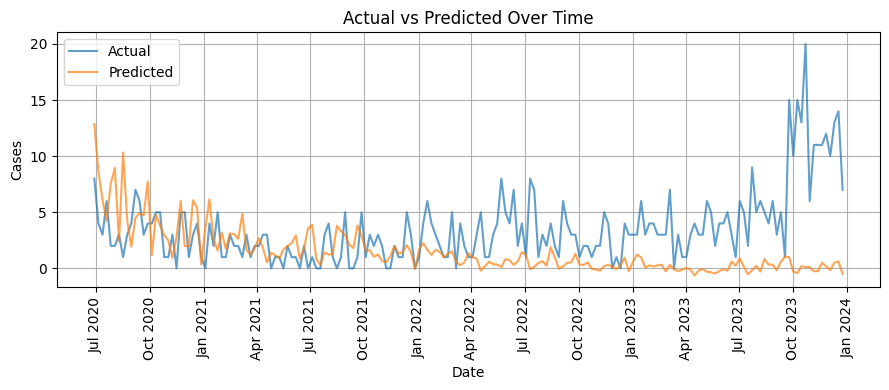


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.4241
   MAE: 3.0232
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


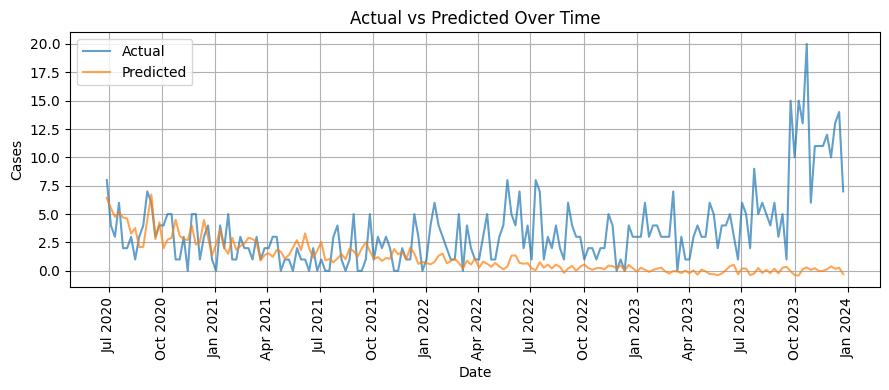


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1473
   MAE: 2.2926
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


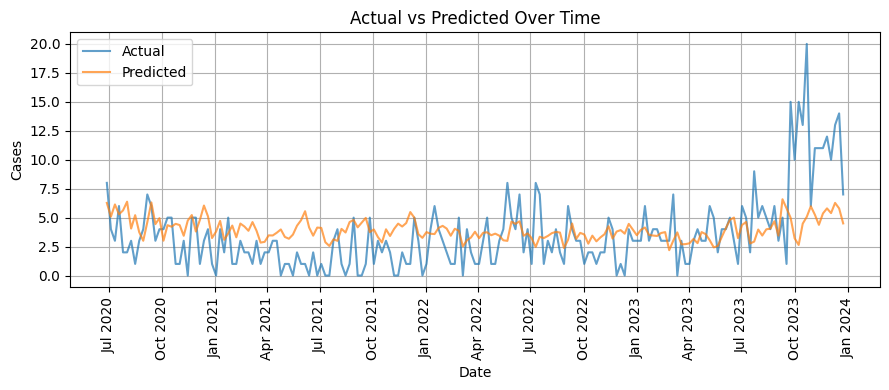


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.6618
   MAE: 3.5744
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


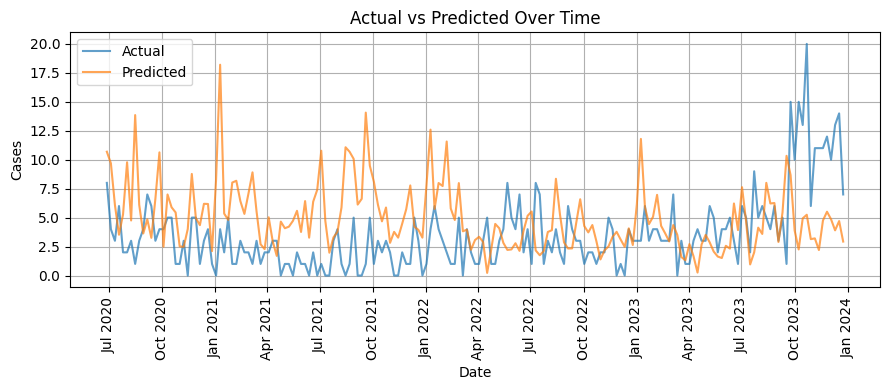


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2638
   MAE: 4.0356
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


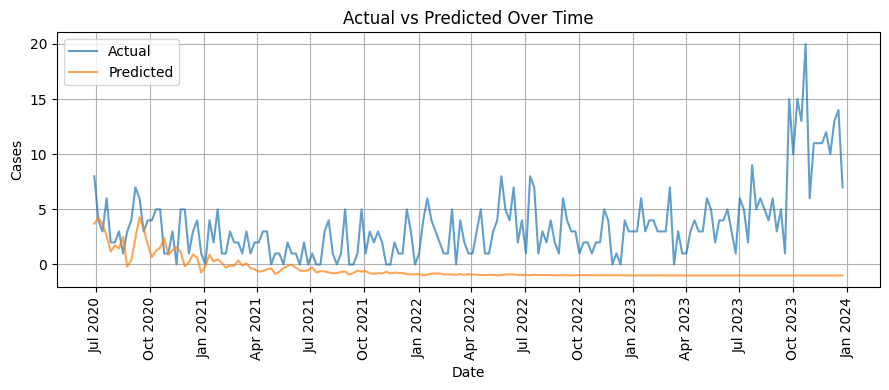


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.3703
   MAE: 3.0255
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


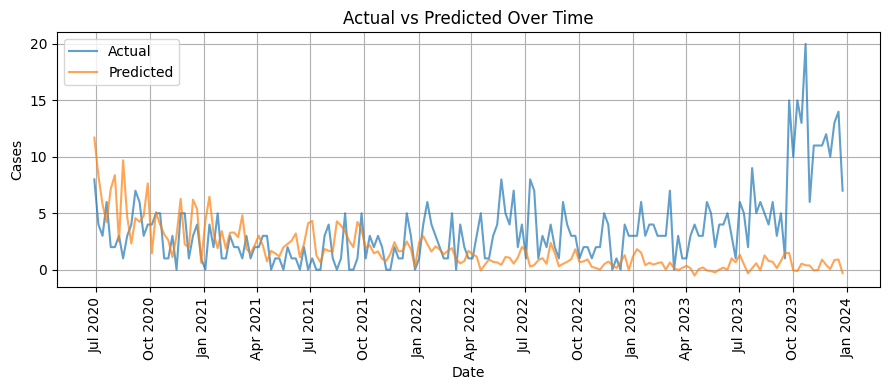


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.4335
   MAE: 3.0091
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


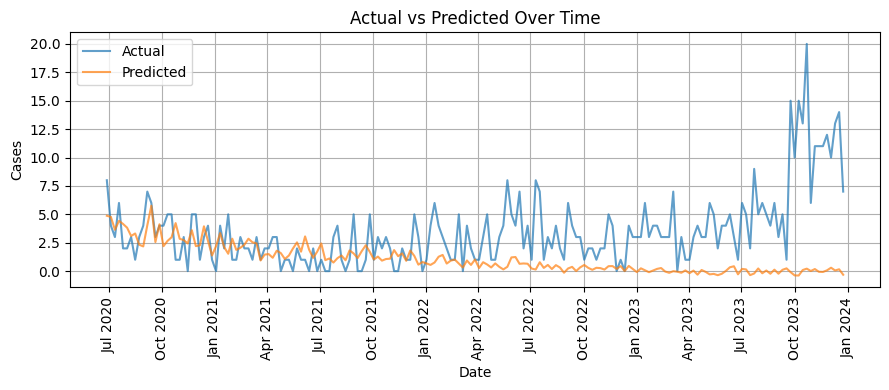


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1024
   MAE: 2.1441
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


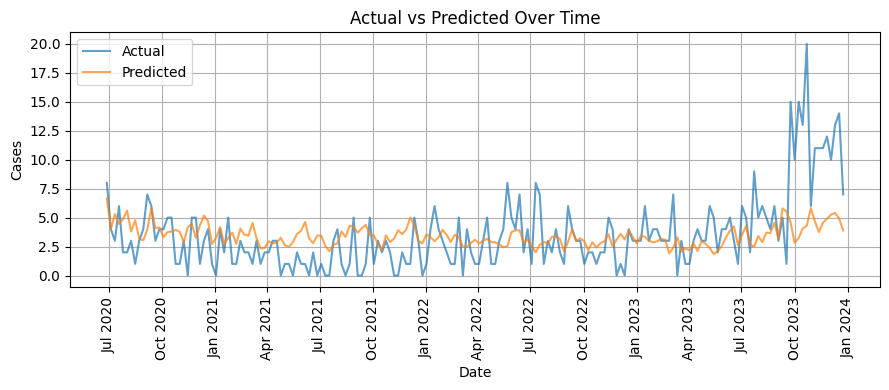


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5449
   MAE: 3.4740
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


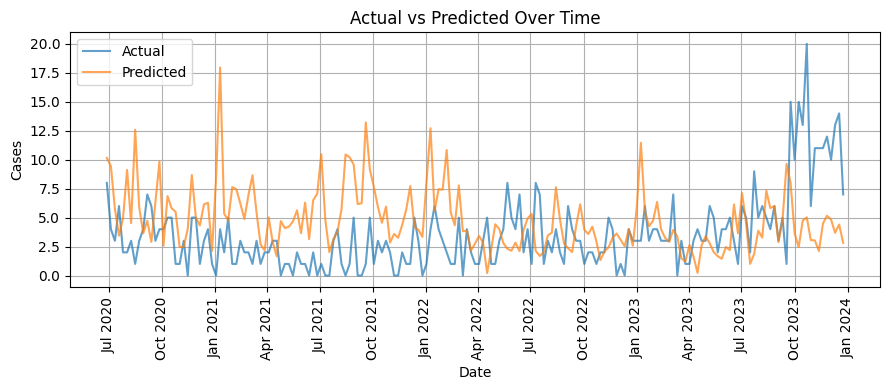


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2563
   MAE: 4.0268
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


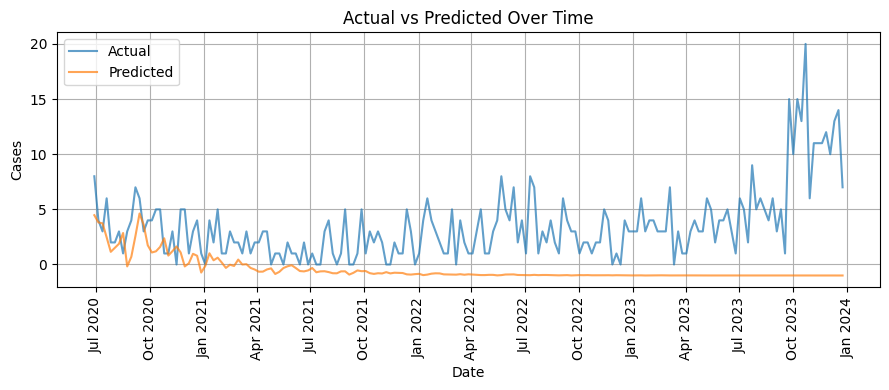


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.1178
   MAE: 2.8333
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


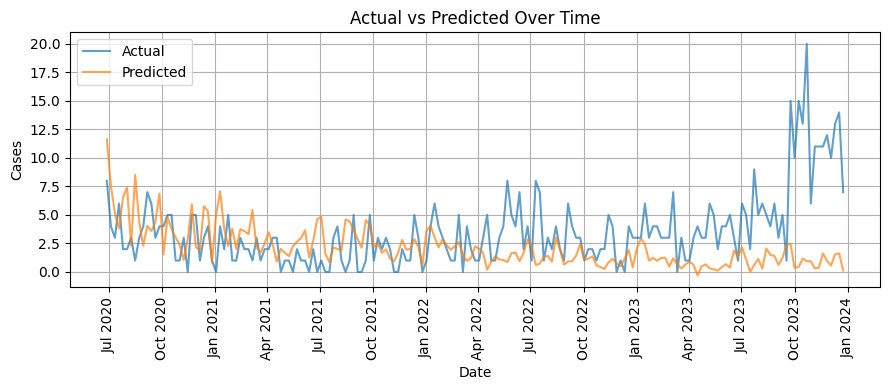


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.4646
   MAE: 3.0357
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


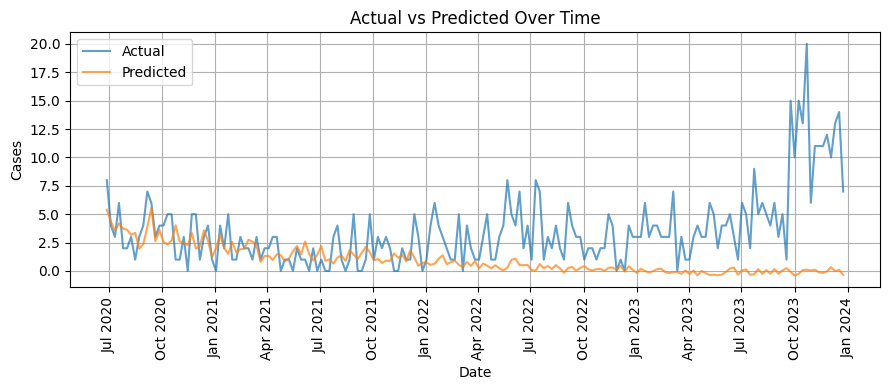


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.1005
   MAE: 2.1583
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


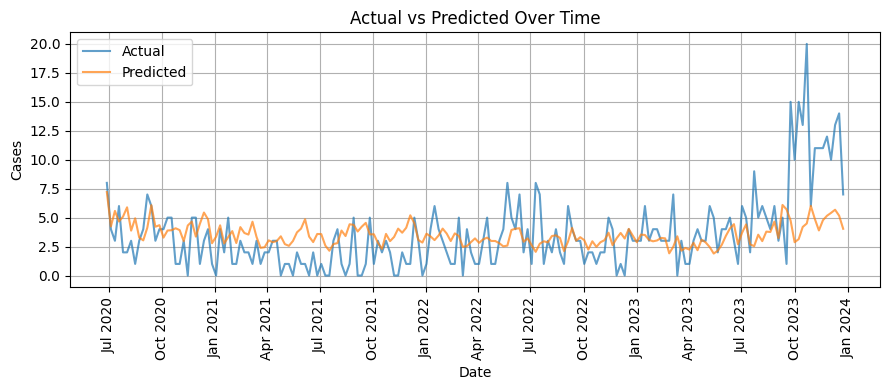


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5484
   MAE: 3.4734
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


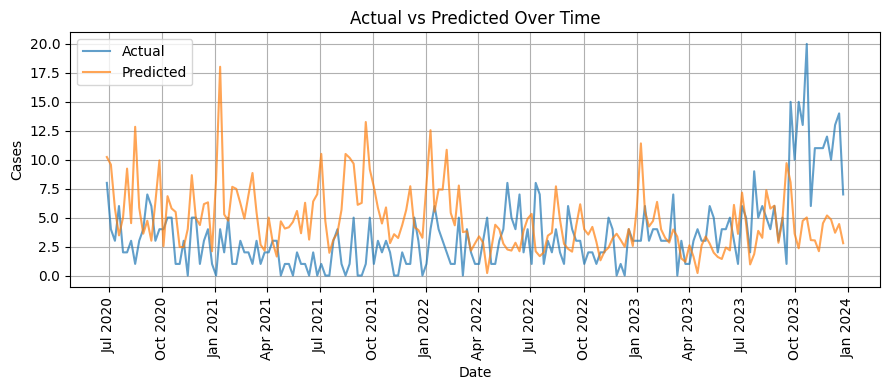


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2413
   MAE: 3.9966
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


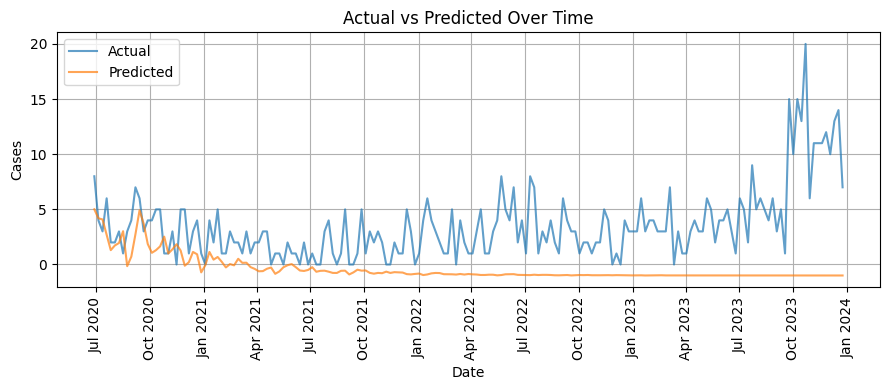


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.1222
   MAE: 2.8412
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


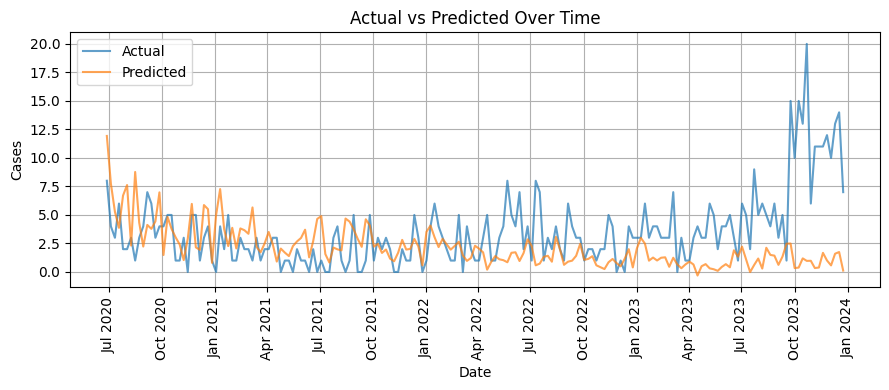


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 1, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.4470
   MAE: 3.0241
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


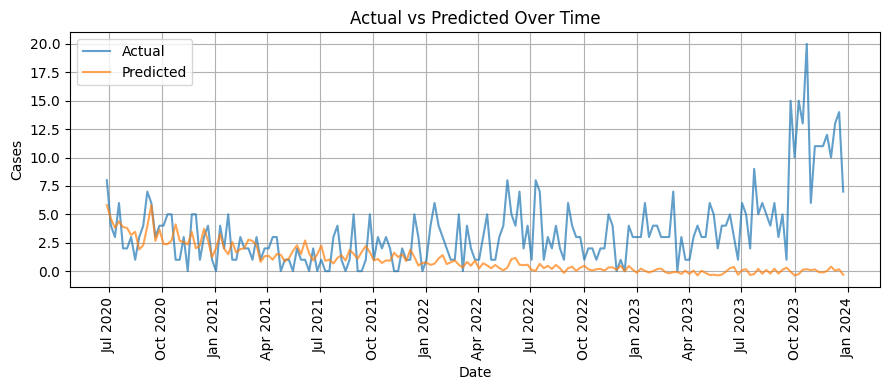


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.9836
   MAE: 2.7536
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


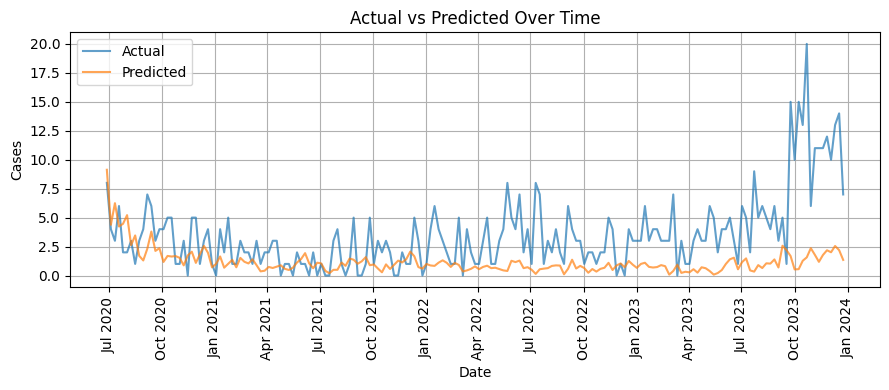


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 6.1411
   MAE: 4.7587
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


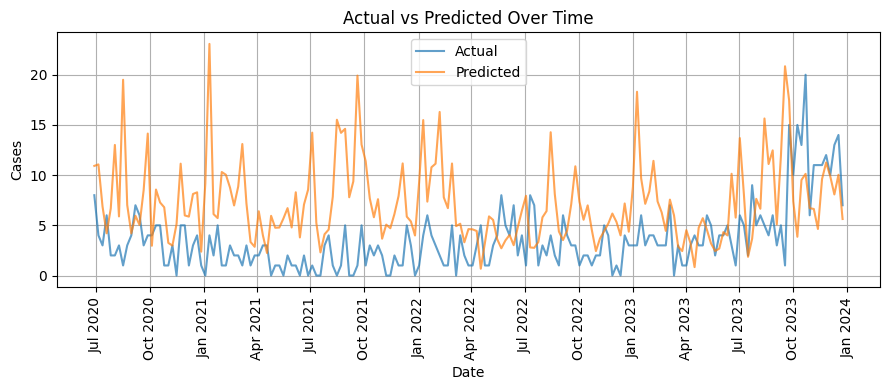


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5750
   MAE: 3.7428
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


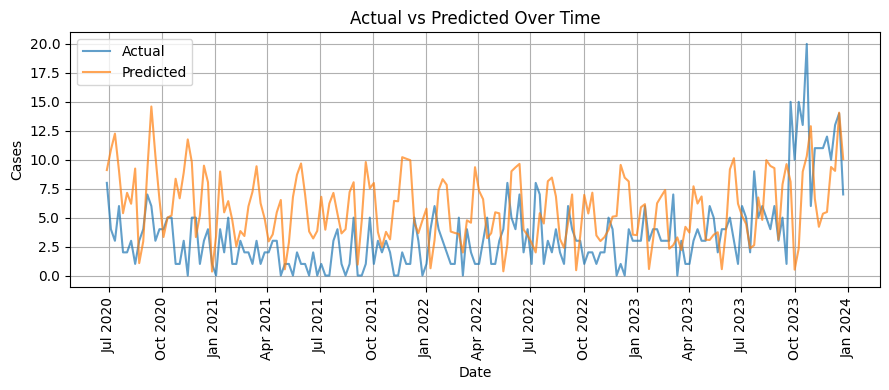


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.5678
   MAE: 3.6726
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


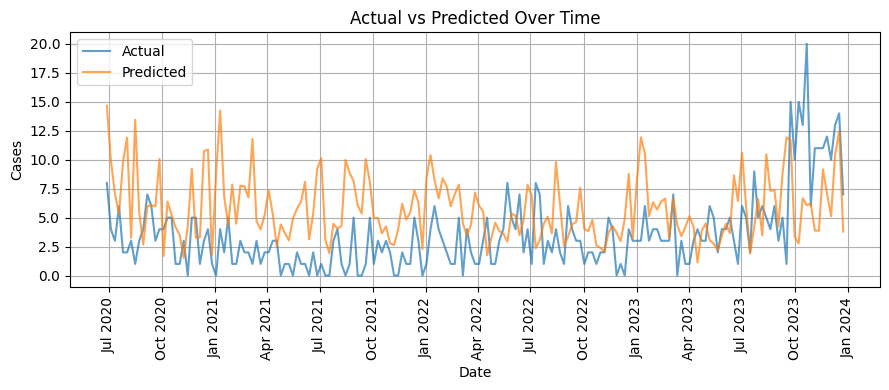


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.0296
   MAE: 3.4102
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


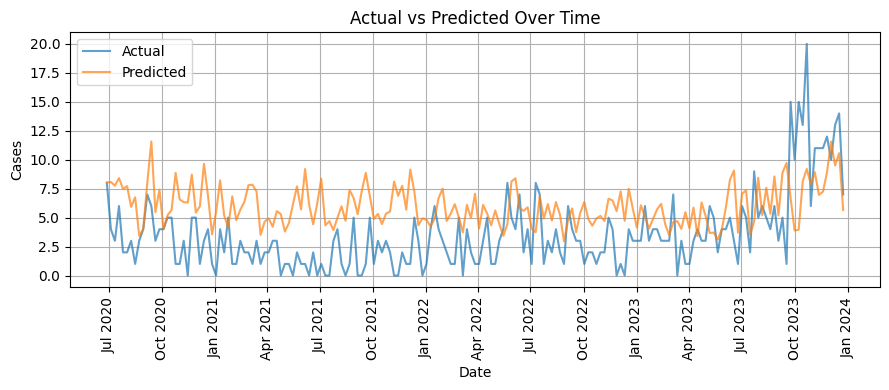


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 3.4053
   MAE: 2.2979
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


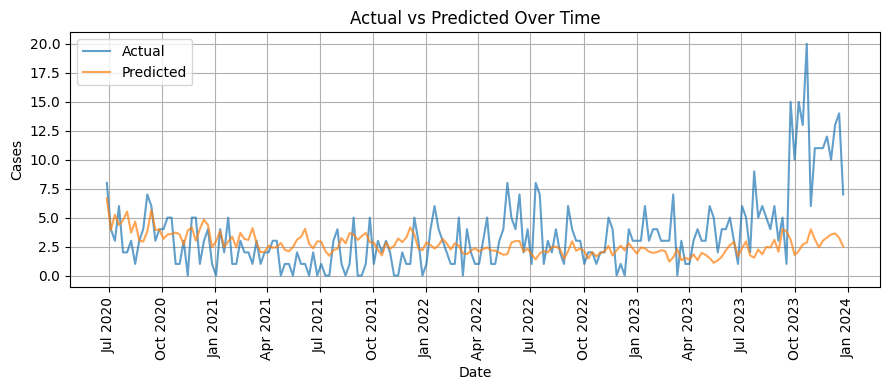


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.1542
   MAE: 4.0984
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


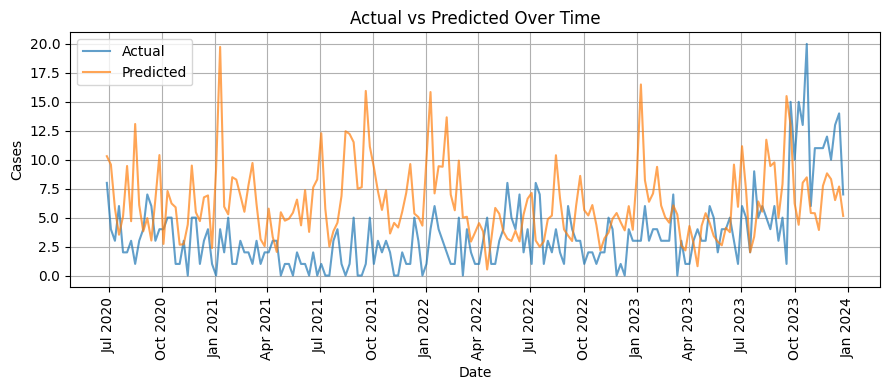


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.9610
   MAE: 3.6226
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


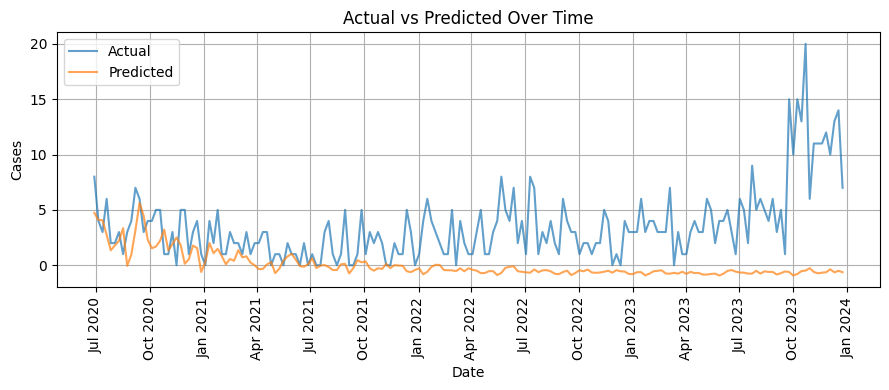


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.3107
   MAE: 3.6251
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


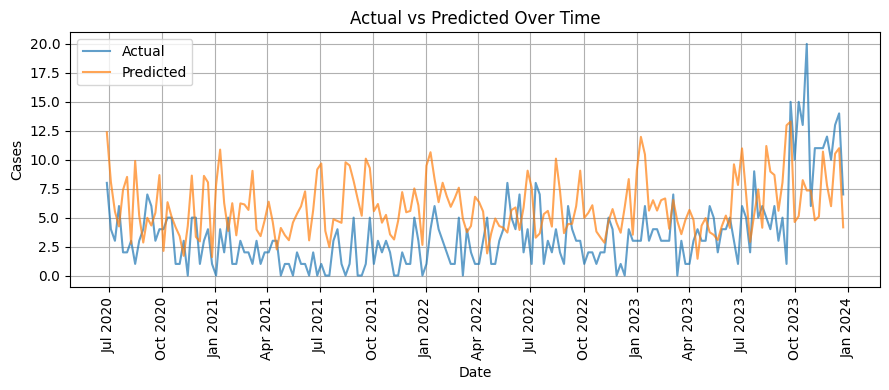


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 0, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 2.9404
   MAE: 2.1906
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


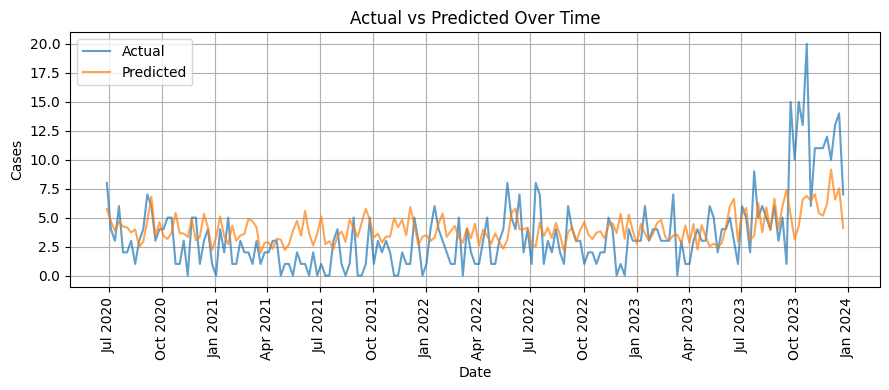


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 2725201587135976355990491645890905687172715084179596004282073088.0000
   MAE: 349756200571112456020703078418726741229824674394056423274184704.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


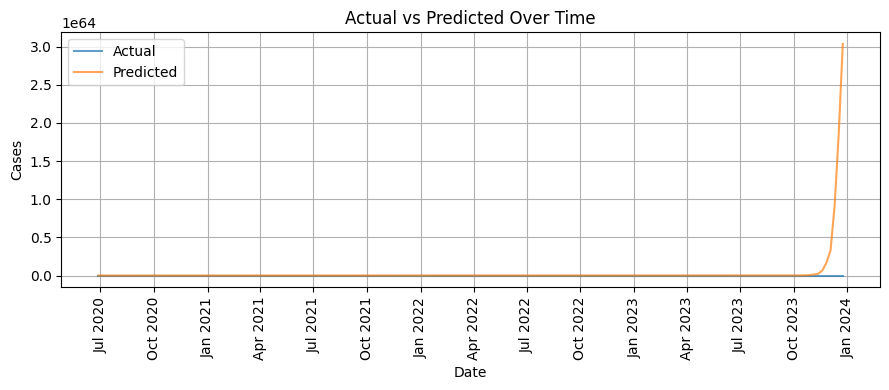


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.4721
   MAE: 4.3803
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


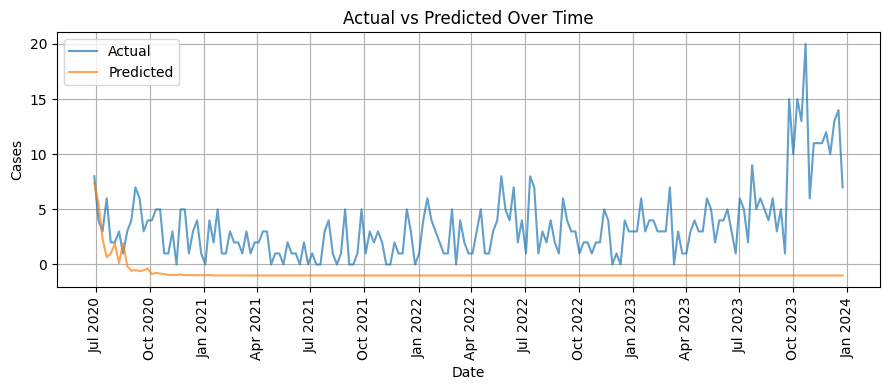


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}

❌ Error usando los parametros: use_log=True, target=absolute, fechas=['2017-01-01', '2020-06-28', '2024-01-01'], params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   -> Error: Input contains infinity or a value too large for dtype('float64').


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 99472348167183164398325456215288343234084864.0000
   MAE: 12967742215043211804005437066300921816809472.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


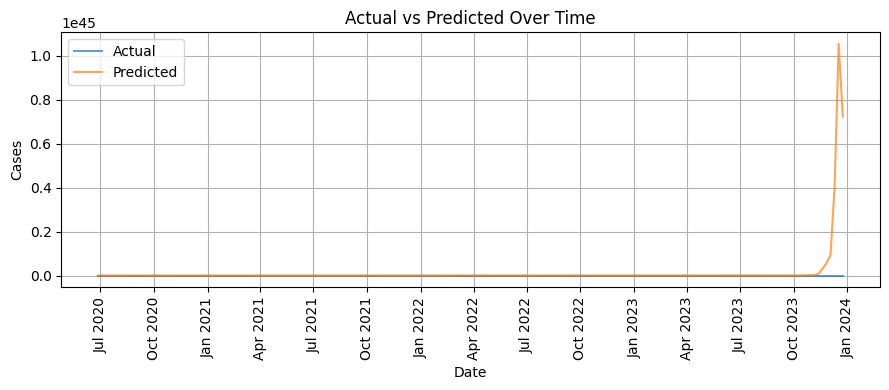


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 27156454835700781583022363342276919082728923456611782717911310564426494188718321464529387520.0000
   MAE: 2804057609878778745156537714771295123062970911351022896189708595131886132648553709351993344.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


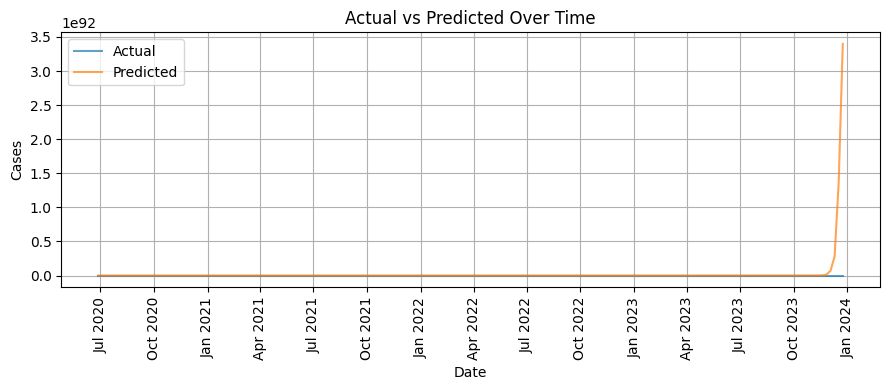


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 42225674589422246386977050195918848.0000
   MAE: 6900408136815788682182079769739264.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


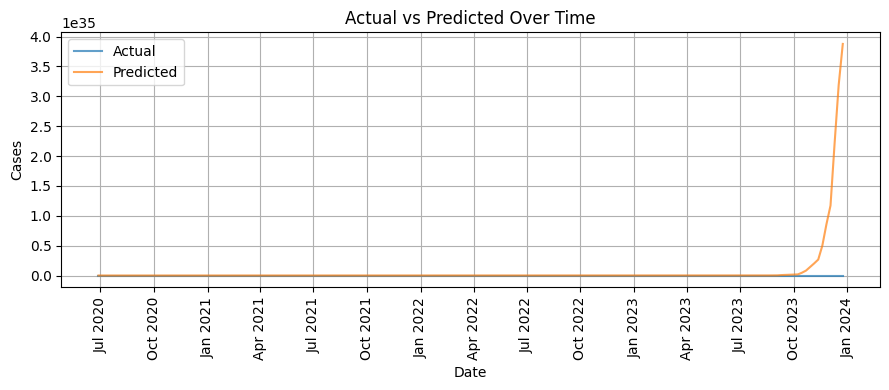


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5940967467072351.0000
   MAE: 1134798753269998.2500
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


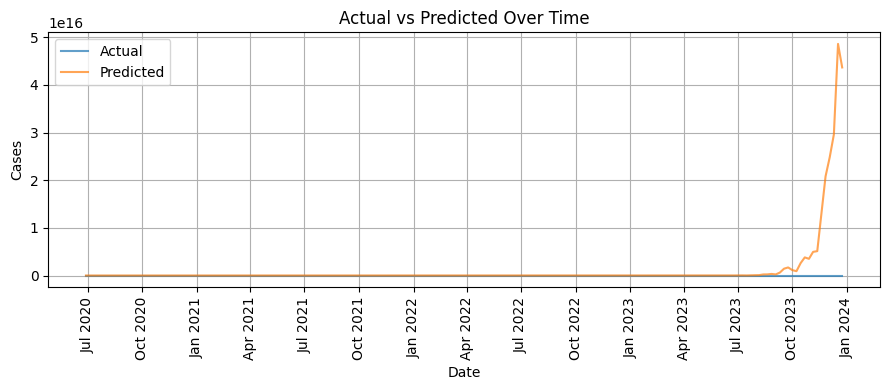


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: inf
   MAE: 1169969581076345587036067774340084705739878833410361455503860014291155827949819608152127220493747103624292926329381277075491920985271566073732143280020016592615183348158955520.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


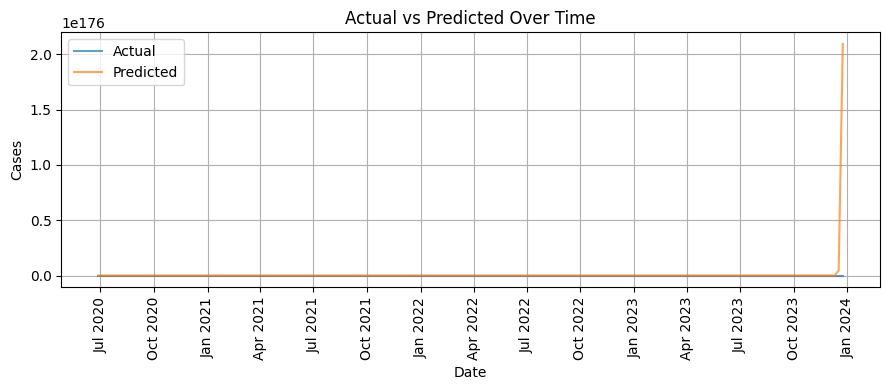


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 33688189087003933693003252027861223079936.0000
   MAE: 4503345579514078679855340390936530124800.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


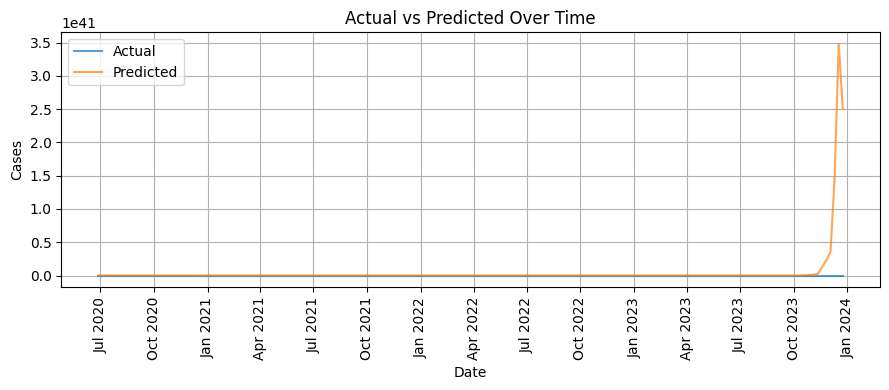


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 0), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 20192833008683171008476144992256.0000
   MAE: 3186151982807123466901191131136.0000
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


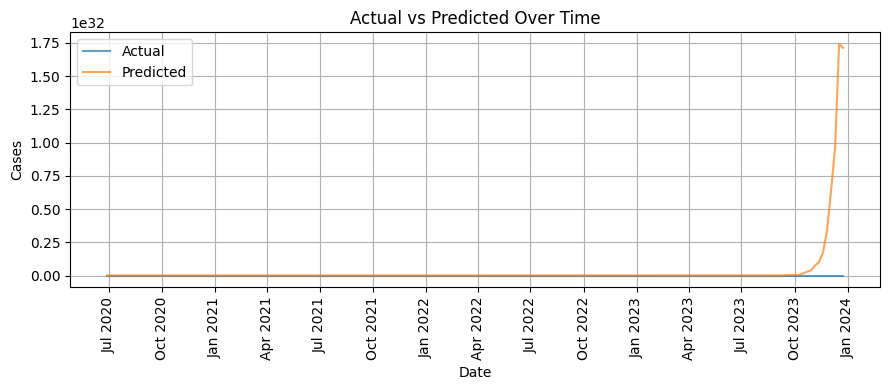


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.1841
   MAE: 2.8780
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


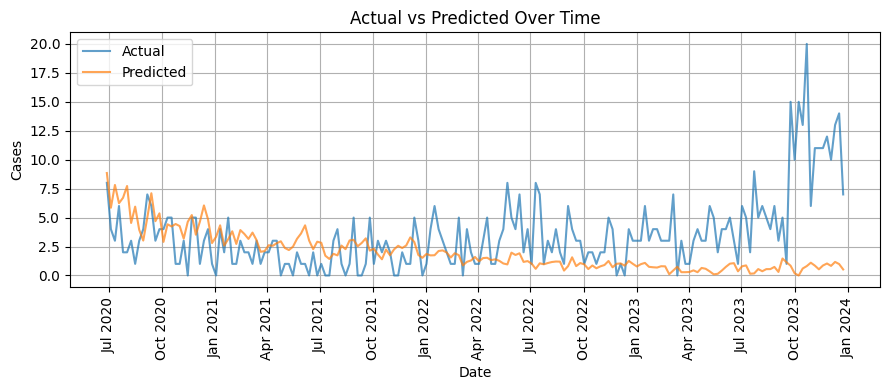


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 1093.0838
   MAE: 448.2856
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


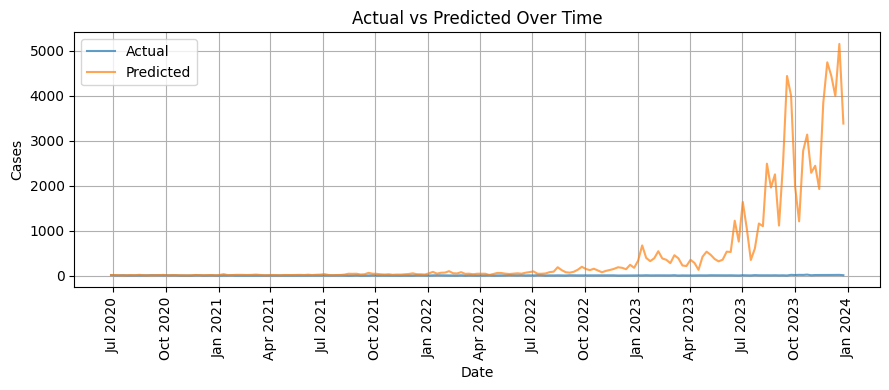


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.1601
   MAE: 3.8601
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


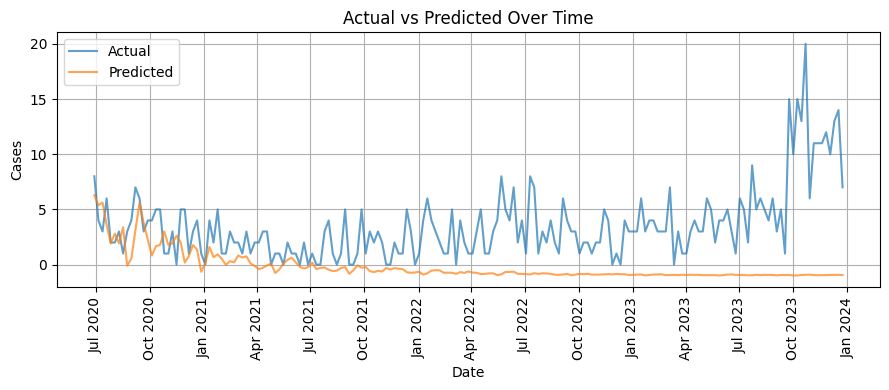


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 1512.2850
   MAE: 591.3448
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


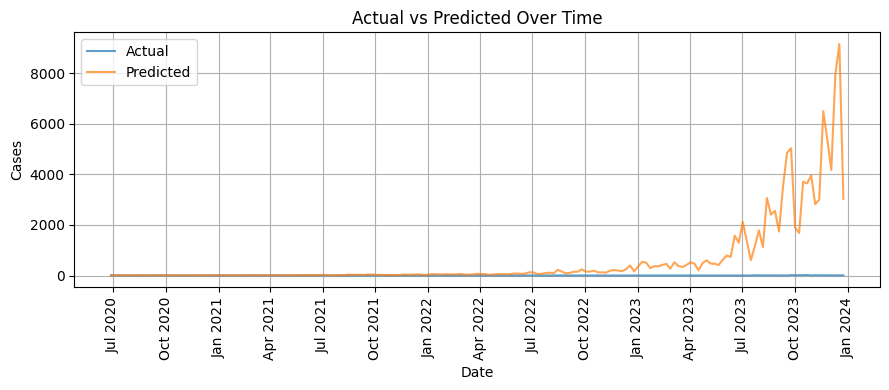


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (0, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 52.9097
   MAE: 28.2262
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


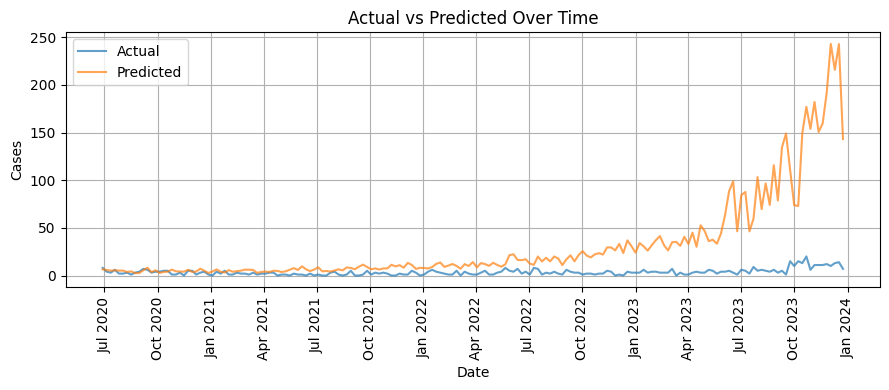


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (0, 0, 0, 0), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 4.3562
   MAE: 2.9585
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


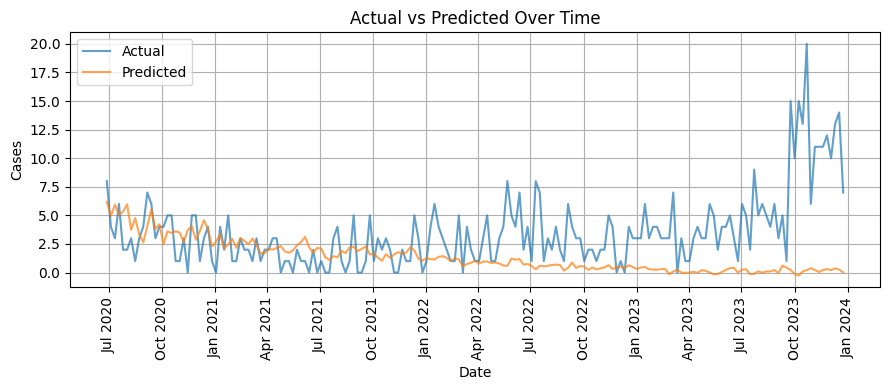


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 1314.5371
   MAE: 553.9462
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


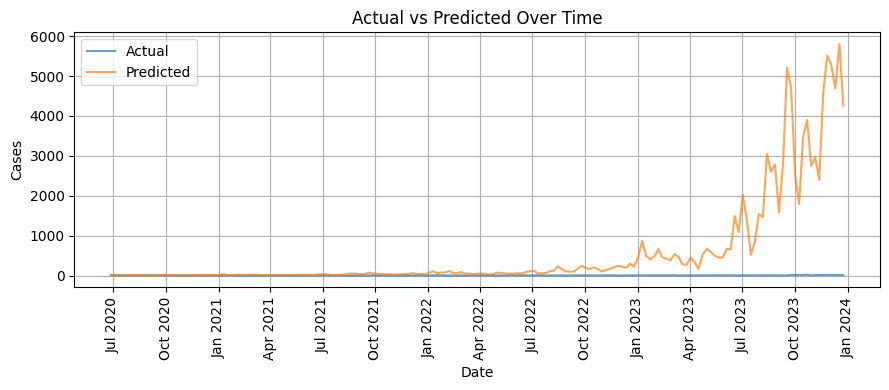


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 0, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 5.2448
   MAE: 4.0028
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


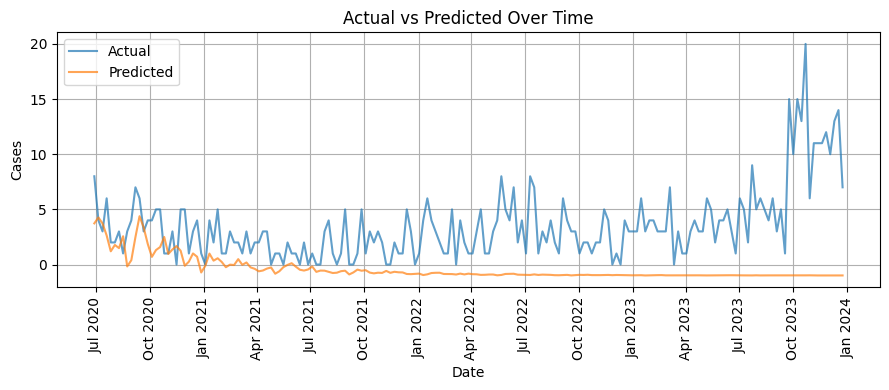


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 52), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 770.4343
   MAE: 327.9682
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


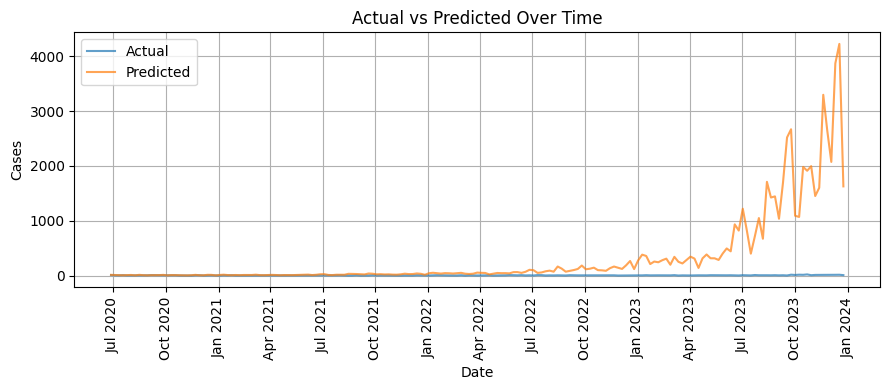


🔹 Ejecutando: use_log=True | target=absolute | fechas=['2017-01-01', '2020-06-28', '2024-01-01'] | params_sarimax={'order': (1, 2, 1), 'seasonal_order': (1, 1, 1, 18), 'trend': 'n'}
   📊 --- Model Evaluation ---
   RMSE: 35.4725
   MAE: 20.2233
   ❌ Modelo NO candidato (no mejora lo esperado sobre naive)


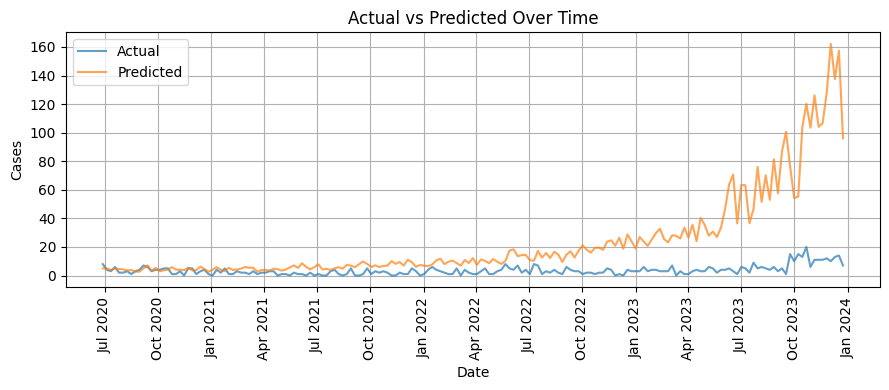

In [7]:
for use_log, target, dates, params_sarimax in itertools.product(use_logs, targets, dates_tuples, param_list):
    try:
        params = {"exog": True, "add_outlier": True, "use_log": use_log, "target_mode": target}
        start_date, test_date, end_date = dates
        print(f"\n🔹 Ejecutando: use_log={use_log} | target={target} | fechas={dates} | params_sarimax={params_sarimax}")

        df = pd.read_pickle(f"{PROJECT_ROOT}/data/model/data.pkl")
        df = df.drop(columns=["CASES_LAG1", "CASES_LAG18", "CASES_LAG16", "CASES_LAG3"], axis=1)
        df = format_df(df, **params)
        # print(df.head())

        train_df, test_df = split_by_date(df, start_date, test_date, end_date)

        X_train = train_df.drop(columns=["CASES"])
        y_train = train_df["CASES"]
        X_test = test_df.drop(columns=["CASES"])
        X_test["OUTLIER"] = 0
        y_test = test_df["CASES"]
        scaler_x = MinMaxScaler()
        X_train[:] = scaler_x.fit_transform(X_train)
        X_test[:]  = scaler_x.transform(X_test)

        # Backtest forecaster
        forecaster = ForecasterSarimax(
            regressor=Sarimax(
                **params_sarimax,
                maxiter=200
            )
        )

        forecaster.fit(
            y    = y_train,
            exog = X_train
        )

        y_pred = forecaster.predict(
            steps = len(y_test),
            exog  = X_test
        )

        y_true = test_df["CASES"]
        y_pred = y_pred.squeeze()
        y_pred.name = "CASES"

        y_pred = inverse_transform_target(
            y_pred,
            train_df["CASES"].values,
            use_log=params["use_log"],
            target_mode=params["target_mode"],
        )
        y_true = inverse_transform_target(
            y_true,
            train_df["CASES"].values,
            use_log=params["use_log"],
            target_mode=params["target_mode"],
        )

        y_true = pd.Series(y_true, index=test_df.index)
        y_pred = pd.Series(y_pred, index=test_df.index)

        evaluate_model(y_true, y_pred)
        plot_predictions(test_df.index[:len(y_true)], y_true, y_pred)

    except Exception as e:
        print(f"\n❌ Error usando los parametros: use_log={use_log}, target={target}, fechas={dates}, params_sarimax={params_sarimax}")
        print(f"   -> Error: {e}\n")
